# **Сегментация изображений с пораженными участками кожи**

В этом ноутбуке представлено небольшое исследование, в ходе которого:

* Была решена задача сегментации изображений с пораженными участками кожи.

* Были реализованы нейронные сети с архитектурами `SegNet`, `U-Net`, `"U-Net2"`.

* Были имплементированы различные функции потерь для задачи сегментации (`Binary Cross Entropy`, `Dice`, `Focal Loss`, `SupVis Loss`, `Structural Similarity Loss`, `Tversky Loss`, `Weighted Cross Entropy`).

* Были обучены все возможные модели из нейронных сетей с архитектурами и лоссами, упомянутыми выше.

* А также было проведено сравнение всех этих моделей с целью установления наиболее подходящей для решения данной задачи.

Данное исследование проведено в рамках обучения в [Deep Learning School](https://www.dlschool.org).

## Data Description
В качестве набора данных используется датасет с медицинскими снимками пораженных участков кожи [ADDI project](https://www.fc.up.pt/addi/ph2%20database.html).





## Содержание

1. [Подготовка данных и среды](#preparing)

    - [Data Preparation](#data_preparation)

    - [PyTorch DataLoader](#dataloader)


2. [Реализация различных архитектур](#architectures)

    - [SegNet](#segnet)

    - [Метрика IoU (Intersection over Union)](#iou)

    - [Binary Cross Entropy](#bce)

    - [Тренировка](#train)

    - [Инференс](#inference)

    - [Основной момент: обучение](#learning)

    - [SegNet с Binary Cross Entropy](#seg_bce)
    

3. [Дополнительные функции потерь](#losses)

    - [SegNet с функцией потерь Dice](#dice)

    - [SegNet с Focal Loss](#focal)
    

4. [Мир сегментационных лоссов](#world_losses)

    - [SupVis Loss](#supvis)

    - [Structural Similarity Loss](#strucsim)

    - [Tversky Loss](#tversky)

    - [Weighted Cross Entropy](#wce)
    

5. [U-Net](#unet)

    - [Train & Test U-Net](#tt_unet)
    

6. [U-Net (2 версия)](#unet2)

    - [Train & Test U-Net2](#tt_unet2)
    

7. [Результаты](#report)

    - [Best of the best 🥇](#bob)

    - [Как ты не крути, но мы не пара 🙅](#spinit)

    - [Больше значит лучше? 🐘](#more_is_better)

    - [Динамика обучения 🏃](#dynamics)

    - [Что можно было бы улучшить? 🤔](#improve)
    

<a id='improve'></a>


---
<a id='preparing'></a>
# Подготовка данных и среды

<a id='data_preparation'></a>
## Data Preparation
1. Для начала мы скачаем датасет: [ADDI project](https://www.fc.up.pt/addi/ph2%20database.html).

2. Разархивируем .rar файл.

<table><tr><td>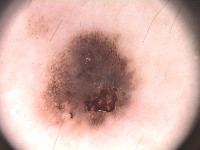</td><td>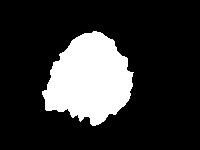</td></tr></table>


Это фотографии двух типов **поражений кожи:** меланома и родинки.
В данном исследовании мы не будем заниматься их классификацией, а будем **сегментировать** их.

In [ ]:
!pip install googledrivedownloader

In [ ]:
from google_drive_downloader import GoogleDriveDownloader as gdd

gdd.download_file_from_google_drive(file_id='1VtEDXKLJSe0-x3RnQvlvZZv9bqKMte0h',
                                    dest_path='./PH2Dataset.rar',
                                    unzip=False)

In [ ]:
get_ipython().system_raw("unrar x PH2Dataset.rar")

Стуктура датасета у нас следующая:

    IMD_002/
        IMD002_Dermoscopic_Image/
            IMD002.bmp
        IMD002_lesion/
            IMD002_lesion.bmp
        IMD002_roi/
            ...
    IMD_003/
        ...
        ...

 Здесь `X.bmp` — изображение, которое нужно сегментировать, `X_lesion.bmp` — результат сегментации.

In [ ]:
import torch
import numpy as np
import os

# Задать зерно генераторов случайных чисел
# для воспроизводимости результатов


def set_seed(seed):
    np.random.seed(seed)
    torch.manual_seed(seed)
    torch.use_deterministic_algorithms(True)
    torch.cuda.manual_seed(seed)
    torch.backends.cudnn.deterministic = True
    torch.backends.cudnn.benchmark = False
    os.environ['PYTHONHASHSEED'] = str(seed)


set_seed(123)

Для загрузки датасета будем использовать skimage: [`skimage.io.imread()`](https://scikit-image.org/docs/dev/api/skimage.io.html)

In [ ]:
from skimage.io import imread
images = []
lesions = []
root = 'PH2Dataset'

for root, dirs, files in os.walk(os.path.join(root, 'PH2 Dataset images')):
    if root.endswith('_Dermoscopic_Image'):
        images.append(imread(os.path.join(root, files[0])))
    if root.endswith('_lesion'):
        lesions.append(imread(os.path.join(root, files[0])))

Изображения имеют разные размеры. Изменим их размер на $256\times256 $ пикселей. Для изменения размера изображений воспользуемся [`skimage.transform.resize()`](https://scikit-image.org/docs/dev/api/skimage.transform.html#skimage.transform.resize).
Эта функция также автоматически нормализует изображения в диапазоне $[0,1]$.


In [ ]:
from skimage.transform import resize
size = (256, 256)
X = [resize(x, size, mode='constant', anti_aliasing=True,) for x in images]
Y = [resize(y, size, mode='constant', anti_aliasing=False)
     > 0.5 for y in lesions]

In [ ]:
X = np.array(X, np.float32)
Y = np.array(Y, np.float32)
print(f'Loaded {len(X)} images')

Loaded 200 images


In [ ]:
len(lesions)

200

Чтобы убедиться, что все корректно, нарисуем несколько изображений

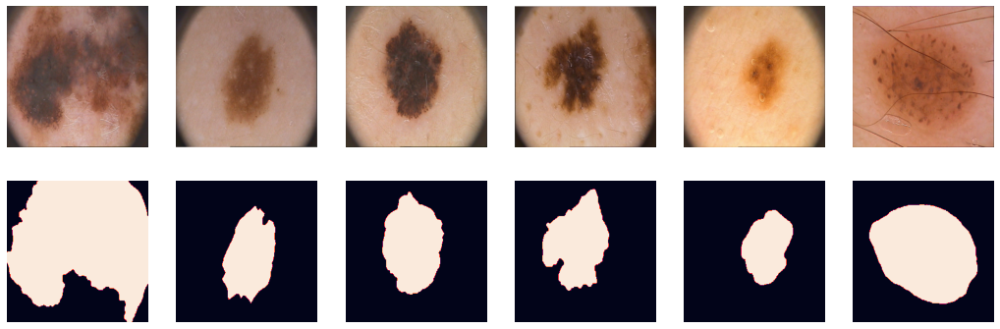

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns
from IPython.display import clear_output

sns.set(style="whitegrid", font_scale=1.4)

plt.figure(figsize=(18, 6))
for i in range(6):
    plt.subplot(2, 6, i+1)
    plt.axis("off")
    plt.imshow(X[i])

    plt.subplot(2, 6, i+7)
    plt.axis("off")
    plt.imshow(Y[i])
plt.show()

Разделим наши 200 картинок на 100/50/50
 для обучения, валидации и теста, соответственно

In [ ]:
ix = np.random.choice(len(X), len(X), False)
tr, val, ts = np.split(ix, [100, 150])

In [ ]:
print(len(tr), len(val), len(ts))

100 50 50


<a id='dataloader'></a>
## PyTorch DataLoader

In [ ]:
from torch.utils.data import DataLoader
batch_size = 10
data_tr = DataLoader(list(zip(np.rollaxis(X[tr], 3, 1), Y[tr, np.newaxis])),
                     batch_size=batch_size, shuffle=True)
data_val = DataLoader(list(zip(np.rollaxis(X[val], 3, 1), Y[val, np.newaxis])),
                      batch_size=batch_size, shuffle=True)
data_ts = DataLoader(list(zip(np.rollaxis(X[ts], 3, 1), Y[ts, np.newaxis])),
                     batch_size=batch_size, shuffle=True)

In [ ]:
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
print(device)

cuda


In [ ]:
X.shape

(200, 256, 256, 3)

<a id='architectures'></a>
# Реализация различных архитектур
Напишем несколько нейросетевых архитектур для решения задачи семантической сегментации. Сравним их по качеству на тесте и испробуем различные лосс функции для них.

In [ ]:
import torch
import torch.nn as nn
import torch.nn.functional as F
from torchvision import models
import torch.optim as optim
from torch.optim import lr_scheduler

from time import time
import tqdm

from matplotlib import rcParams
rcParams['figure.figsize'] = (15, 4)




---


<a id='egnet'></a>
# SegNet

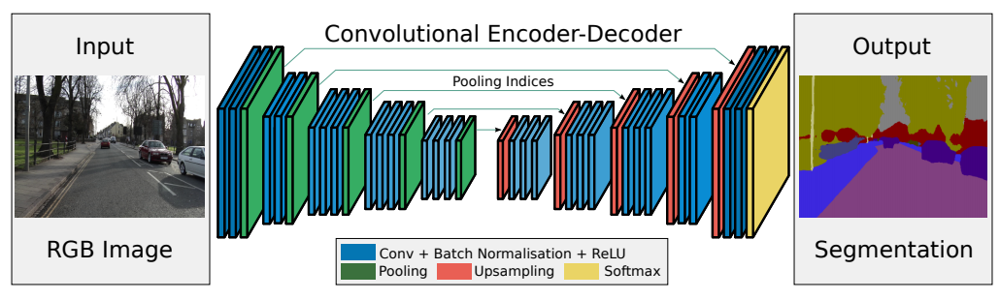

* Badrinarayanan, V., Kendall, A., & Cipolla, R. (2015). [SegNet: A deep convolutional
encoder-decoder architecture for image segmentation](https://arxiv.org/pdf/1511.00561.pdf)

В [оригинальной статье]((https://arxiv.org/pdf/1511.00561.pdf)) написано, что encoding часть SegNet'a соответствует первым слоям VGG-16. Посмотрим на архитектуру VGG-16 с батч нормами.

In [ ]:
list(models.vgg16_bn().children())

[Sequential(
   (0): Conv2d(3, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
   (1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
   (2): ReLU(inplace=True)
   (3): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
   (4): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
   (5): ReLU(inplace=True)
   (6): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
   (7): Conv2d(64, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
   (8): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
   (9): ReLU(inplace=True)
   (10): Conv2d(128, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
   (11): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
   (12): ReLU(inplace=True)
   (13): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
   (14): Conv2d(128, 256, kernel_size=(3, 3), stride=(1, 

На рисунке выше с архитектурой SegNet видно, что в ней есть повторяющиеся `(Conv + BatchNorm + ReLU)` слои, которые выделены синим цветом. Для удобства работы с ними создадим следующую функцую:

In [ ]:
def encod_conv(in_channels, out_channels, deep=1):
    """
    deep - количество (Conv + BatchNorm + ReLU) слоев
    """
    input_layer = (
        nn.Conv2d(in_channels, out_channels,
                  kernel_size=(3, 3), padding=(1, 1)),
        nn.BatchNorm2d(out_channels),
        nn.ReLU()
    )
    hidden_layer = (
        nn.Conv2d(out_channels, out_channels,
                  kernel_size=(3, 3), padding=(1, 1)),
        nn.BatchNorm2d(out_channels),
        nn.ReLU()
    )
    return nn.Sequential(*(input_layer + (deep - 1) * hidden_layer))

In [ ]:
class SegNet(nn.Module):
    def __init__(self):
        super().__init__()

        # encoder (downsampling)
        # bs - batch_size
        # input tensor size:                                               (bs, 3, 256, 256)
        # -> (bs, 64, 256, 256)
        self.enc_conv0 = encod_conv(3, 64, deep=2)
        # -> (bs, 64, 128, 128)
        self.pool0 = nn.MaxPool2d(kernel_size=2, return_indices=True)
        # -> (bs, 128, 128, 128)
        self.enc_conv1 = encod_conv(64, 128, deep=2)
        self.pool1 = nn.MaxPool2d(
            kernel_size=2, return_indices=True)  # -> (bs, 128, 64, 64)
        # -> (bs, 256, 64, 64)
        self.enc_conv2 = encod_conv(128, 256, deep=3)
        self.pool2 = nn.MaxPool2d(
            kernel_size=2, return_indices=True)  # -> (bs, 256, 32, 32)
        # -> (bs, 512, 32, 32)
        self.enc_conv3 = encod_conv(256, 512, deep=3)
        self.pool3 = nn.MaxPool2d(
            kernel_size=2, return_indices=True)  # -> (bs, 512, 16, 16)

        # bottleneck
        self.bottleneck_enc_conv = encod_conv(
            512, 512, deep=3)       # -> (bs, 512, 16, 16)
        self.bottleneck_pool = nn.MaxPool2d(
            kernel_size=2, return_indices=True)  # -> (bs, 512, 8, 8)
        self.bottleneck_upsample = nn.MaxUnpool2d(
            kernel_size=2)      # -> (bs, 512, 16, 16)
        self.bottleneck_dec_conv = encod_conv(
            512, 512, deep=3)       # -> (bs, 512, 16, 16)

        # decoder (upsampling)
        self.upsample0 = nn.MaxUnpool2d(kernel_size=2)  # -> (bs, 512, 32, 32)
        self.dec_conv0 = encod_conv(512, 256, deep=3)  # -> (bs, 256, 32, 32)
        self.upsample1 = nn.MaxUnpool2d(kernel_size=2)  # -> (bs, 256, 64, 64)
        self.dec_conv1 = encod_conv(256, 128, deep=3)  # -> (bs, 128, 64, 64)
        self.upsample2 = nn.MaxUnpool2d(
            kernel_size=2)  # -> (bs, 128, 128, 128)
        self.dec_conv2 = encod_conv(128, 64, deep=2)   # -> (bs, 64, 128, 128)
        self.upsample3 = nn.MaxUnpool2d(kernel_size=2)  # -> (bs, 64, 256, 256)
        self.dec_conv3 = encod_conv(64, 1, deep=2)     # -> (bs, 1, 256, 256)
        # Поскольку у нас задача бинарной семантической сегментации:
        # поражение кожи (1) и фон (0), то для выходного слоя задаем output=1

    def forward(self, x):
        # encoder
        e0, e0_idx = self.pool0(self.enc_conv0(x))  # idx = indexes
        e1, e1_idx = self.pool1(self.enc_conv1(e0))
        e2, e2_idx = self.pool2(self.enc_conv2(e1))
        e3, e3_idx = self.pool3(self.enc_conv3(e2))

        # bottleneck
        b_enc, b_enc_idx = self.bottleneck_pool(self.bottleneck_enc_conv(e3))
        b_dec = self.bottleneck_dec_conv(
            self.bottleneck_upsample(b_enc, b_enc_idx)
        )

        # decoder
        d0 = self.dec_conv0(self.upsample0(b_dec, e3_idx))
        d1 = self.dec_conv1(self.upsample1(d0, e2_idx))
        d2 = self.dec_conv2(self.upsample2(d1, e1_idx))
        d3 = self.dec_conv3(self.upsample3(d2, e0_idx))  # no activation

        return d3

Посмотрим на архитектуру нашей сети:

In [ ]:
from torchsummary import summary

model_SegNet = SegNet().to(device)
summary(model_SegNet, (3, 256, 256))

----------------------------------------------------------------
        Layer (type)               Output Shape         Param #
            Conv2d-1         [-1, 64, 256, 256]           1,792
       BatchNorm2d-2         [-1, 64, 256, 256]             128
              ReLU-3         [-1, 64, 256, 256]               0
            Conv2d-4         [-1, 64, 256, 256]          36,928
       BatchNorm2d-5         [-1, 64, 256, 256]             128
              ReLU-6         [-1, 64, 256, 256]               0
         MaxPool2d-7  [[-1, 64, 128, 128], [-1, 64, 128, 128]]               0
            Conv2d-8        [-1, 128, 128, 128]          73,856
       BatchNorm2d-9        [-1, 128, 128, 128]             256
             ReLU-10        [-1, 128, 128, 128]               0
           Conv2d-11        [-1, 128, 128, 128]         147,584
      BatchNorm2d-12        [-1, 128, 128, 128]             256
             ReLU-13        [-1, 128, 128, 128]               0
        MaxPool2d-14  [[

<a id='iou'></a>
## Метрика IoU (Intersection over Union) 

В данном разделе будем использовать следующую метрику для оценки качества:

$I o U=\frac{\text {target } \cap \text { prediction }}{\text {target } \cup{prediction }}$

Пересечение (A ∩ B) состоит из пикселей, найденных как в маске предсказания, так и в основной маске истины, тогда как объединение (A ∪ B) просто состоит из всех пикселей, найденных либо в маске предсказания, либо в целевой маске.


Для примера посмотрим на истину (слева) и предсказание (справа):
![alt text](https://www.jeremyjordan.me/content/images/2018/05/target_prediction.png)


Тогда пересечение и объединение будет выглядеть так:

![alt text](https://www.jeremyjordan.me/content/images/2018/05/intersection_union.png)

In [ ]:
def iou_pytorch(outputs: torch.Tensor, labels: torch.Tensor):
    # You can comment out this line if you are passing tensors of equal shape
    # But if you are passing output from UNet or something it will most probably
    # be with the BATCH x 1 x H x W shape
    outputs = outputs.squeeze(1).byte()  # BATCH x 1 x H x W => BATCH x H x W
    labels = labels.squeeze(1).byte()
    SMOOTH = 1e-8
    intersection = (outputs & labels).float().sum(
        (1, 2))  # Will be zero if Truth=0 or Prediction=0
    union = (outputs | labels).float().sum(
        (1, 2))         # Will be zzero if both are 0

    # We smooth our devision to avoid 0/0
    iou = (intersection + SMOOTH) / (union + SMOOTH)

    # This is equal to comparing with thresolds
    thresholded = torch.clamp(20 * (iou - 0.5), 0, 10).ceil() / 10

    return thresholded

<a id='bce'></a>
## Функция потерь Binary Cross Entropy

Не менее важным, чем построение архитектуры, является определение **оптимизатора** и **функции потерь.**

Функция потерь - это то, что мы пытаемся минимизировать. Многие из них могут быть использованы для задачи бинарной семантической сегментации. 

Популярным методом для бинарной сегментации является *бинарная кросс-энтропия*, которая задается следующим образом:

$$\mathcal L_{BCE}(y, \hat y) = -\sum_i \left[y_i\log\sigma(\hat y_i) + (1-y_i)\log(1-\sigma(\hat y_i))\right].$$

где $y$ – это  таргет желаемого результата и $\hat y$ является выходом модели. $\sigma$ – это [*логистическая* функция](https://en.wikipedia.org/wiki/Sigmoid_function), которая преобразует действительное число $\mathbb R$ в вероятность $[0,1]$.

Однако эта потеря страдает от проблем численной нестабильности. Самое главное, что $\lim_{x\rightarrow0}\log(x)=\infty$ приводит к неустойчивости в процессе оптимизации. Существует следующее [упрощение](https://www.tensorflow.org/api_docs/python/tf/nn/sigmoid_cross_entropy_with_logits). Эта функция эквивалентна первой и не так подвержена численной неустойчивости:

$$\mathcal L_{BCE} = \hat y - y\hat y + \log\left(1+\exp(-\hat y)\right).$$

In [ ]:
def bce_loss(y_pred, y_real):
    return (y_pred - y_real * y_pred + torch.log(1 + torch.exp(-y_pred))).mean()


# Также в pytorch есть встроенная функция nn.BCELoss(y_real, y_pred)
# Она расчитывает BCE_Loss по первой формуле с домножением суммы
# на нормировочный множитель 1/n (т.е. берёт среднее значение).
# Кроме того, в ней y_pred, которые стоят под логарифмом,
# считаются уже прошедшими через сигмоиды, т.е. лежат в интервале [0, 1]
#
# Реализуем эту функцию:
def bce_like_pytorch(y_pred, y_real):
    return - (y_real * torch.log(y_pred) +
              (1 - y_real) * torch.log(1 - y_pred)).mean()


# Сравнение:
a = torch.FloatTensor(5).uniform_(0, 1)
b = torch.FloatTensor(5).uniform_(0, 1)
bce_like_pytorch(a, b) == nn.BCELoss()(a, b)

tensor(True)

<a id='train'></a>
## Тренировка 

Определим цикл обучения в функции, чтобы мы могли повторно использовать его.

In [ ]:
def train(model, opt, loss_fn, scheduler, data_tr, data_val, epochs=25):
    best_model_wts = model.state_dict()
    best_score = 0.0

    history = {
        'train_loss': [], 'val_loss': [], 'train_score': [], 'val_score': []
    }

    pbar = tqdm.trange(epochs, desc='Epochs')
    for epoch in pbar:
        tic = time()
        print('* Epoch %d/%d' % (epoch+1, epochs))

        train_loss = 0
        val_loss = 0

        # Training phase
        model.train()  # train mode
        for X_batch, Y_batch in data_tr:
            # data to device
            X_batch = X_batch.to(device)
            Y_batch = Y_batch.to(device)
            # set parameter gradients to zero
            opt.zero_grad()
            # forward
            Y_pred = model(X_batch)
            loss = loss_fn(Y_pred, Y_batch)  # forward-pass
            loss.backward()  # backward-pass
            opt.step()  # update weights

            # calculate loss to show the user
            train_loss += loss / len(data_tr)

        history['train_loss'].append(train_loss)
        epoch_train_score = score_model(model, iou_pytorch, data_tr)
        history['train_score'].append(epoch_train_score)

        toc = time()
        print('loss: %f' % train_loss)

        # Validation phase
        # show intermediate results
        model.eval()  # testing mode
        with torch.no_grad():
            for X_val, Y_val in data_val:
                X_val = X_val.to(device)  # data to device
                Y_val = Y_val.to(device)  # data to device

                Y_pred = model(X_val)
                loss = loss_fn(Y_pred, Y_val)
                val_loss += loss / len(data_val)

            history['val_loss'].append(val_loss)
            epoch_val_score = score_model(model, iou_pytorch, data_val)
            history['val_score'].append(epoch_val_score)

        Y_hat = model(X_val.to(device)).detach().to(device)  # = Y_pred

        scheduler.step()

        if epoch_val_score > best_score:
            best_score = epoch_val_score
            best_model_wts = model.state_dict()

        # Visualize tools
        clear_output(wait=True)
        plt.figure(figsize=(18, 9))
        for k in range(6):
            plt.subplot(3, 6, k+1)
            plt.imshow(np.rollaxis(X_val[k].to(
                'cpu').numpy(), 0, 3), cmap='gray')
            plt.title('Real')
            plt.axis('off')

            plt.subplot(3, 6, k+7)
            Y_hat = torch.where(torch.sigmoid(Y_hat) > 0.5, 1, 0)
            plt.imshow(Y_hat[k, 0].to('cpu').numpy(), cmap='gray')
            plt.title('Output')
            plt.axis('off')

            plt.subplot(3, 6, k+13)
            plt.imshow(Y_val[k, 0].to('cpu'), cmap='gray')
            plt.title('Target')
            plt.axis('off')
        plt.suptitle('%d / %d - loss: %f' % (epoch+1, epochs, train_loss))
        plt.show()

    model.load_state_dict(best_model_wts)
    return history

<a id='inference'></a>
## Инференс

После обучения модели эту функцию можно использовать для прогнозирования сегментации на новых данных:

In [ ]:
def predict(model, data):
    model.eval()  # testing mode
    Y_pred = [model(X_batch.to(device)) for X_batch, _ in data]
    return np.array(Y_pred)

In [ ]:
def score_model(model, metric, data):
    model.eval()  # testing mode
    scores = 0
    for X_batch, Y_label in data:
        Y_pred = torch.sigmoid(model(X_batch.to(device))).round()
        scores += metric(Y_pred, Y_label.to(device)).mean().item()

    return scores / len(data)

<a id='learning'></a>
## Основной момент: обучение

В дальнейшем мы будем сравнивать разные нейронные сети и разные лоссы, поэтому для удобства напишем функцию, которая будет принимать на вход нейронную сеть и функцию потерь, обучать сеть, а также строить зависимости лосса и скора в процессе обучения. Поскольку мы хотим сравнить сети и функции потерь, то будем использовать одинаковый оптимизатор `AdamW` и scheduler `StepLR` с одинаковыми параметрами для всех пар (нейронная сеть + функция потерь). 

In [ ]:
def train_test_model(model, loss, n_model, n_loss, max_epochs=60,
                     data_tr=data_tr, data_val=data_val):
    torch.cuda.empty_cache()
    model = model().to(device)
    optim = torch.optim.AdamW(model.parameters(), lr=1e-3)
    exp_lr = lr_scheduler.StepLR(optim, step_size=9, gamma=0.1)

    # Train
    losses = train(model, optim, loss, exp_lr, data_tr, data_val, max_epochs)

    # Scores
    print('For ' + n_model + ' with ' + n_loss + ' Loss:')
    print('Val score: {:.5f}'.format(
        score_model(model, iou_pytorch, data_val)))
    print('Train score: {:.5f}'.format(
        score_model(model, iou_pytorch, data_tr)))

    # Plots
    plt.figure(figsize=(18, 6))
    plt.subplot(1, 2, 1)
    plt.plot(losses['train_loss'], label="train")
    plt.plot(losses['val_loss'], label="val")
    plt.xlabel('epoch')
    plt.ylabel(n_loss + ' Loss')
    plt.title(n_model)
    plt.legend()

    plt.subplot(1, 2, 2)
    plt.plot(losses['train_score'], label="train")
    plt.plot(losses['val_score'], label="val")
    plt.xlabel('epoch')
    plt.ylabel('IoU score (with ' + n_loss + ' Loss)')
    plt.title(n_model)
    plt.legend()
    plt.show()

    return losses

<a id='seg_bce'></a>
## SegNet с Binary Cross Entropy

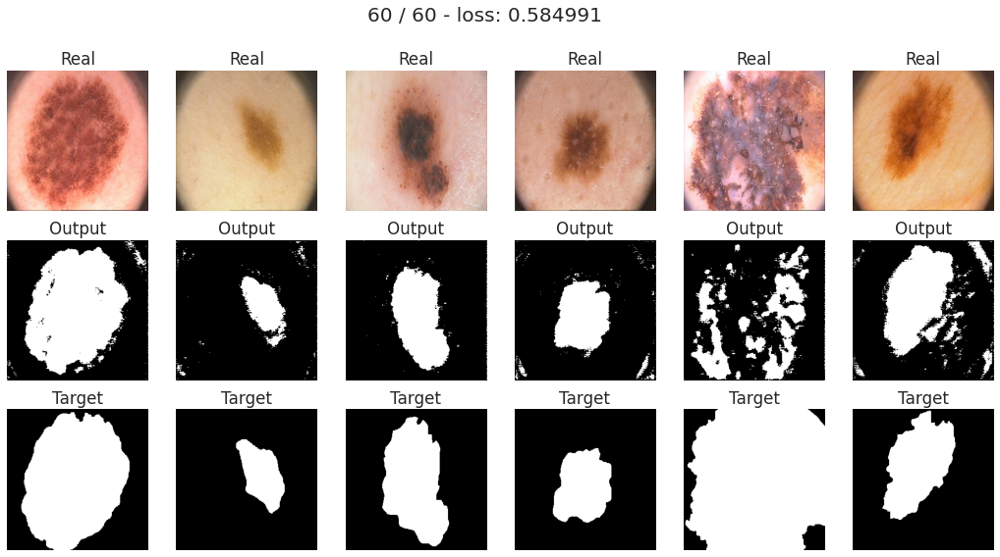

Epochs: 100%|██████████| 60/60 [29:30<00:00, 29.51s/it]


For SegNet with BCE Loss:
Val score: 0.37800
Train score: 0.43600


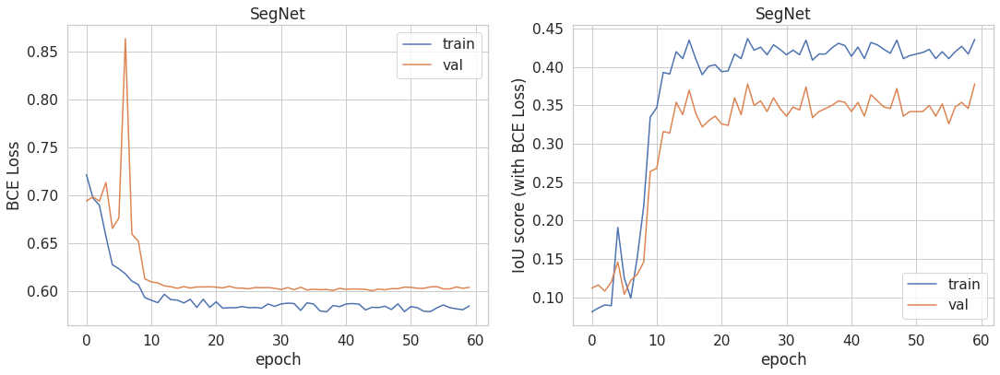

In [ ]:
loss_seg_bce = train_test_model(
    SegNet, bce_loss, n_model='SegNet', n_loss='BCE')



---


<a id='losses'></a>
# Дополнительные функции потерь
В данном разделе мы имплементируем две функции потерь:
 Dice и Focal loss. 


<a id='dice'></a>
## SegNet с функцией потерь Dice
**1. Dice coefficient:** Учитывая две маски $X$ и $Y$, общая метрика для измерения расстояния между этими двумя масками задается следующим образом:

$$D(X,Y)=\frac{2|X\cap Y|}{|X|+|Y|}$$

Эта функция не является дифференцируемой, но это необходимое свойство для градиентного спуска. В данном случае мы можем приблизить его с помощью:

$$\mathcal L_D(X,Y) = 1-\frac{1}{256 \times 256} \times \sum_i\frac{2X_iY_i}{X_i+Y_i}.$$

Также не забываем о численной нестабильности, возникающей в математической формуле.


In [ ]:
def dice_loss(y_pred, y_real):
    SMOOTH = 1e-7
    num = 2 * (y_real * y_pred).sum(dim=(2, 3)) + SMOOTH
    den = (y_real + y_pred).sum(dim=(2, 3)) + SMOOTH
    res = 1 - (num / den).sum() / 256**2
    return res

Проводим тестирование:

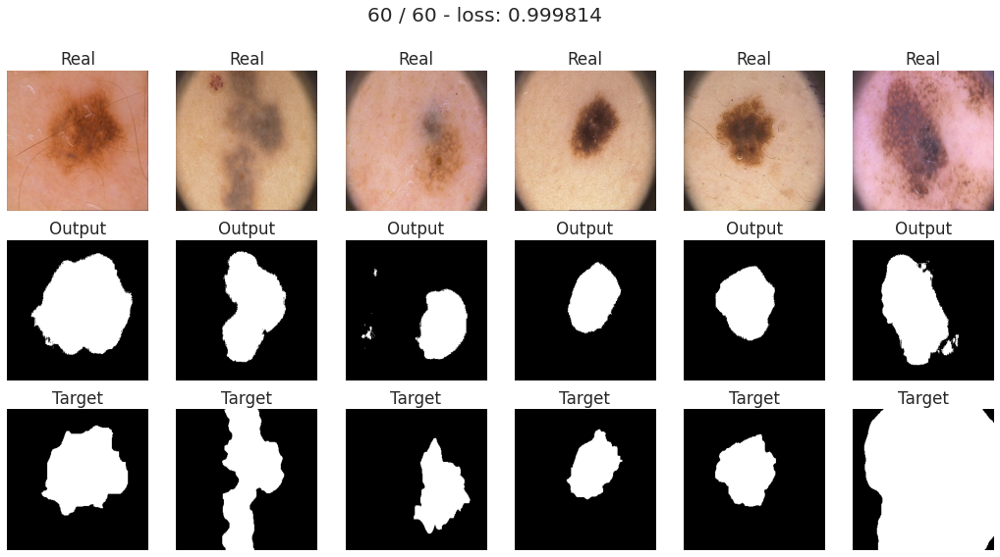

Epochs: 100%|██████████| 60/60 [29:38<00:00, 29.65s/it]


For SegNet with Dice Loss:
Val score: 0.56000
Train score: 0.63800


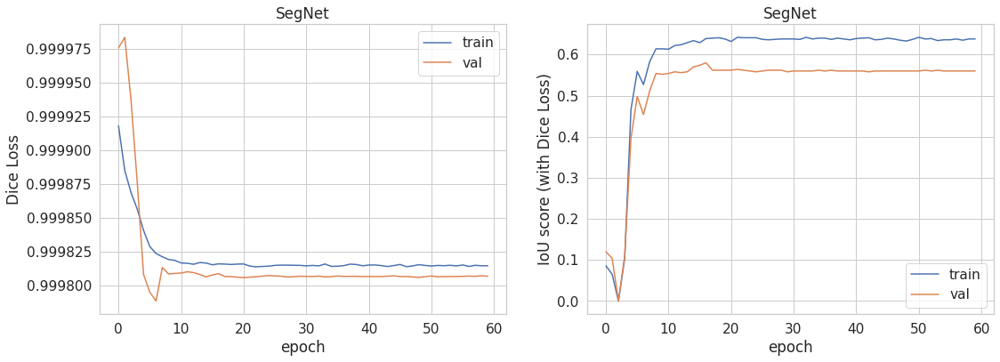

In [ ]:
loss_seg_dice = train_test_model(
    SegNet, dice_loss, n_model='SegNet', n_loss='Dice')

<a id='focal'></a>
## SegNet с Focal Loss
[**2. Focal loss:**](https://arxiv.org/pdf/1708.02002.pdf) 

Окей, мы уже реализовали BCE loss:

$$\mathcal L_{BCE}(y, \hat y) = -\sum_i \left[y_i\log\sigma(\hat y_i) + (1-y_i)\log(1-\sigma(\hat y_i))\right].$$

Проблема с этой потерей заключается в том, что она имеет тенденцию приносить пользу классу **большинства** (фоновому) по отношению к классу **меньшинства** ( переднему). Поэтому обычно применяются весовые коэффициенты к каждому классу:

$$\mathcal L_{wBCE}(y, \hat y) = -\sum_i \alpha_i\left[y_i\log\sigma(\hat y_i) + (1-y_i)\log(1-\sigma(\hat y_i))\right].$$

Традиционно вес $\alpha_i$ определяется как обратная частота класса этого пикселя $i$, так что наблюдения миноритарного класса весят больше по отношению к классу большинства.

Еще одним недавним дополнением является взвешенный пиксельный вариант, который взвешивает каждый пиксель по степени уверенности, которую мы имеем в предсказании этого пикселя.

$$\mathcal L_{focal}(y, \hat y) = -\sum_i \left[\left(1-\sigma(\hat y_i)\right)^\gamma y_i\log\sigma(\hat y_i) + (1-y_i)\log(1-\sigma(\hat y_i))\right].$$

Зафиксируем значение $\gamma=2$.

In [ ]:
def focal_loss(y_pred, y_real, eps=1e-8, gamma=2):
    loss = (torch.clamp(1. - torch.sigmoid(y_pred), eps)**gamma * y_real
            * torch.log(torch.clamp(torch.sigmoid(y_pred), eps)) +
            (1 - y_real) * torch.log(torch.clamp(1 - torch.sigmoid(y_pred), eps)))
    return -torch.mean(loss)

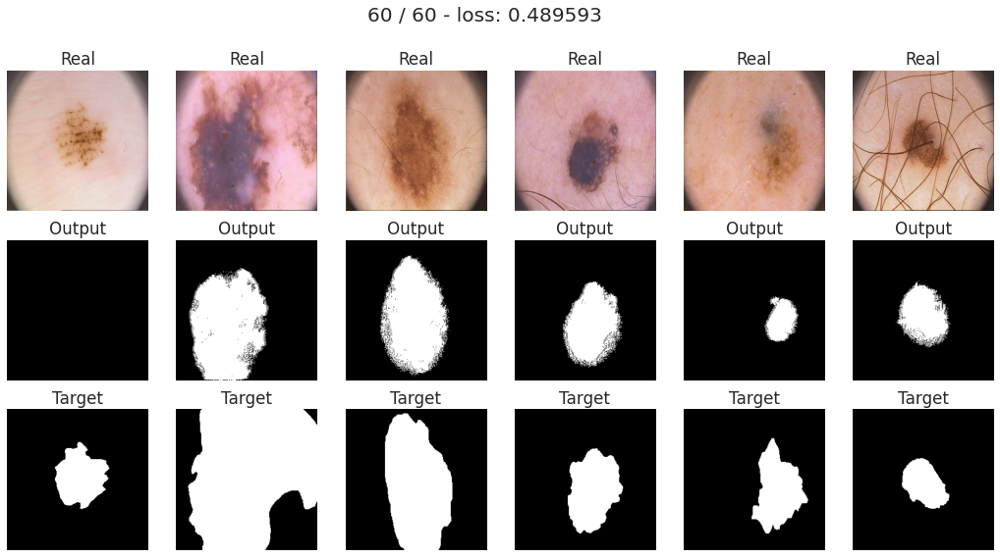

Epochs: 100%|██████████| 60/60 [29:38<00:00, 29.65s/it]


For SegNet with Focal Loss:
Val score: 0.42600
Train score: 0.50000


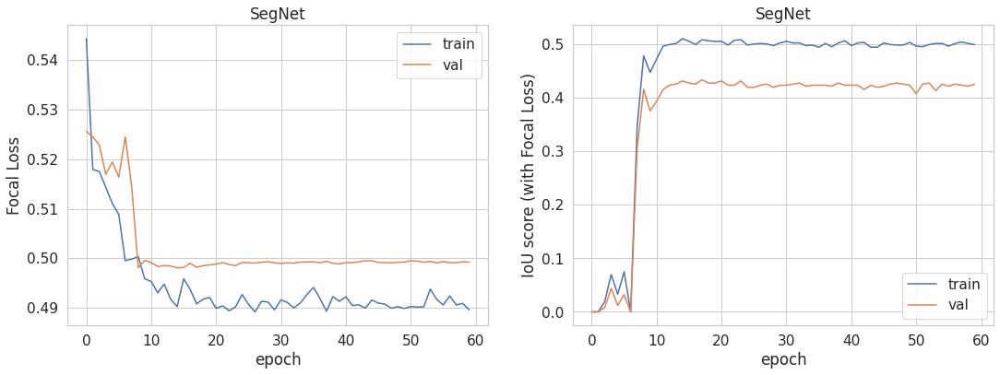

In [ ]:
loss_seg_focal = train_test_model(
    SegNet, focal_loss, n_model='SegNet', n_loss='Focal')



---


<a id='world_losses'></a>
# Мир сегментационных лоссов

В данном блоке реализованы функции потерь для задачи сегментации на основе ряда публикаций.

<a id='supvis'></a>
## SupVis Loss (loss with supervised regularization)
Реализуем функцию потерь из статьи [Physiological Inspired Deep Neural Networks for Emotion Recognition](https://ieeexplore.ieee.org/stamp/stamp.jsp?arnumber=8472816&tag=1). Общепринятного названия для данного лосса я не нашёл, потому для удобства буду называть его *SupVis Loss*.

In [ ]:
def supvis_loss(y_pred, y_real, lamda=0.2, n=256, m=256):
    binary_cross_loss = bce_loss(y_pred, y_real)

    y_real = y_real.squeeze(1).byte()
    y_pred = y_pred.squeeze(1).byte()

    batch_size = 10
    contiguity_loss = (
        torch.abs(y_pred[:, 1:, :] - y_pred[:, :-1, :]).sum(dim=(1, 2)) +
        torch.abs(y_pred[:, :, 1:] - y_pred[:, :, :-1]).sum(dim=(1, 2))
    ).sum() / batch_size  # batch-wise meaning
    contiguity_loss /= n * m
    sparcity_loss = torch.abs(y_pred).sum() / (n * m)

    return binary_cross_loss + lamda * (sparcity_loss + contiguity_loss)

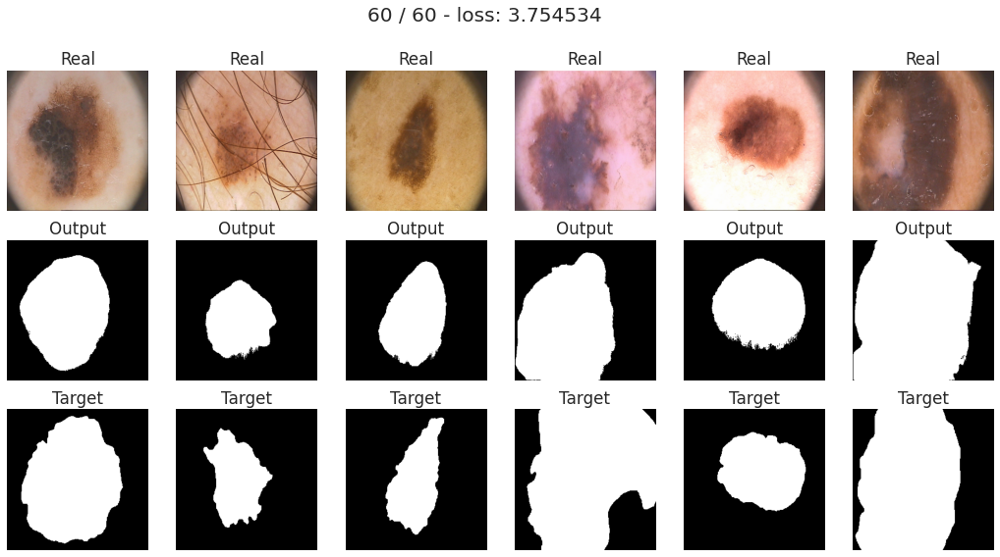

Epochs: 100%|██████████| 60/60 [29:54<00:00, 29.92s/it]


For SegNet with SupVis Loss:
Val score: 0.41400
Train score: 0.48900


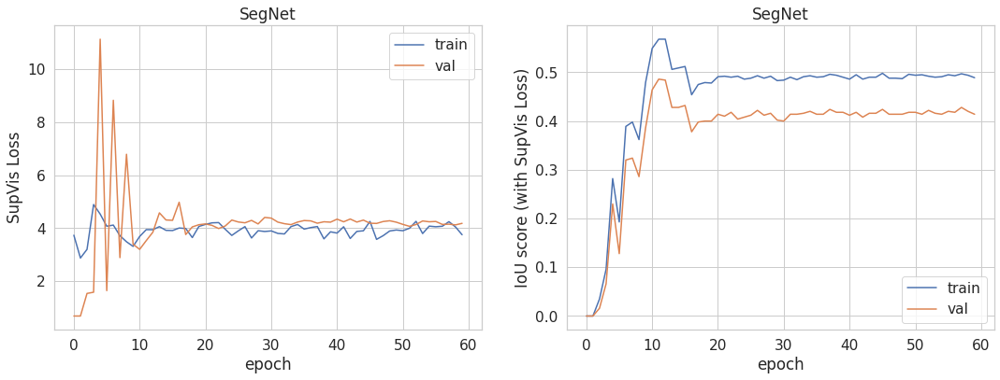

In [ ]:
loss_seg_supvis = train_test_model(
    SegNet, supvis_loss, n_model='SegNet', n_loss='SupVis')

<a id='strucsim'></a>
## Structural Similarity Loss
Реализуем функцию потерь из работы [Correlation Maximized Structural Similarity Loss for Semantic Segmentation](https://arxiv.org/abs/1910.08711)

In [ ]:
def strucsim_loss(y_pred, y_real):
    SMOOTH = 1e-7
    y_real = y_real - y_real.mean()
    y_pred = y_pred - y_pred.mean()
    num = (y_real - y_pred) ** 2
    den = y_real**2 + y_pred**2 + (len(y_real) - 1) * SMOOTH
    loss = num / den
    return loss.mean()

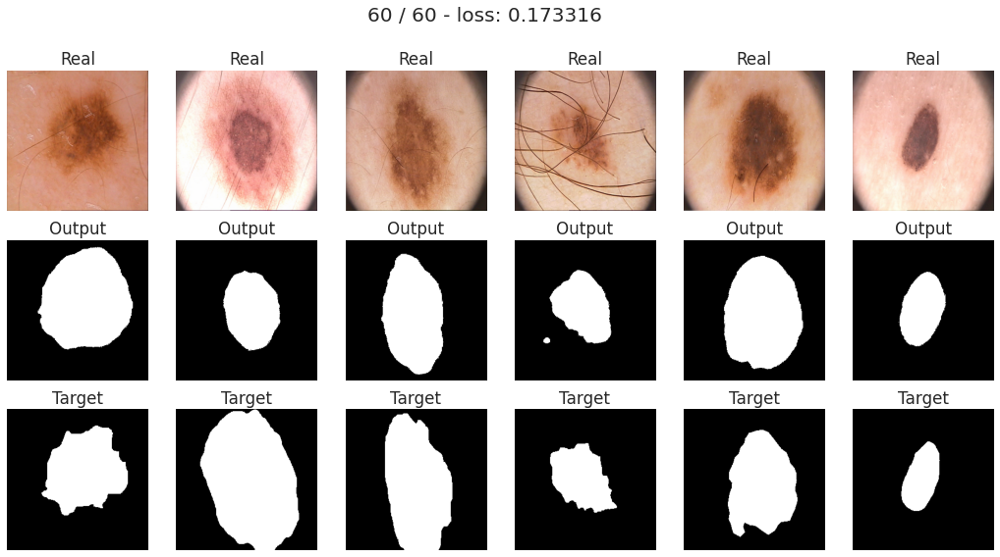

Epochs: 100%|██████████| 60/60 [29:40<00:00, 29.67s/it]


For SegNet with Structural Similarity Loss:
Val score: 0.51000
Train score: 0.61600


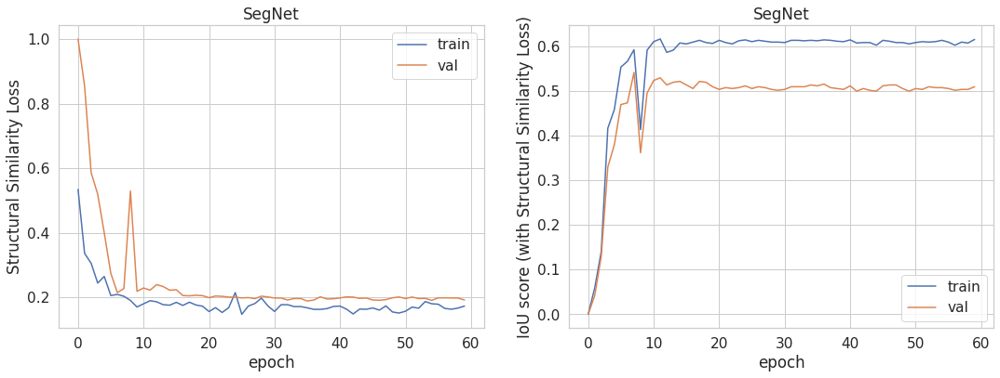

In [ ]:
loss_seg_strucsim = train_test_model(
    SegNet, strucsim_loss, n_model='SegNet', n_loss='Structural Similarity')

<a id='tversky'></a>
## Tversky Loss
Также реализуем лосс из работы [Tversky loss function for image segmentation using 3D fully convolutional deep networks](https://arxiv.org/abs/1706.05721)

In [ ]:
def tversky_loss(y_pred, y_real, alpha=0.5, beta=0.5):
    SMOOTH = 1e-7
    y_real = y_real + SMOOTH
    y_pred = y_pred + SMOOTH
    num = y_real * y_pred
    den = (y_real * y_pred) + alpha * \
        (y_real / y_pred) + beta * (y_pred / y_real)
    res = 1 - (num / den).sum() / 256**2
    return res

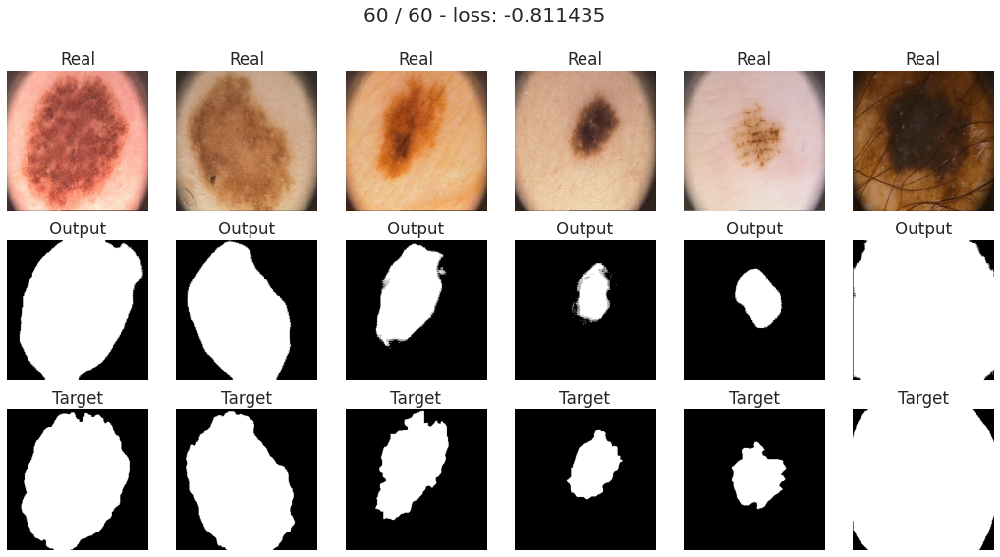

Epochs: 100%|██████████| 60/60 [29:38<00:00, 29.64s/it]


For SegNet with Tversky Loss:
Val score: 0.50600
Train score: 0.61500


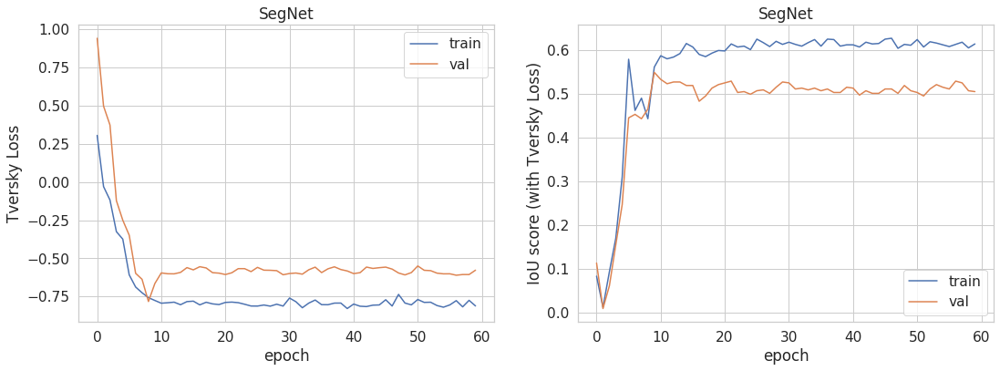

In [ ]:
loss_seg_tversky = train_test_model(
    SegNet, tversky_loss, n_model='SegNet', n_loss='Tversky')

<a id='wce'></a>
## Weighted Cross Entropy 
Теперь попробуем в качестве функции потерь использовать взвешенную кросс-энтропию

In [ ]:
def wce_loss(y_pred, y_real, beta=0.7):
    SMOOTH = 1e-7
    y_pred_proba = torch.sigmoid(y_pred)
    y_pred_proba = torch.clamp(y_pred_proba, 0+SMOOTH, 1-SMOOTH)

    res = beta * y_real * torch.log(y_pred_proba) + (
        1 - beta) * (1 - y_real) * torch.log(1 - y_pred_proba)
    return - torch.mean(res)

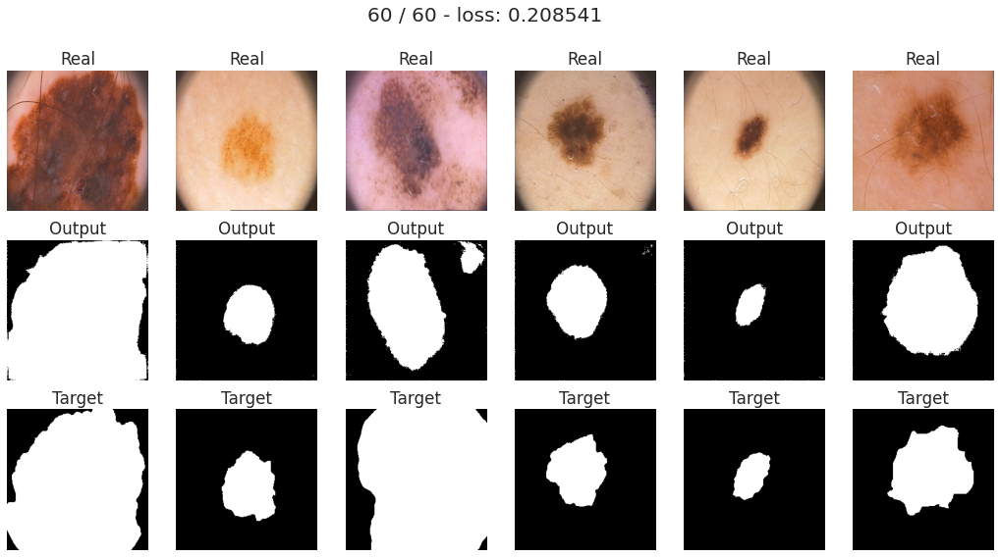

Epochs: 100%|██████████| 60/60 [29:50<00:00, 29.84s/it]


For SegNet with Weighted Cross Entropy Loss:
Val score: 0.50600
Train score: 0.61000


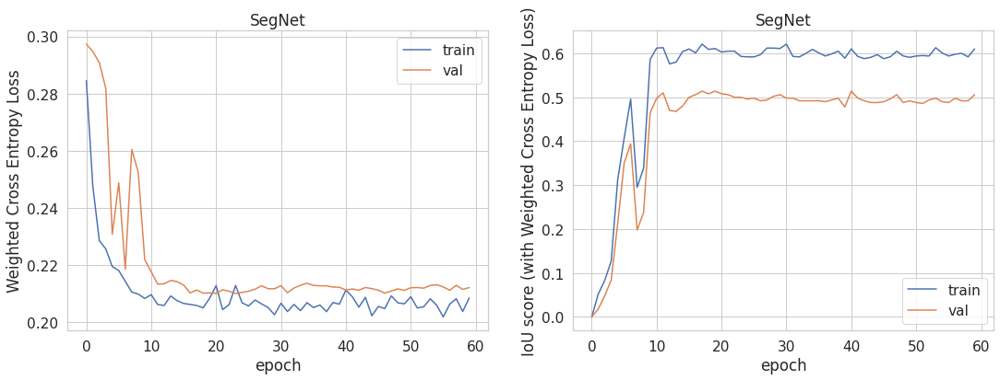

In [ ]:
loss_seg_wce = train_test_model(
    SegNet, wce_loss, n_model='SegNet', n_loss='Weighted Cross Entropy')



---


<a id='unet'></a>
# U-Net

[**U-Net**](https://arxiv.org/abs/1505.04597) — это архитектура нейронной сети, которая получает изображение и выводит его. Первоначально она была задумана для семантической сегментации (как мы ее будем использовать), но она настолько успешна, что с тех пор используется в других контекстах. Получая на вход медицинское изображение, она выведет изображение в оттенках серого, где интенсивность каждого пикселя зависит от вероятности того, что этот пиксель принадлежит интересующей нас области.

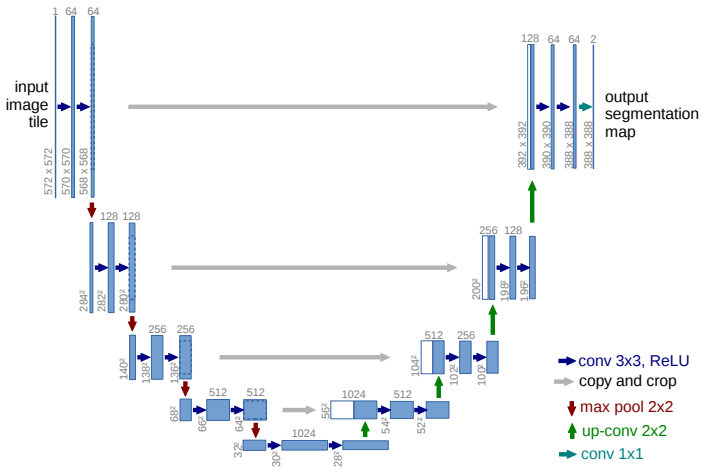

У нас в архитектуре все так же существует энкодер и декодер, как в **SegNet**, но отличительной особеностью данной модели являются *skip-conenctions*, соединяющие части декодера и энкодера. То есть для того, чтобы передать на вход декодера тензор, мы конкатенируем симметричный выход с энкодера и выход предыдущего слоя декодера.

* Ronneberger, Olaf, Philipp Fischer, and Thomas Brox. "[U-Net: Convolutional networks for biomedical image segmentation.](https://arxiv.org/pdf/1505.04597.pdf)" International Conference on Medical image computing and computer-assisted intervention. Springer, Cham, 2015.

In [ ]:
class UNet(nn.Module):
    def __init__(self):
        super().__init__()

        # encoder (downsampling)
        self.enc_conv0 = encod_conv(3, 64, deep=2)
        self.pool0 = nn.MaxPool2d(kernel_size=2)  # 256 -> 128
        self.enc_conv1 = encod_conv(64, 128, deep=2)
        self.pool1 = nn.MaxPool2d(kernel_size=2)  # 128 -> 64
        self.enc_conv2 = encod_conv(128, 256, deep=2)
        self.pool2 = nn.MaxPool2d(kernel_size=2)  # 64 -> 32
        self.enc_conv3 = encod_conv(256, 512, deep=2)
        self.pool3 = nn.MaxPool2d(kernel_size=2)  # 32 -> 16

        # bottleneck
        self.bottleneck_conv = encod_conv(512, 1024, deep=2)

        # decoder (upsampling)
        self.upsample0 = nn.Upsample(scale_factor=2)  # 16 -> 32
        self.dec_conv0 = encod_conv(1024 + 512, 512, deep=2)
        self.upsample1 = nn.Upsample(scale_factor=2)  # 32 -> 64
        self.dec_conv1 = encod_conv(512 + 256, 256, deep=2)
        self.upsample2 = nn.Upsample(scale_factor=2)  # 64 -> 128
        self.dec_conv2 = encod_conv(256 + 128, 128, deep=2)
        self.upsample3 = nn.Upsample(scale_factor=2)  # 128 -> 256
        self.dec_conv3 = encod_conv(128 + 64, 64, deep=2)

        # Выход нашей сети (бирюзовая стрелка на схеме)
        self.dec_conv_out = nn.Conv2d(64, 1, kernel_size=1, padding=0)

    def forward(self, x):
        # encoder
        e0 = self.enc_conv0(x)
        p0 = self.pool0(e0)
        e1 = self.enc_conv1(p0)
        p1 = self.pool1(e1)
        e2 = self.enc_conv2(p1)
        p2 = self.pool2(e2)
        e3 = self.enc_conv3(p2)
        p3 = self.pool3(e3)

        # bottleneck
        b = self.bottleneck_conv(p3)

        # decoder
        d0 = self.dec_conv0(torch.cat([self.upsample0(b), e3], dim=1))
        d1 = self.dec_conv1(torch.cat([self.upsample0(d0), e2], dim=1))
        d2 = self.dec_conv2(torch.cat([self.upsample0(d1), e1], dim=1))
        d3 = self.dec_conv3(torch.cat([self.upsample0(d2), e0], dim=1))

        d4 = self.dec_conv_out(d3)  # no activation

        return d4

In [ ]:
torch.cuda.empty_cache()
unet = UNet().to(device)

In [ ]:
# Архитектура получившейся сети
summary(unet, (3, 256, 256))

----------------------------------------------------------------
        Layer (type)               Output Shape         Param #
            Conv2d-1         [-1, 64, 256, 256]           1,792
       BatchNorm2d-2         [-1, 64, 256, 256]             128
              ReLU-3         [-1, 64, 256, 256]               0
            Conv2d-4         [-1, 64, 256, 256]          36,928
       BatchNorm2d-5         [-1, 64, 256, 256]             128
              ReLU-6         [-1, 64, 256, 256]               0
         MaxPool2d-7         [-1, 64, 128, 128]               0
            Conv2d-8        [-1, 128, 128, 128]          73,856
       BatchNorm2d-9        [-1, 128, 128, 128]             256
             ReLU-10        [-1, 128, 128, 128]               0
           Conv2d-11        [-1, 128, 128, 128]         147,584
      BatchNorm2d-12        [-1, 128, 128, 128]             256
             ReLU-13        [-1, 128, 128, 128]               0
        MaxPool2d-14          [-1, 128,

<a id='tt_unet'></a>
## Train & Test U-Net

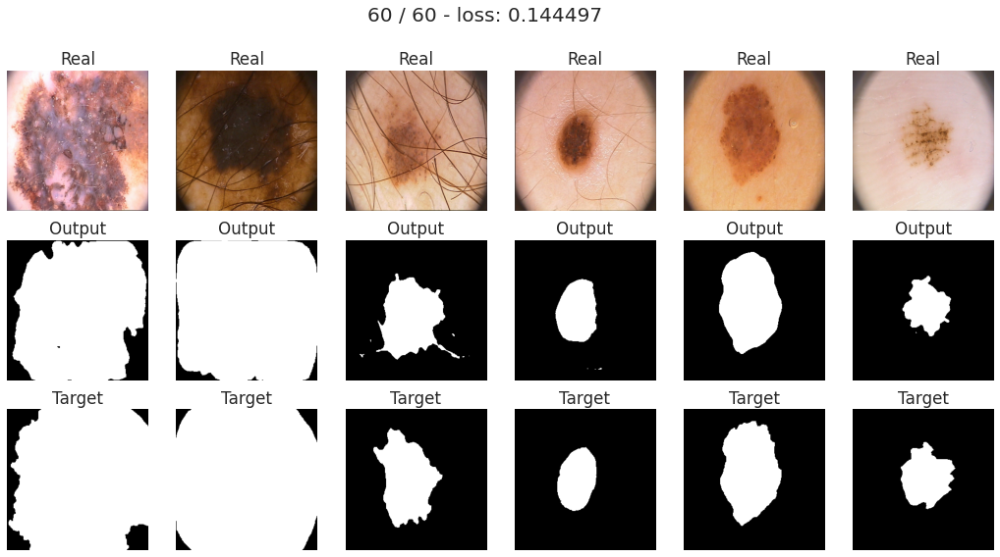

Epochs: 100%|██████████| 60/60 [55:35<00:00, 55.58s/it]


For U-Net with BCE Loss:
Val score: 0.68200
Train score: 0.76900


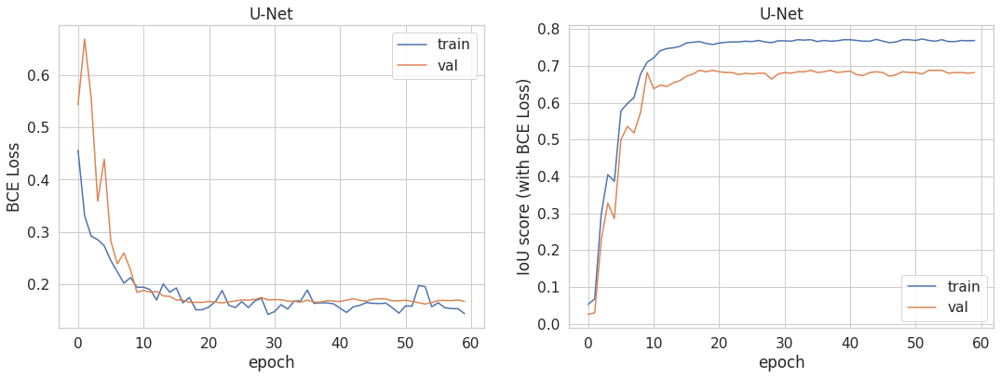

In [ ]:
loss_unet_bce = train_test_model(UNet, bce_loss, n_model='U-Net', n_loss='BCE')

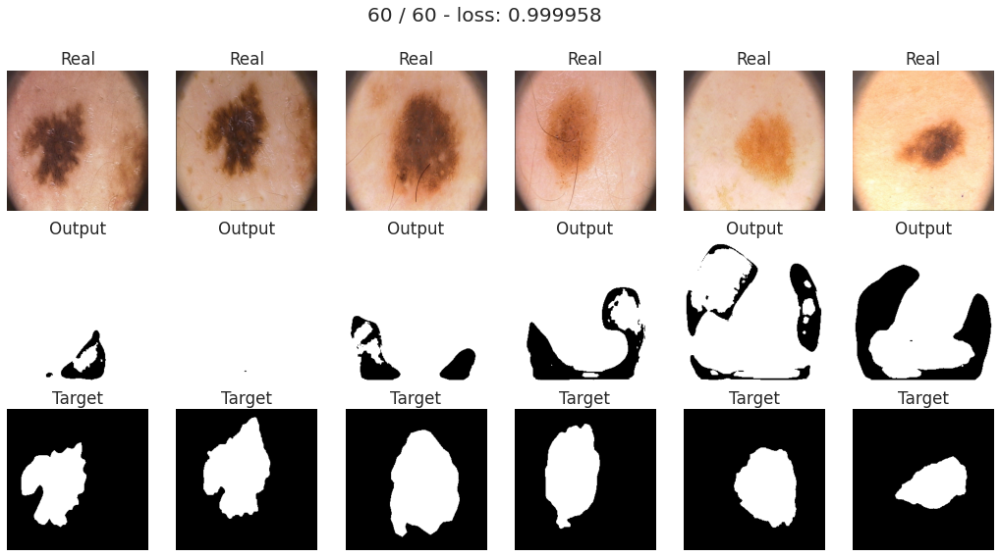

Epochs: 100%|██████████| 60/60 [51:11<00:00, 51.19s/it]


For U-Net with Dice Loss:
Val score: 0.06800
Train score: 0.10700


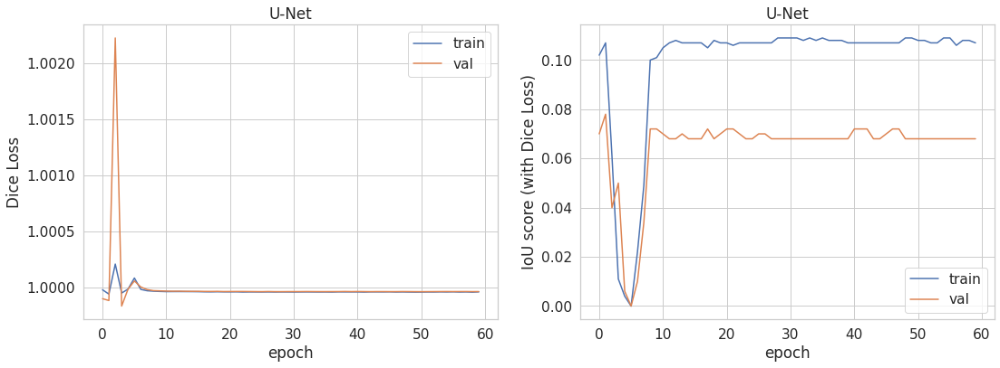

In [ ]:
loss_unet_dice = train_test_model(
    UNet, dice_loss, n_model='U-Net', n_loss='Dice')

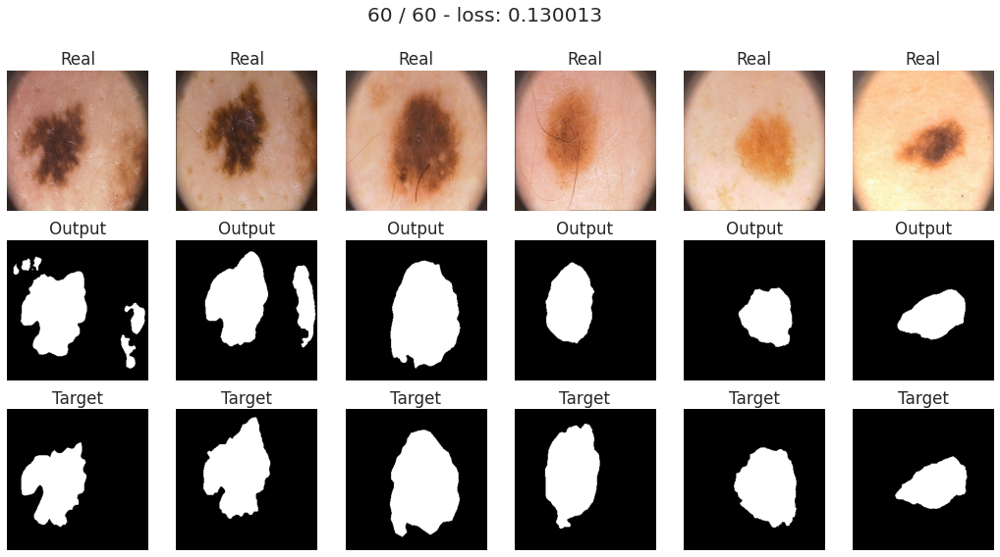

Epochs: 100%|██████████| 60/60 [55:19<00:00, 55.33s/it]


For U-Net with Focal Loss:
Val score: 0.65000
Train score: 0.63400


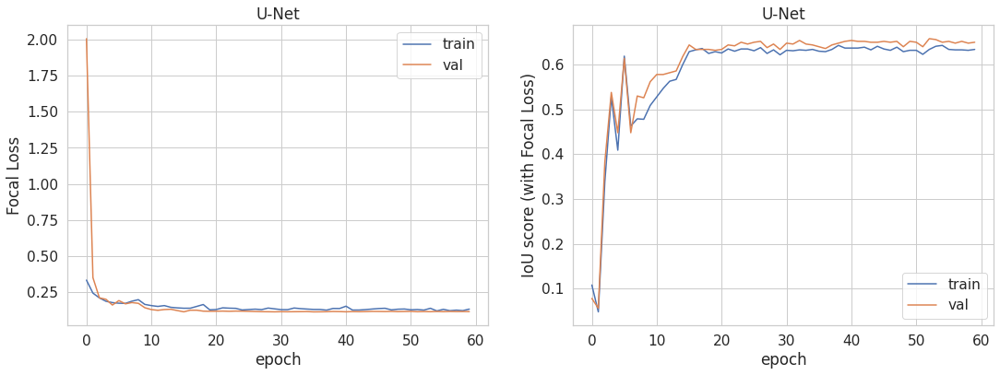

In [ ]:
loss_unet_focal = train_test_model(
    UNet, focal_loss, n_model='U-Net', n_loss='Focal')

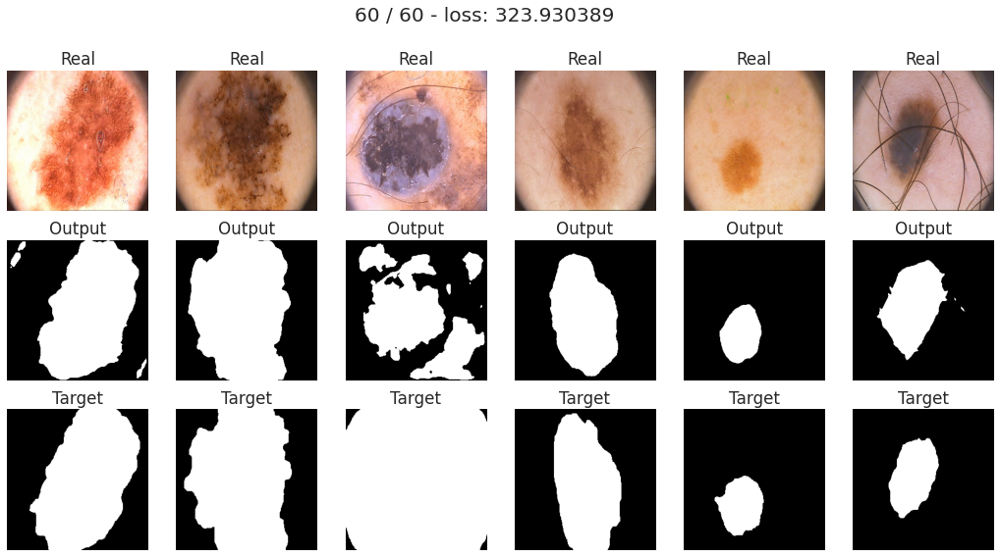

Epochs: 100%|██████████| 60/60 [55:21<00:00, 55.36s/it]


For U-Net with SupVis Loss:
Val score: 0.72000
Train score: 0.77500


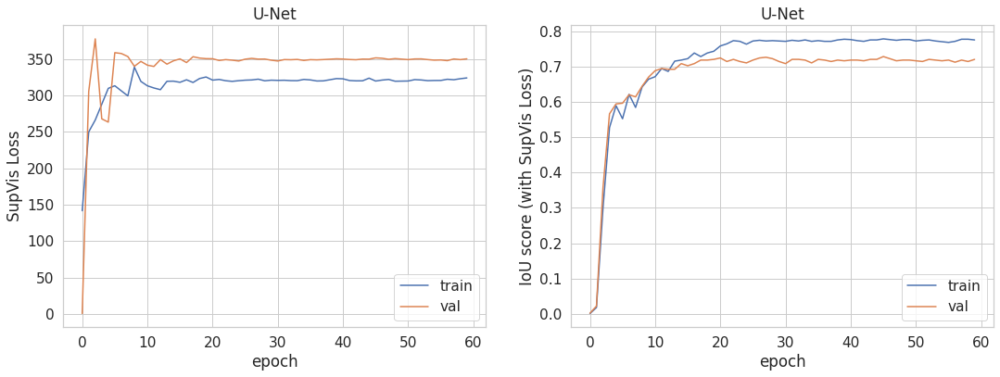

In [ ]:
loss_unet_supvis = train_test_model(
    UNet, supvis_loss, n_model='U-Net', n_loss='SupVis')

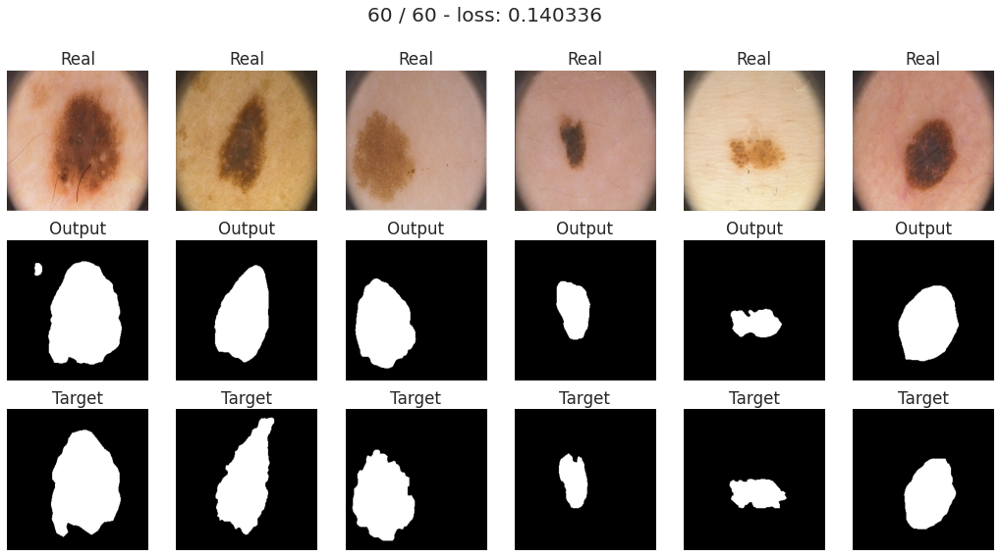

Epochs: 100%|██████████| 60/60 [55:15<00:00, 55.25s/it]


For U-Net with Structural Similarity Loss:
Val score: 0.69800
Train score: 0.72600


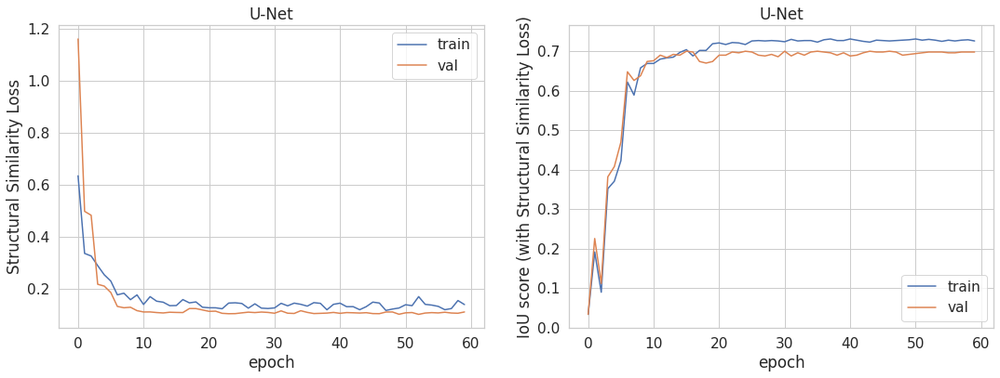

In [ ]:
loss_unet_strucsim = train_test_model(
    UNet, strucsim_loss, n_model='U-Net', n_loss='Structural Similarity')

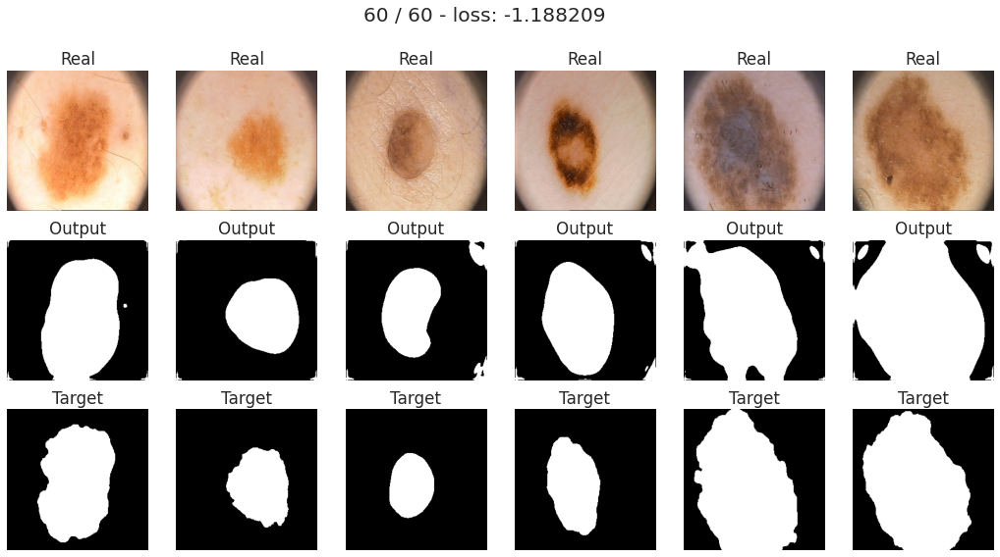

Epochs: 100%|██████████| 60/60 [54:26<00:00, 54.43s/it]


For U-Net with Tversky Loss:
Val score: 0.31600
Train score: 0.33800


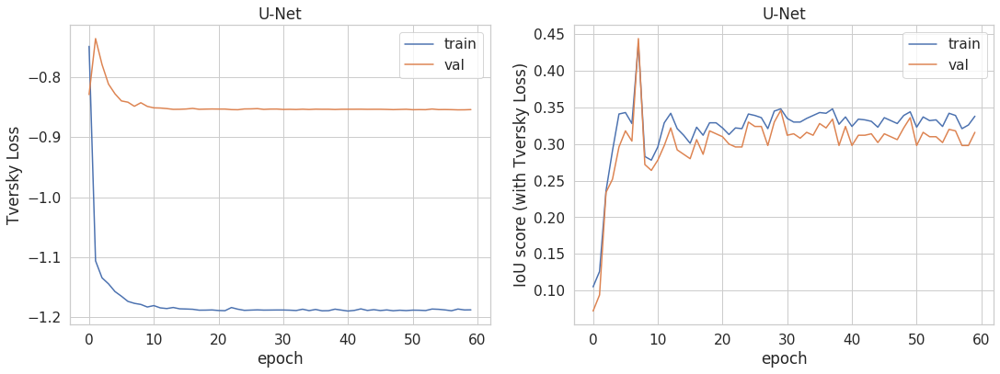

In [ ]:
loss_unet_tversky = train_test_model(
    UNet, tversky_loss, n_model='U-Net', n_loss='Tversky')

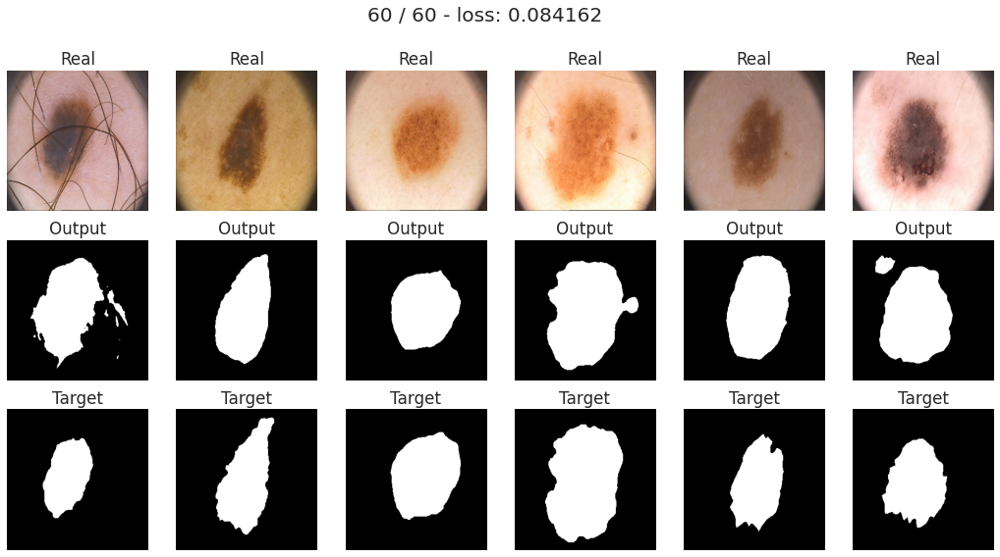

Epochs: 100%|██████████| 60/60 [54:16<00:00, 54.28s/it]


For U-Net with Weighted Cross Entropy Loss:
Val score: 0.67800
Train score: 0.67400


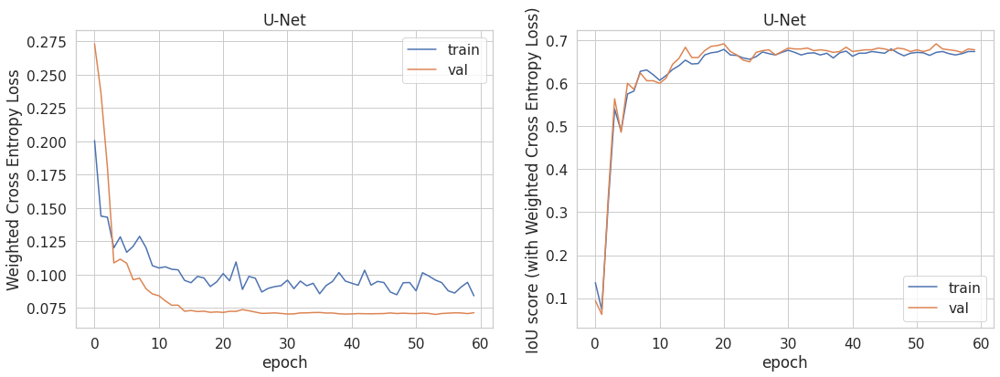

In [ ]:
loss_unet_wce = train_test_model(
    UNet, wce_loss, n_model='U-Net', n_loss='Weighted Cross Entropy')

<a id='unet2'></a>
# U-Net (2 версия)


Реализуем новую модель путем изменения типа пулинга:

 **Max-Pooling** for the downsampling and **nearest-neighbor Upsampling** for the upsampling.

Down-sampling:

        conv = nn.Conv2d(3, 64, 3, padding=1)
        pool = nn.MaxPool2d(3, 2, padding=1)

Up-Sampling

        upsample = nn.Upsample(32)
        conv = nn.Conv2d(64, 64, 3, padding=1)

Заменим max-pooling на convolutions с stride=2 и upsampling на transpose-convolutions с stride=2.


In [ ]:
class UNet2(nn.Module):
    def __init__(self):
        super().__init__()

        # encoder (downsampling)
        # bs = batch_size                                                       # -> (1, 3, 256, 256)
        # -> (1, 64, 256, 256)
        self.enc_conv0 = encod_conv(3, 64, deep=2)
        self.pool0 = nn.Conv2d(64, 64, kernel_size=(
            3, 3), stride=2, padding=1)  # -> (1, 64, 128, 128)

        # -> (1, 128, 128, 128)
        self.enc_conv1 = encod_conv(64, 128, deep=2)
        self.pool1 = nn.Conv2d(128, 128, kernel_size=(3, 3),
                               stride=2, padding=1)                             # -> (1, 128, 64, 64)

        # -> (1, 256, 64, 64)
        self.enc_conv2 = encod_conv(128, 256, deep=2)
        self.pool2 = nn.Conv2d(256, 256, kernel_size=(3, 3),
                               stride=2, padding=1)                             # -> (1, 256, 32, 32)

        # -> (1, 512, 32, 32)
        self.enc_conv3 = encod_conv(256, 512, deep=2)
        self.pool3 = nn.Conv2d(512, 512, kernel_size=(3, 3),
                               stride=2, padding=1)                             # -> (1, 512, 16, 16)

        # bottleneck
        # -> (1, 1024, 16, 16)
        self.bottleneck_conv = encod_conv(512, 1024, deep=2)

        # decoder (upsampling)
        #nn.ConvTranspose2d(1024, 512, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1))
        self.upsample0 = nn.ConvTranspose2d(1024, 1024, kernel_size=(3, 3),
                                            stride=2, padding=1, output_padding=1)  # -> (1, 1024, 32, 32) ????
        # -> (1, 512, 16, 16)
        self.dec_conv0 = encod_conv(1024 + 512, 512, deep=2)

        self.upsample1 = nn.ConvTranspose2d(512, 512, kernel_size=(3, 3),
                                            stride=2, padding=1, output_padding=1)  # -> (1, 512, 32, 32) ?32 -> 64
        # -> (1, 256, 16, 16)
        self.dec_conv1 = encod_conv(512 + 256, 256, deep=2)

        self.upsample2 = nn.ConvTranspose2d(256, 256, kernel_size=(3, 3),
                                            stride=2, padding=1, output_padding=1)  # -> (1, 256, 32, 32) ?64 -> 128
        # -> (1, 128, 16, 16)
        self.dec_conv2 = encod_conv(256 + 128, 128, deep=2)

        self.upsample3 = nn.ConvTranspose2d(128, 128, kernel_size=(3, 3),
                                            stride=2, padding=1, output_padding=1)  # 128 -> 256
        self.dec_conv3 = encod_conv(128 + 64, 64, deep=2)

        self.dec_conv_out = nn.Conv2d(64, 1, kernel_size=1, padding=0)

    def forward(self, x):
        # encoder
        e0 = self.enc_conv0(x)
        p0 = self.pool0(e0)
        e1 = self.enc_conv1(p0)
        p1 = self.pool1(e1)
        e2 = self.enc_conv2(p1)
        p2 = self.pool2(e2)
        e3 = self.enc_conv3(p2)
        p3 = self.pool3(e3)

        # bottleneck
        b = self.bottleneck_conv(p3)

        # decoder
        d0 = self.dec_conv0(torch.cat([self.upsample0(b), e3], dim=1))
        d1 = self.dec_conv1(torch.cat([self.upsample1(d0), e2], dim=1))
        d2 = self.dec_conv2(torch.cat([self.upsample2(d1), e1], dim=1))
        d3 = self.dec_conv3(torch.cat([self.upsample3(d2), e0], dim=1))

        d4 = self.dec_conv_out(d3)  # no activation

        return d4

In [ ]:
torch.cuda.empty_cache()
unet2_model = UNet2().to(device)

# Архитектура получившейся сети
summary(unet2_model, (3, 256, 256))

----------------------------------------------------------------
        Layer (type)               Output Shape         Param #
            Conv2d-1         [-1, 64, 256, 256]           1,792
       BatchNorm2d-2         [-1, 64, 256, 256]             128
              ReLU-3         [-1, 64, 256, 256]               0
            Conv2d-4         [-1, 64, 256, 256]          36,928
       BatchNorm2d-5         [-1, 64, 256, 256]             128
              ReLU-6         [-1, 64, 256, 256]               0
            Conv2d-7         [-1, 64, 128, 128]          36,928
            Conv2d-8        [-1, 128, 128, 128]          73,856
       BatchNorm2d-9        [-1, 128, 128, 128]             256
             ReLU-10        [-1, 128, 128, 128]               0
           Conv2d-11        [-1, 128, 128, 128]         147,584
      BatchNorm2d-12        [-1, 128, 128, 128]             256
             ReLU-13        [-1, 128, 128, 128]               0
           Conv2d-14          [-1, 128,

<a id='tt_unet2'></a>
## Train & Test U-Net2

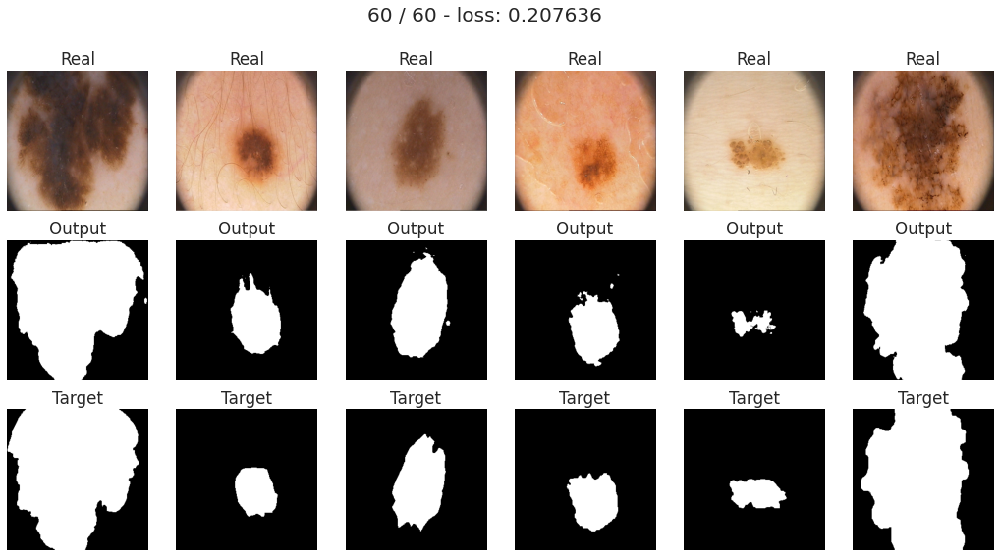

Epochs: 100%|██████████| 60/60 [1:10:42<00:00, 70.71s/it]


For U-Net2 with BCE Loss:
Val score: 0.66000
Train score: 0.64800


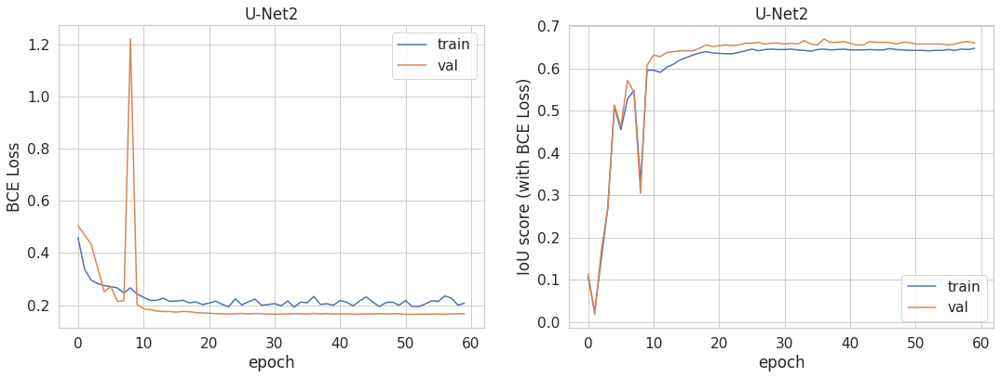

In [ ]:
loss_unet2_bce = train_test_model(
    UNet2, bce_loss, n_model='U-Net2', n_loss='BCE')

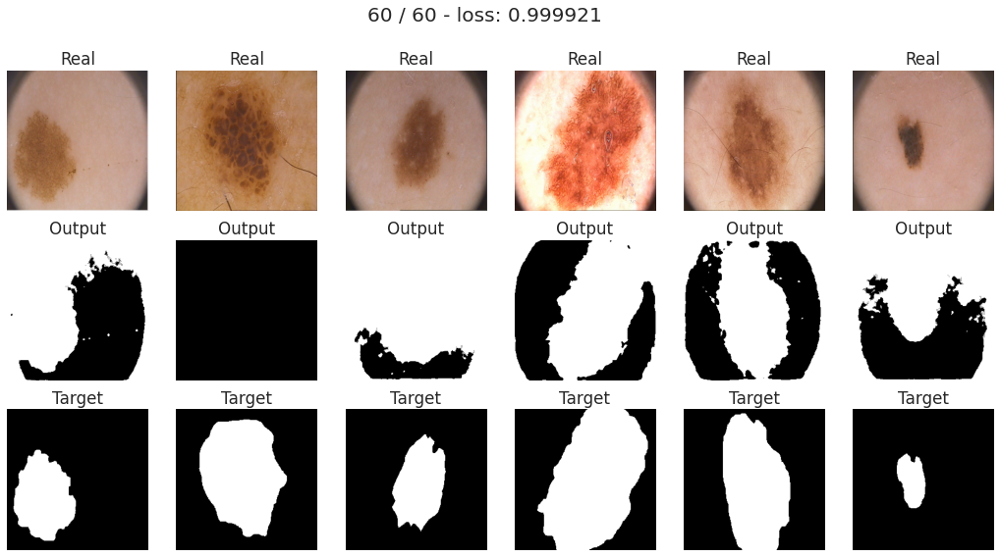

Epochs: 100%|██████████| 60/60 [1:06:54<00:00, 66.92s/it]


For U-Net2 with Dice Loss:
Val score: 0.20000
Train score: 0.20700


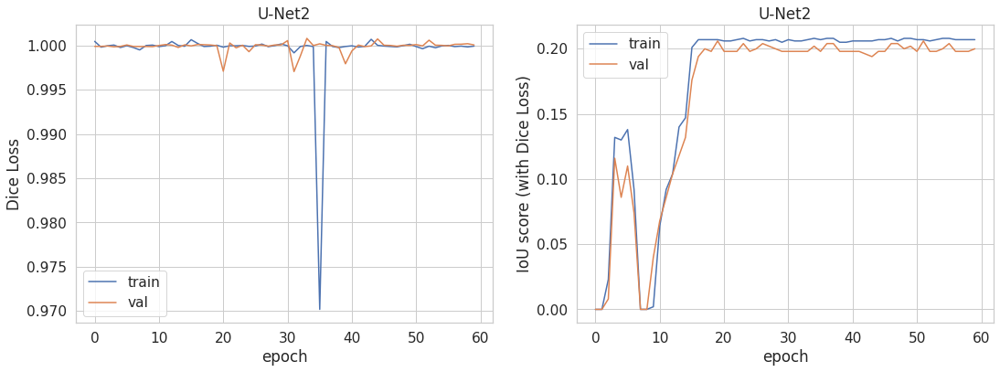

In [ ]:
loss_unet2_dice = train_test_model(
    UNet2, dice_loss, n_model='U-Net2', n_loss='Dice')

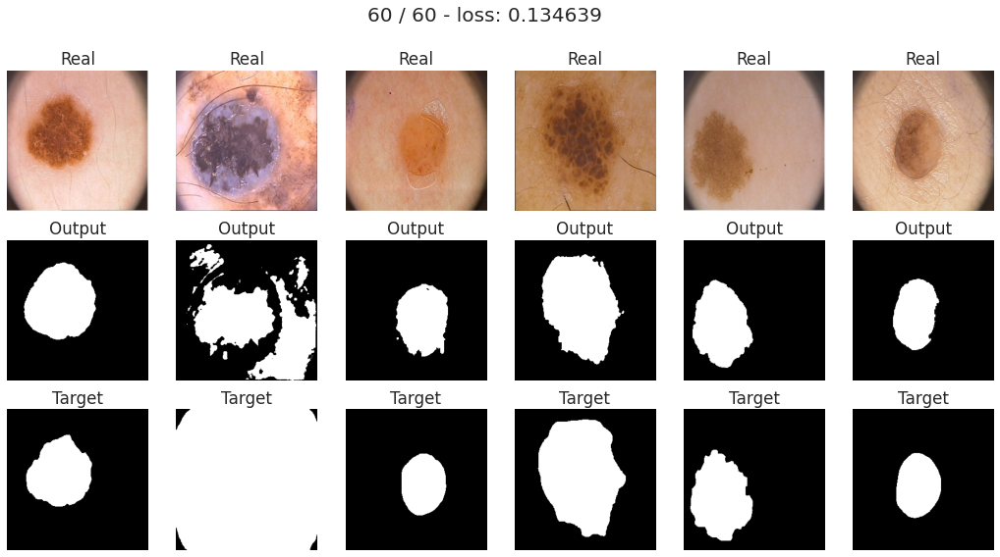

Epochs: 100%|██████████| 60/60 [1:06:42<00:00, 66.71s/it]


For U-Net2 with Focal Loss:
Val score: 0.67800
Train score: 0.71800


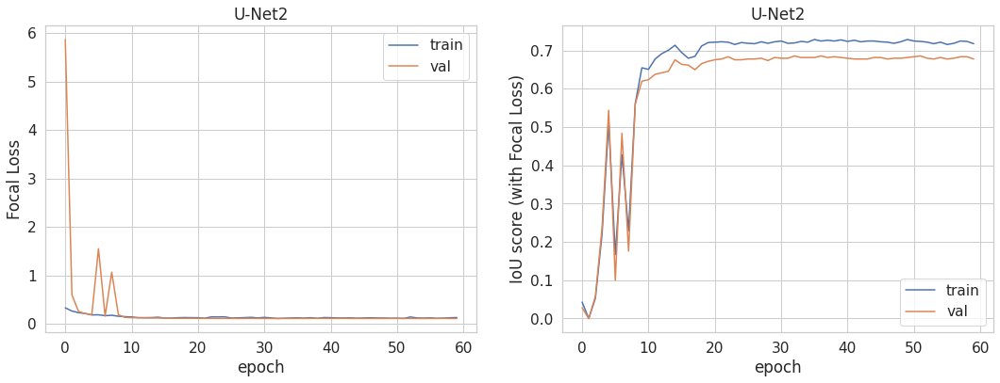

In [ ]:
loss_unet2_focal = train_test_model(
    UNet2, focal_loss, n_model='U-Net2', n_loss='Focal')

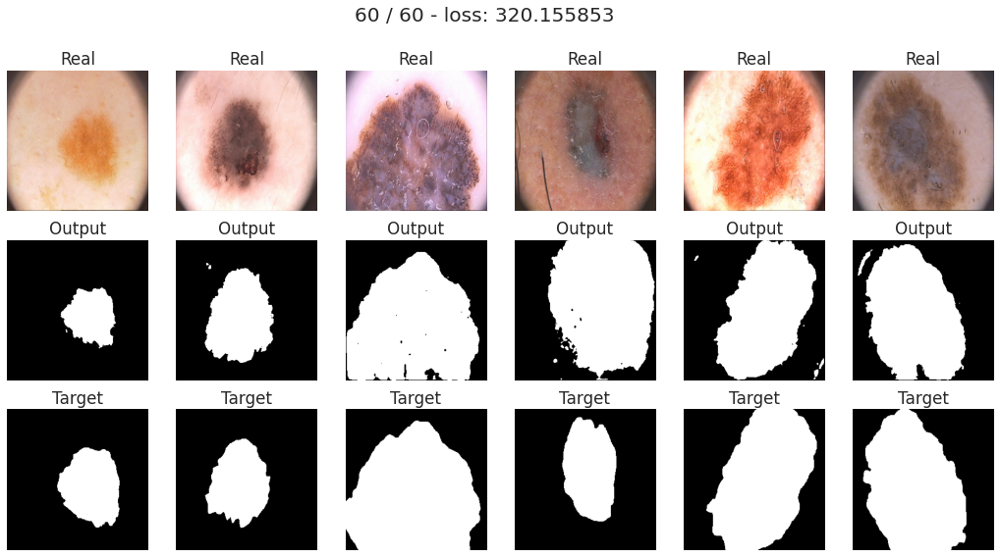

Epochs: 100%|██████████| 60/60 [1:06:21<00:00, 66.35s/it]


For U-Net2 with SupVis Loss:
Val score: 0.67000
Train score: 0.63700


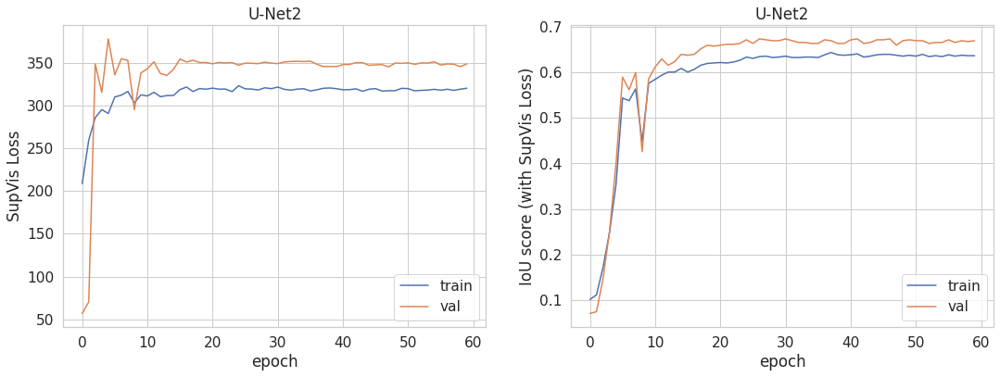

In [ ]:
loss_unet2_supvis = train_test_model(
    UNet2, supvis_loss, n_model='U-Net2', n_loss='SupVis')

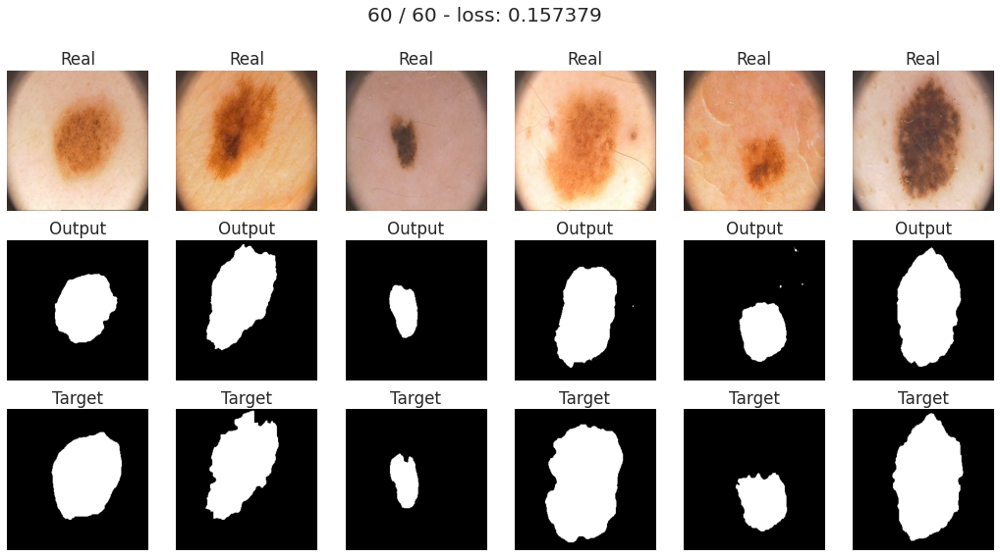

Epochs: 100%|██████████| 60/60 [1:06:22<00:00, 66.37s/it]


For U-Net2 with Structural Similarity Loss:
Val score: 0.64800
Train score: 0.61200


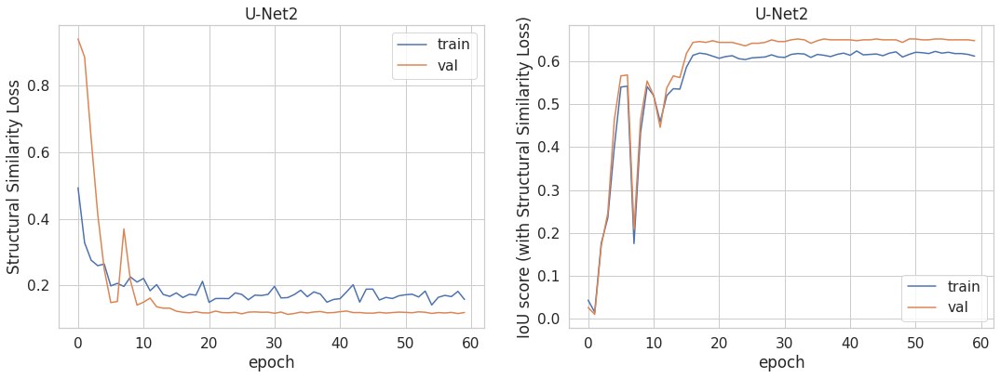

In [ ]:
loss_unet2_strucsim = train_test_model(
    UNet2, strucsim_loss, n_model='U-Net2', n_loss='Structural Similarity')

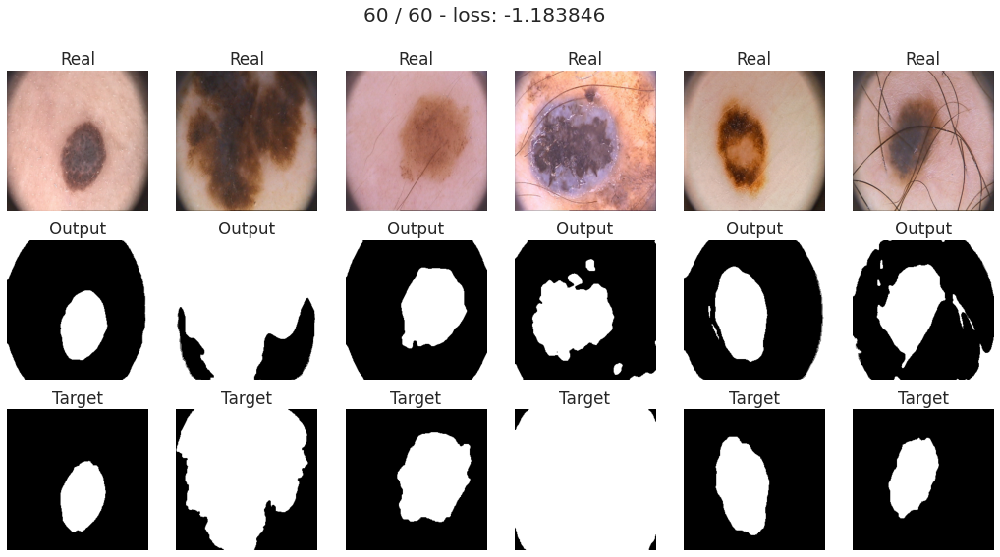

Epochs: 100%|██████████| 60/60 [1:06:28<00:00, 66.48s/it]


For U-Net2 with Tversky Loss:
Val score: 0.18400
Train score: 0.20700


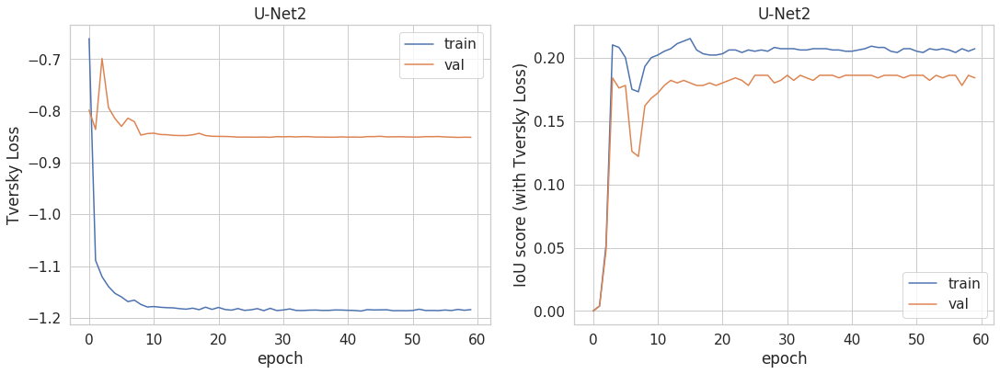

In [ ]:
loss_unet2_tversky = train_test_model(
    UNet2, tversky_loss, n_model='U-Net2', n_loss='Tversky')

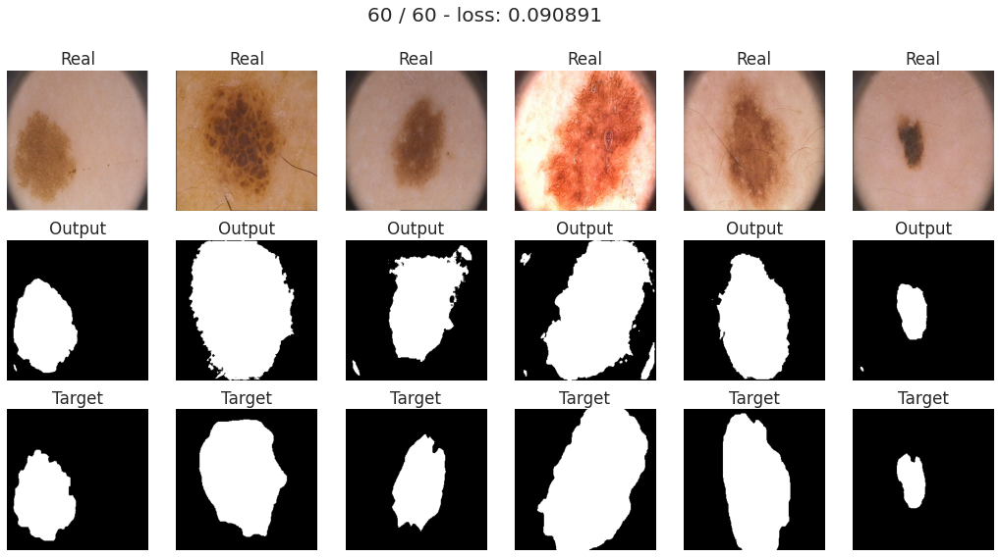

Epochs: 100%|██████████| 60/60 [1:07:04<00:00, 67.07s/it]


For U-Net2 with Weighted Cross Entropy Loss:
Val score: 0.64800
Train score: 0.62800


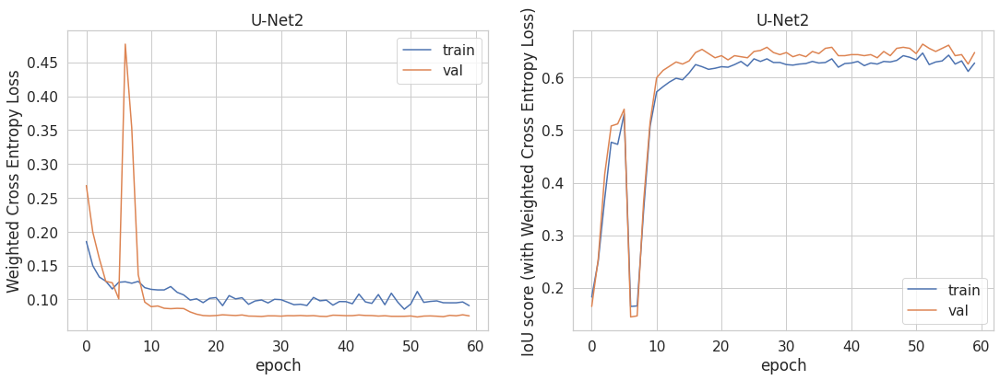

In [ ]:
loss_unet2_wce = train_test_model(
    UNet2, wce_loss, n_model='U-Net2', n_loss='Weighted Cross Entropy')

<a id='report'></a>
# Результаты

In [ ]:
import pandas as pd
import numpy as np
from torch import tensor
import matplotlib.pyplot as plt

Для удобства дальнейшего анализа создадим датафрейм со следующими полями:

*   `model` - архитектура нейронной сети
*   `loss_function` - функция потерь
*   `val_score` - значение метрики IoU на валидационной выборке
*   `train_score` - значение метрики IoU на обучающих данных
*   `train_time` - время обучения в секундах
*   `params` - количество обучаемых параметров сети 





In [ ]:
df = pd.DataFrame(columns=['model', 'loss_function', 'val_score', 'train_score',
                           'train_time', 'params'])


df.loc[0] = ['SegNet', 'BCE', 0.37800, 0.43600, 1770, 24869775]
df.loc[1] = ['SegNet', 'Dice', 0.56000, 0.63800, 1778, 24869775]
df.loc[2] = ['SegNet', 'Focal', 0.42600, 0.50000, 1778, 24869775]
df.loc[3] = ['SegNet', 'SupVis', 0.41400, 0.48900, 1794, 24869775]
df.loc[4] = ['SegNet', 'StrucSim', 0.51000, 0.61600, 1780, 24869775]
df.loc[5] = ['SegNet', 'Tversky', 0.50600, 0.61500, 1778, 24869775]
df.loc[6] = ['SegNet', 'WCE', 0.50600, 0.61000, 1790, 24869775]

df.loc[7] = ['UNet', 'BCE', 0.68200, 0.76900, 3335, 31390721]
df.loc[8] = ['UNet', 'Dice', 0.06800, 0.10700, 3071, 31390721]
df.loc[9] = ['UNet', 'Focal', 0.65000, 0.63400, 3319, 31390721]
df.loc[10] = ['UNet', 'SupVis', 0.72000, 0.77500, 3321, 31390721]
df.loc[11] = ['UNet', 'StrucSim', 0.69800, 0.72600, 3315, 31390721]
df.loc[12] = ['UNet', 'Tversky', 0.31600, 0.33800, 3266, 31390721]
df.loc[13] = ['UNet', 'WCE', 0.67800, 0.67400, 3256, 31390721]

df.loc[14] = ['UNet2', 'BCE', 0.66000, 0.64800, 4242, 47060801]
df.loc[15] = ['UNet2', 'Dice', 0.20000, 0.20700, 4014, 47060801]
df.loc[16] = ['UNet2', 'Focal', 0.67800, 0.71800, 4002, 47060801]
df.loc[17] = ['UNet2', 'SupVis', 0.67000, 0.63700, 3981, 47060801]
df.loc[18] = ['UNet2', 'StrucSim', 0.64800, 0.61200, 3982, 47060801]
df.loc[19] = ['UNet2', 'Tversky', 0.18400, 0.20700, 3988, 47060801]
df.loc[20] = ['UNet2', 'WCE', 0.64800, 0.62800, 4024, 47060801]

df

,model,loss_function,val_score,train_score,train_time,params
0,SegNet,BCE,0.378,0.436,1770,24869775
1,SegNet,Dice,0.560,0.638,1778,24869775
2,SegNet,Focal,0.426,0.500,1778,24869775
3,SegNet,SupVis,0.414,0.489,1794,24869775
4,SegNet,StrucSim,0.510,0.616,1780,24869775
5,SegNet,Tversky,0.506,0.615,1778,24869775
6,SegNet,WCE,0.506,0.610,1790,24869775
7,UNet,BCE,0.682,0.769,3335,31390721
8,UNet,Dice,0.068,0.107,3071,31390721
9,UNet,Focal,0.650,0.634,3319,31390721


<a id='bob'></a>
## Best of the best 🥇

Посмотрим, при какой архитектуре нейронной сети и какой функции потерь нам удалось добиться наилучшего результата в задаче сегментации пораженных участков кожи. Для этого отсортируем наш датафрейм по уменьшению значения IoU метрики

In [ ]:
df.sort_values('val_score', ascending=False)[
    ['val_score', 'model', 'loss_function']].head()

,val_score,model,loss_function
10,0.720,UNet,SupVis
11,0.698,UNet,StrucSim
7,0.682,UNet,BCE
16,0.678,UNet2,Focal
13,0.678,UNet,WCE


Видим, что в нашем топ-5 сеть `U-Net` в "первой конфигурации" заняла целых 4 места. На основе этого можем предположить, что с данной задачей она справилась лучше других сетей: `UNet2` и `SegNet`. Кроме `U-Net2` в топе третье место занимает `U-Net`.
Что касается функций потерь, то тут единогласного лидера нет, поскольку в нашем топе все 5 мест заняли разные лоссы.

На основе этого можно сделать вывод, что при решении задачи в первую очередь стоит подобрать удачную архитектуру сети, а уже потом подбирать функцию потерь.

**Лучший результат показала комбинацией `U-Net` с `SupVis` лоссом** 👍. Кроме этого, в топе есть функции потерь `StrucSim`, `BCE`, `Focal` и `WCE`.

Посмотрим, будут ли значительные изменения в наших выводах, если посмотреть на топ-5 по значению метрики на обучающей выборке

In [ ]:
df.sort_values('train_score', ascending=False)[
    ['train_score', 'model', 'loss_function']].head()

,val_score,train_score,model,loss_function
10,0.720,0.775,UNet,SupVis
7,0.682,0.769,UNet,BCE
11,0.698,0.726,UNet,StrucSim
16,0.678,0.718,UNet2,Focal
13,0.678,0.674,UNet,WCE


Ожидаемо, что сами значения `train_score` выше значений `val_score`. Однако наши выводы скорее подтвердились: в топ-5 по-прежнему четыре позиции занимает `U-Net`, лучший результат у `U-Net` + `SupVis`, сеть `SegNet` в топ не попала, лучшие лоссы всё те же.

Со всеми ли функциями потерь `U-Net` будет лучше других сетей? Всегда ли по убыванию точности архитектуры будут располагаться в порядке: `U-Net`, `U-Net2`, `SegNet`? И всё таки, какой лосс лучше?
Чтобы ответить на эти вопросы, давайте построим следующий график

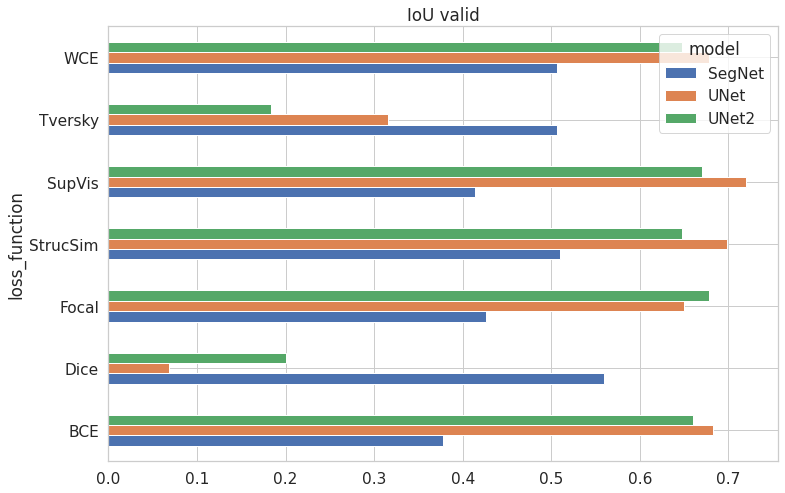

In [ ]:
pl1 = pd.pivot_table(
    df,
    values=['val_score'],
    index=['model', 'loss_function']
).unstack(level=0)

pl1.columns = pl1.columns.droplevel(0)

pl1.plot(kind="barh", title="IoU valid", figsize=(12, 8))

Что мы видим?

*   В среднем значения метрик при одинаковых лоссах для `U-Net` и `U-Net2` очень схожи. Это и очевидно, поскольку сети имеют очень похожую архитектуру.
*   Почти всегда (кроме `Dice` и `Tversky` лоссов) качество `SegNet`'а хуже, чем у `U-Net` и `U-Net2`. Кроме того, качество `U-Net` и `U-Net2` не так сильно изменяется при изменении функции потерь. Это в очередной раз говорит, что сначала выбираем архитектуру, а потом лосс.
*   При обучении с функциями потерь `Dice` и `Tversky` сеть `SegNet` − лидер. Совпадение ли это? Не думаю. На самом деле, `Dice` лосс - это частный случай `Tversky` лосс (при α = β = 1/2). Можно сказать, что в нашем исследовании эта связь дала о себе знать таким вот косвенным способом.

<a id='spinit'></a>
## Как ты не крути, но мы не пара 🙅
Последний полученный вывод наталкивает на мысль о том, что возможно для каждой архитектуры нейронной сети будут свои лидеры среди функций потерь. Проверим это

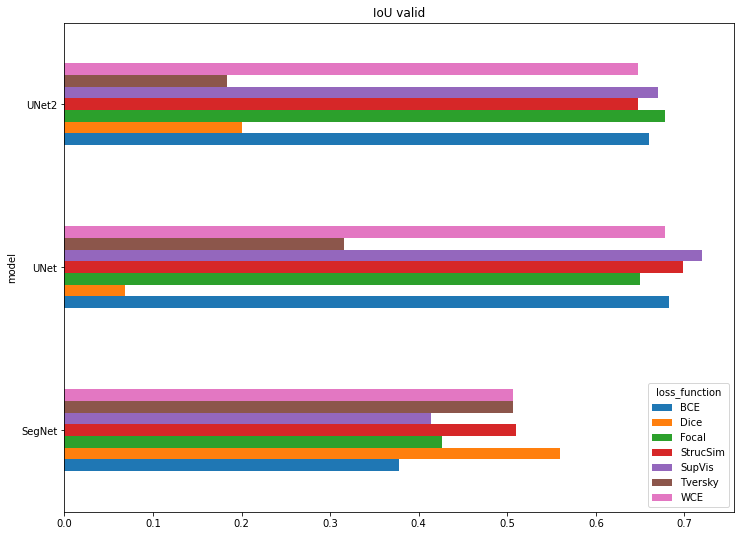

In [ ]:
pl2 = pd.pivot_table(
    df,
    values=['val_score'],
    index=['model', 'loss_function']
).unstack(level=1)  # 0 -> 1

pl2.columns = pl2.columns.droplevel(0)

pl2.plot(kind="barh", title="IoU valid", figsize=(12, 9))

Что можно сказать на основе данного графика?

*   Действительно, для различных нейронных сетей есть как более, так и менее подходящие функции потерь. На самом деле понятно, что выбор функции потерь должен зависеть не только от архитектуры сети, но и от других факторов, в том числе и от самих данных. Если посмотреть на предсказания моделей, которые были получены выше, то можно заметить, что некоторые лоссы не очень хорошо справлялись с темными углами изображений (виньеткой) и распознавали их как пораженные участки кожи.
*   Распределения лоссов по качеству для `U-Net` и `U-Net2` очень похожи, что ожидаемо в силу схожести данных сетей.
*   `Tversky` лосс (в том числе и `Dice`) лучше выбирать для `SegNet`, но не для `U-Net`'ов.
*   `StrucSim` и `WCE` неплохой вариант как для `SegNet`'a, так и для `U-Net`'ов.
*   К выбору функции потерь нужно подходить внимательно, поскольку от этого может очень сильно зависеть качество работы модели.



<a id='more_is_better'></a>
## Больше значит лучше? 🐘
Теперь давайте посмотрим, влияет ли количество обучаемых параметров в сети на качество работы. 

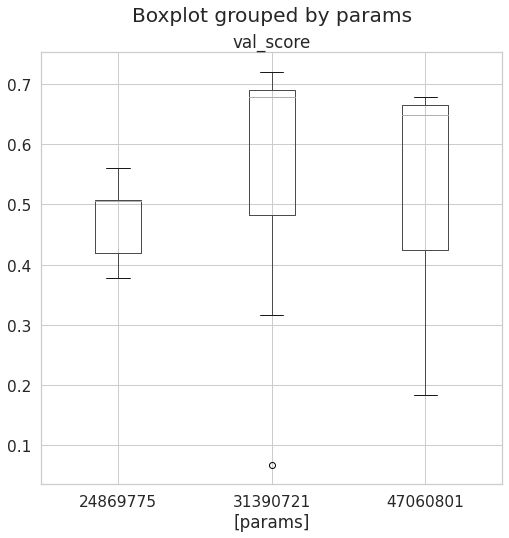

In [ ]:
df[['params', 'val_score']].boxplot(by='params', figsize=(8, 8))

Из боксплотов выше видим, что 

*   С ростом количества обучаемых параметров в сети качество предсказаний не обязательно должно расти.
*   Куда важнее то, какие слои мы используем, в каком порядке они идут и т.д.

Влияет ли количество параметров на время обучения?

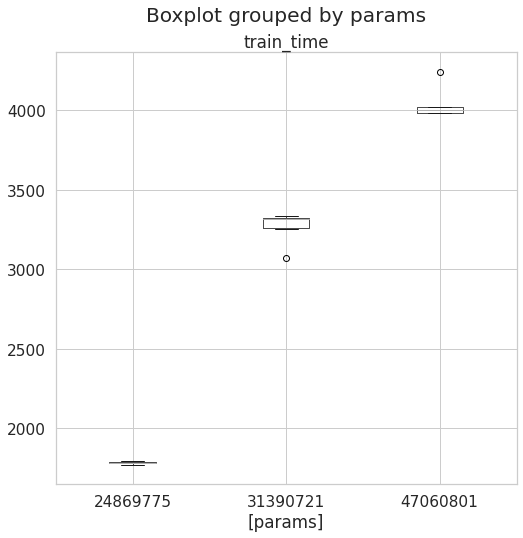

In [ ]:
df['train_time'] = df['train_time'].astype(int)

df[['train_time', 'params']].boxplot(by='params', figsize=(8, 8))

Конечно! Больше - значит дольше.

Посмотрим сколько времени было потрачено на обучение всех моделей

In [ ]:
print('На обучение {} модели было потрачено {:.0f}ч {:.0f}мин!'.format(
    df.shape[0],
    df['train_time'].sum()/60//60,
    df['train_time'].sum()/60 % 60))

На обучение 21 модели было потрачено 17ч 40мин!


<img src="https://vsuete.com/wp-content/uploads/2017/02/Incredibly-popular-in-Russia-Zhdun.jpg"  width="300" height="400">

<a id='dynamics'></a>
## Динамика обучения 🏃

В этом пункте посмотрим на то, как разные модели обучались с течением времени.

Результаты, которые были получены при обучении нейронных сетей:

In [ ]:
# SegNet
loss_seg_bce = {
    'train_loss': [tensor(0.7215),  tensor(0.6974),  tensor(0.6898),  tensor(0.6575),  tensor(0.6278),  tensor(0.6237),  tensor(0.6183),  tensor(0.6108),  tensor(0.6071),  tensor(0.5936),  tensor(0.5909),  tensor(0.5883),  tensor(0.5971),  tensor(0.5915),  tensor(0.5911),  tensor(0.5881),  tensor(0.5919),  tensor(0.5834),  tensor(0.5919),  tensor(0.5835),  tensor(0.5892),  tensor(0.5826),  tensor(0.5831),  tensor(0.5830),  tensor(0.5843),  tensor(0.5831),  tensor(0.5834),  tensor(0.5826),  tensor(0.5870),  tensor(0.5845),  tensor(0.5870),  tensor(0.5878),  tensor(0.5874),  tensor(0.5803),  tensor(0.5882),  tensor(0.5870),  tensor(0.5797),  tensor(0.5788),  tensor(0.5853),  tensor(0.5842),  tensor(0.5869),  tensor(0.5874),  tensor(0.5868),  tensor(0.5808),  tensor(0.5835),  tensor(0.5832),  tensor(0.5846),  tensor(0.5812),  tensor(0.5871),  tensor(0.5790),  tensor(0.5843),  tensor(0.5830),  tensor(0.5794),  tensor(0.5790),  tensor(0.5829),  tensor(0.5860),  tensor(0.5831),  tensor(0.5819),  tensor(0.5810),  tensor(0.5850)],
    'train_score': [0.08100000591948628,  0.08600000496953726,  0.09000000189989805,  0.089000004529953,  0.19100000709295273,  0.12500000074505807,  0.0990000020712614,  0.1520000074058771,  0.21900000125169755,  0.3350000038743019,  0.3470000043511391,  0.39300001263618467,  0.39100001454353334,  0.4200000137090683,  0.4110000103712082,  0.43500002324581144,  0.4110000103712082,  0.3900000020861626,  0.40100000947713854,  0.4030000060796738,  0.3940000176429749,  0.3950000137090683,  0.4170000165700912,  0.41100001335144043,  0.43699999898672104,  0.4220000058412552,  0.4260000139474869,  0.4160000324249268,  0.4290000081062317,  0.42300001680850985,  0.4160000175237656,  0.42200001180171964,  0.41600002646446227,  0.43500000834465025,  0.40900000631809236,  0.41700001060962677,  0.41700001060962677,  0.4250000208616257,  0.4310000091791153,  0.428000009059906,  0.4140000194311142,  0.4260000079870224,  0.4110000193119049,  0.4320000261068344,  0.4290000289678574,  0.4230000078678131,  0.41800000369548795,  0.435000005364418,  0.41100000590085983,  0.4150000140070915,  0.417000013589859,  0.4189999997615814,  0.4230000197887421,  0.411000007390976,  0.42000000476837157,  0.4110000193119049,  0.42000001966953276,  0.427000018954277,  0.4170000165700912,  0.43600001037120817],
    'val_loss': [tensor(0.6943),  tensor(0.6986),  tensor(0.6942),  tensor(0.7135),  tensor(0.6656),  tensor(0.6766),  tensor(0.8634),  tensor(0.6596),  tensor(0.6526),  tensor(0.6131),  tensor(0.6100),  tensor(0.6089),  tensor(0.6059),  tensor(0.6050),  tensor(0.6033),  tensor(0.6051),  tensor(0.6036),  tensor(0.6046),  tensor(0.6047),  tensor(0.6049),  tensor(0.6045),  tensor(0.6037),  tensor(0.6055),  tensor(0.6037),  tensor(0.6035),  tensor(0.6029),  tensor(0.6041),  tensor(0.6039),  tensor(0.6041),  tensor(0.6033),  tensor(0.6021),  tensor(0.6040),  tensor(0.6018),  tensor(0.6044),  tensor(0.6016),  tensor(0.6024),  tensor(0.6018),  tensor(0.6022),  tensor(0.6010),  tensor(0.6033),  tensor(0.6022),  tensor(0.6026),  tensor(0.6025),  tensor(0.6022),  tensor(0.6008),  tensor(0.6025),  tensor(0.6018),  tensor(0.6030),  tensor(0.6029),  tensor(0.6046),  tensor(0.6043),  tensor(0.6034),  tensor(0.6032),  tensor(0.6048),  tensor(0.6050),  tensor(0.6027),  tensor(0.6027),  tensor(0.6047),  tensor(0.6033),  tensor(0.6043)],
    'val_score': [0.11200000308454036, 0.11600000225007534,  0.10800000578165055,  0.12000000476837158,  0.1460000067949295,  0.10400000140070915,  0.12200000789016485,  0.13000000193715094,  0.14600000530481339,  0.2640000134706497,  0.26800000965595244,  0.31600000858306887,  0.3140000134706497,  0.35400001108646395,  0.33800001740455626,  0.37000001072883604,  0.34000001549720765,  0.32200001180171967,  0.33000001311302185,  0.3360000103712082,  0.3260000109672546,  0.32400000393390654,  0.3600000083446503,  0.3380000084638596,  0.3780000150203705,  0.35000001192092894,  0.3560000091791153,  0.3420000195503235,  0.3600000202655792,  0.346000012755394,  0.33600001633167265,  0.3480000108480453,  0.3440000116825104,  0.3740000069141388,  0.3340000122785568,  0.342000013589859,  0.34600000977516177,  0.35000001192092894,  0.3560000240802765,  0.3540000021457672,  0.34200000762939453,  0.35400002300739286,  0.33600000739097596,  0.364000004529953,  0.3560000121593475,  0.3480000108480453,  0.3460000067949295,  0.3720000207424164,  0.3359999984502792,  0.34200000762939453,  0.3420000016689301,  0.34200001657009127,  0.35000001192092894,  0.33600000739097596,  0.35200001001358033,  0.3260000139474869,  0.3480000138282776,  0.3540000140666962,  0.34600000977516177,  0.378000009059906]
}

loss_seg_dice = {
    'train_loss': [tensor(0.9999),  tensor(0.9999),  tensor(0.9999),  tensor(0.9999),  tensor(0.9998),  tensor(0.9998),  tensor(0.9998),  tensor(0.9998),  tensor(0.9998),  tensor(0.9998),  tensor(0.9998),  tensor(0.9998),  tensor(0.9998),  tensor(0.9998),  tensor(0.9998),  tensor(0.9998),  tensor(0.9998),  tensor(0.9998),  tensor(0.9998),  tensor(0.9998),  tensor(0.9998),  tensor(0.9998),  tensor(0.9998),  tensor(0.9998),  tensor(0.9998),  tensor(0.9998),  tensor(0.9998),  tensor(0.9998),  tensor(0.9998),  tensor(0.9998),  tensor(0.9998),  tensor(0.9998),  tensor(0.9998),  tensor(0.9998),  tensor(0.9998),  tensor(0.9998),  tensor(0.9998),  tensor(0.9998),  tensor(0.9998),  tensor(0.9998),  tensor(0.9998),  tensor(0.9998),  tensor(0.9998),  tensor(0.9998),  tensor(0.9998),  tensor(0.9998),  tensor(0.9998),  tensor(0.9998),  tensor(0.9998),  tensor(0.9998),  tensor(0.9998),  tensor(0.9998),  tensor(0.9998),  tensor(0.9998),  tensor(0.9998),  tensor(0.9998),  tensor(0.9998),  tensor(0.9998),  tensor(0.9998),  tensor(0.9998)],
    'train_score': [0.08600000198930502,  0.06500000162050128,  0.0,  0.10400000363588333,  0.46600000858306884,  0.5590000182390213,  0.5270000159740448,  0.5830000191926956,  0.6140000283718109,  0.6140000253915787,  0.6130000203847885,  0.6220000147819519,  0.6240000247955322,  0.6290000319480896,  0.634000027179718,  0.6290000319480896,  0.6390000075101853,  0.6400000244379044,  0.6410000145435333,  0.6380000352859497,  0.6320000231266022,  0.6420000165700912,  0.6410000205039978,  0.6410000264644623,  0.6410000205039978,  0.6370000123977662,  0.6360000431537628,  0.6370000094175339,  0.6380000293254853,  0.6380000174045563,  0.6380000054836273,  0.6370000243186951,  0.6420000255107879,  0.6380000293254853,  0.6400000154972076,  0.6400000214576721,  0.6370000422000885,  0.6400000393390656,  0.6380000293254853,  0.6360000193119049,  0.639000016450882,  0.6400000333786011,  0.6410000324249268,  0.636000007390976,  0.6370000183582306,  0.6400000214576721,  0.6380000233650207,  0.6350000113248825,  0.6330000221729278,  0.6370000183582306,  0.6420000195503235,  0.6380000174045563,  0.6390000283718109,  0.6340000212192536,  0.6360000252723694,  0.6360000371932983,  0.6380000472068786,  0.6350000262260437,  0.6380000203847885,  0.6380000144243241],
    'val_loss': [tensor(1.0000),  tensor(1.0000),  tensor(0.9999),  tensor(0.9999),  tensor(0.9998),  tensor(0.9998),  tensor(0.9998),  tensor(0.9998),  tensor(0.9998),  tensor(0.9998),  tensor(0.9998),  tensor(0.9998),  tensor(0.9998),  tensor(0.9998),  tensor(0.9998),  tensor(0.9998),  tensor(0.9998),  tensor(0.9998),  tensor(0.9998),  tensor(0.9998),  tensor(0.9998),  tensor(0.9998),  tensor(0.9998),  tensor(0.9998),  tensor(0.9998),  tensor(0.9998),  tensor(0.9998),  tensor(0.9998),  tensor(0.9998),  tensor(0.9998),  tensor(0.9998),  tensor(0.9998),  tensor(0.9998),  tensor(0.9998),  tensor(0.9998),  tensor(0.9998),  tensor(0.9998),  tensor(0.9998),  tensor(0.9998),  tensor(0.9998),  tensor(0.9998),  tensor(0.9998),  tensor(0.9998),  tensor(0.9998),  tensor(0.9998),  tensor(0.9998),  tensor(0.9998),  tensor(0.9998),  tensor(0.9998),  tensor(0.9998),  tensor(0.9998),  tensor(0.9998),  tensor(0.9998),  tensor(0.9998),  tensor(0.9998),  tensor(0.9998),  tensor(0.9998),  tensor(0.9998),  tensor(0.9998),  tensor(0.9998)],
    'val_score': [0.12000000476837158,  0.10399999972432852,  0.0,  0.11000000536441804,  0.39600000381469724,  0.4980000019073486,  0.45400001406669616,  0.512000036239624,  0.5540000200271606,  0.5520000159740448,  0.5540000259876251,  0.5580000400543212,  0.556000018119812,  0.5580000221729279,  0.5700000166893006,  0.5740000188350678,  0.5800000250339508,  0.5620000183582305,  0.5620000123977661,  0.5620000064373016,  0.5620000123977661,  0.564000028371811,  0.5620000064373016,  0.5600000262260437,  0.5580000281333923,  0.5600000202655793,  0.5620000243186951,  0.5620000123977661,  0.5620000243186951,  0.5580000162124634,  0.5600000321865082,  0.5600000202655793,  0.5600000381469726,  0.5600000321865082,  0.5620000064373016,  0.5600000143051147,  0.5620000183582305,  0.5600000262260437,  0.5600000202655793,  0.5600000143051147,  0.5600000202655793,  0.5600000262260437,  0.5580000162124634,  0.5600000202655793,  0.5600000202655793,  0.5600000381469726,  0.5600000202655793,  0.5600000023841858,  0.5600000023841858,  0.5600000262260437,  0.5600000143051147,  0.5620000183582305,  0.5600000143051147,  0.5620000243186951,  0.5600000202655793,  0.5600000143051147,  0.5600000262260437,  0.5600000202655793,  0.5600000262260437,  0.5600000321865082]
}

loss_seg_focal = {
    'train_loss': [tensor(0.5443), tensor(0.5179), tensor(0.5175), tensor(0.5143), tensor(0.5111), tensor(0.5088), tensor(0.4995), tensor(0.4998), tensor(0.5003), tensor(0.4959), tensor(0.4953), tensor(0.4931), tensor(0.4948), tensor(0.4918), tensor(0.4903), tensor(0.4959), tensor(0.4937), tensor(0.4908), tensor(0.4918), tensor(0.4921), tensor(0.4899), tensor(0.4904), tensor(0.4894), tensor(0.4902), tensor(0.4927), tensor(0.4907), tensor(0.4892), tensor(0.4913), tensor(0.4912), tensor(0.4896), tensor(0.4916), tensor(0.4911), tensor(0.4900), tensor(0.4910), tensor(0.4927), tensor(0.4941), tensor(0.4919), tensor(0.4893), tensor(0.4923), tensor(0.4913), tensor(0.4922), tensor(0.4905), tensor(0.4906), tensor(0.4899), tensor(0.4916), tensor(0.4910), tensor(0.4908), tensor(0.4899), tensor(0.4903), tensor(0.4899), tensor(0.4903), tensor(0.4902), tensor(0.4902), tensor(0.4938), tensor(0.4917), tensor(0.4906), tensor(0.4924), tensor(0.4906), tensor(0.4909), tensor(0.4896)],
    'train_score': [0.0, 0.0, 0.019000000972300767, 0.07000000290572643, 0.033000001590698956, 0.07500000391155481, 0.0, 0.34700001776218414, 0.47900002002716063, 0.44800001084804536, 0.47300001680850984, 0.49700001180171965, 0.5000000119209289, 0.5020000249147415, 0.5110000282526016, 0.5060000121593475, 0.5000000089406967, 0.5090000182390213, 0.5070000141859055, 0.5060000240802764, 0.506000018119812, 0.4990000158548355, 0.5080000102519989, 0.5090000182390213, 0.4990000218153, 0.5010000199079514, 0.5020000100135803, 0.5010000228881836, 0.49800001084804535, 0.5030000060796738, 0.5060000270605087, 0.5030000180006027, 0.5030000150203705, 0.49800001084804535, 0.4990000367164612, 0.4950000137090683, 0.5020000159740448, 0.4960000246763229, 0.5030000180006027, 0.5070000141859055, 0.4980000138282776, 0.5030000150203705, 0.504000011086464, 0.4950000196695328, 0.49500001072883604, 0.5030000150203705, 0.5000000238418579, 0.49900002479553224, 0.4990000367164612, 0.5040000230073929, 0.4970000237226486, 0.4960000067949295, 0.5000000208616256, 0.5020000219345093, 0.5020000159740448, 0.4970000147819519, 0.5020000129938126, 0.5050000220537185, 0.5020000278949738, 0.5000000327825547],
     'val_loss': [tensor(0.5256), tensor(0.5245), tensor(0.5229), tensor(0.5169), tensor(0.5195), tensor(0.5164), tensor(0.5245), tensor(0.5144), tensor(0.4981), tensor(0.4996), tensor(0.4991), tensor(0.4984), tensor(0.4985), tensor(0.4984), tensor(0.4981), tensor(0.4981), tensor(0.4990), tensor(0.4982), tensor(0.4985), tensor(0.4987), tensor(0.4988), tensor(0.4991), tensor(0.4987), tensor(0.4985), tensor(0.4992), tensor(0.4991), tensor(0.4990), tensor(0.4992), tensor(0.4993), tensor(0.4991), tensor(0.4990), tensor(0.4991), tensor(0.4990), tensor(0.4992), tensor(0.4993), tensor(0.4993), tensor(0.4991), tensor(0.4994), tensor(0.4990), tensor(0.4989), tensor(0.4991), tensor(0.4991), tensor(0.4993), tensor(0.4995), tensor(0.4995), tensor(0.4992), tensor(0.4991), tensor(0.4991), tensor(0.4992), tensor(0.4992), tensor(0.4995), tensor(0.4994), tensor(0.4992), tensor(0.4994), tensor(0.4991), tensor(0.4993), tensor(0.4991), tensor(0.4991), tensor(0.4993), tensor(0.4992)],   
     'val_score': [0.0,  0.0,  0.00800000037997961,  0.04400000236928463,  0.012000000849366189,  0.032000001333653924,  0.0,  0.30600001513957975,  0.4160000145435333,  0.37600001990795134,  0.3940000176429749,  0.41600000858306885,  0.42400001883506777,  0.4260000169277191,  0.4320000171661377,  0.42800001204013827,  0.4260000169277191,  0.43400001525878906,  0.428000009059906,  0.42800000309944153,  0.4320000261068344,  0.42400001287460326,  0.42400001287460326,  0.4320000112056732,  0.42000000476837157,  0.4200000107288361,  0.4240000069141388,  0.42600001096725465,  0.4199999928474426,  0.42400001287460326,  0.4240000069141388,  0.42600000500679014,  0.42800000309944153,  0.42200002670288084,  0.4240000069141388,  0.4240000009536743,  0.42400001883506777,  0.4220000088214874,  0.42800002098083495,  0.4240000307559967,  0.4240000307559967,  0.4240000009536743,  0.4160000145435333,  0.42400001287460326,  0.42000001668930054,  0.4220000147819519,  0.42600002884864807,  0.4279999971389771,  0.42600001096725465,  0.4240000307559967,  0.4080000251531601,  0.4260000169277191,  0.4280000150203705,  0.41400001645088197,  0.42600000500679014,  0.4220000147819519,  0.42600000500679014,  0.42400001287460326,  0.42199999690055845,  0.4260000169277191] 
}

loss_seg_supvis = {
    'train_loss': [tensor(3.7369), tensor(2.8784), tensor(3.2037), tensor(4.8926), tensor(4.5334), tensor(4.0757), tensor(4.1185), tensor(3.7195), tensor(3.4910), tensor(3.3166), tensor(3.6897), tensor(3.9471), tensor(3.9447), tensor(4.0603), tensor(3.9208), tensor(3.9131), tensor(4.0084), tensor(3.9906), tensor(3.6487), tensor(4.0673), tensor(4.1445), tensor(4.2032), tensor(4.2128), tensor(3.9620), tensor(3.7298), tensor(3.9029), tensor(4.0615), tensor(3.6330), tensor(3.9069), tensor(3.8774), tensor(3.8994), tensor(3.8048), tensor(3.7852), tensor(4.0616), tensor(4.1417), tensor(3.9679), tensor(4.0246), tensor(4.0640), tensor(3.6002), tensor(3.8650), tensor(3.8174), tensor(4.0557), tensor(3.6143), tensor(3.8803), tensor(3.9041), tensor(4.2554), tensor(3.5809), tensor(3.7196), tensor(3.8969), tensor(3.9336), tensor(3.9068), tensor(3.9988), tensor(4.2597), tensor(3.7999), tensor(4.0793), tensor(4.0562), tensor(4.0756), tensor(4.2473), tensor(4.0478), tensor(3.7545)],
    'train_score': [0.0, 0.0, 0.03500000024214387, 0.09600000334903598, 0.28200000450015067, 0.1930000014603138, 0.3890000134706497, 0.3980000153183937, 0.3620000064373016, 0.47900002598762514, 0.5490000307559967, 0.5680000364780426, 0.5680000126361847, 0.506000018119812, 0.5090000241994858, 0.5120000153779983, 0.4540000051259995, 0.4750000238418579, 0.47900002300739286, 0.47800002098083494, 0.4910000205039978, 0.492000013589859, 0.4900000184774399, 0.492000013589859, 0.48600003123283386, 0.48800002932548525, 0.49300001561641693, 0.48800002932548525, 0.49200003445148466, 0.4830000102519989, 0.48400002121925356, 0.4900000154972076, 0.4850000202655792, 0.49100001752376554, 0.4930000126361847, 0.4900000184774399, 0.4910000205039978, 0.4960000246763229, 0.4940000236034393, 0.4900000125169754, 0.4860000193119049, 0.4950000196695328, 0.48600001633167267, 0.4900000154972076, 0.4900000110268593, 0.49800002872943877, 0.4880000174045563, 0.4880000174045563, 0.48700002729892733, 0.49600001871585847, 0.4940000206232071, 0.49500001668930055, 0.49200001955032346, 0.4900000154972076, 0.4910000145435333, 0.49500001072883604, 0.49300000369548796, 0.49700001180171965, 0.49400001764297485, 0.48900001049041747],
    'val_loss': [tensor(0.6931), tensor(0.6931), tensor(1.5438), tensor(1.5896), tensor(11.1216), tensor(1.6493), tensor(8.8206), tensor(2.8924), tensor(6.7869), tensor(3.3967), tensor(3.2039), tensor(3.5337), tensor(3.8489), tensor(4.5797), tensor(4.3113), tensor(4.2983), tensor(4.9795), tensor(3.7627), tensor(4.0500), tensor(4.1327), tensor(4.1629), tensor(4.1077), tensor(3.9893), tensor(4.0836), tensor(4.3080), tensor(4.2355), tensor(4.2046), tensor(4.2953), tensor(4.1627), tensor(4.4071), tensor(4.3814), tensor(4.2304), tensor(4.1709), tensor(4.1365), tensor(4.2328), tensor(4.2902), tensor(4.2772), tensor(4.1895), tensor(4.2436), tensor(4.2290), tensor(4.3427), tensor(4.2430), tensor(4.3470), tensor(4.2325), tensor(4.3066), tensor(4.1886), tensor(4.1813), tensor(4.2524), tensor(4.2818), tensor(4.2284), tensor(4.1450), tensor(4.0722), tensor(4.1404), tensor(4.2741), tensor(4.2434), tensor(4.2554), tensor(4.1441), tensor(4.1530), tensor(4.1268), tensor(4.1841)],
    'val_score': [0.0, 0.0, 0.016000000201165675, 0.06599999889731407, 0.2300000011920929, 0.1280000053346157, 0.3200000077486038, 0.32400000393390654, 0.2860000103712082, 0.3860000014305115, 0.464000004529953, 0.4860000103712082, 0.48400001525878905, 0.4280000150203705, 0.4280000150203705, 0.43199999928474425, 0.3780000269412994, 0.39800000488758086, 0.4, 0.40000001192092893, 0.41400002837181094, 0.41000002026557925, 0.4180000007152557, 0.40400001406669617, 0.4080000162124634, 0.4120000123977661, 0.4220000207424164, 0.41200003027915955, 0.41600000858306885, 0.4020000159740448, 0.3999999940395355, 0.41400001645088197, 0.41400001049041746, 0.41600002646446227, 0.4200000107288361, 0.41400001645088197, 0.41400001645088197, 0.4240000069141388, 0.41800000667572024, 0.4180000126361847, 0.4119999945163727, 0.41800000667572024, 0.4080000102519989, 0.41600000858306885, 0.41600000858306885, 0.42399999499320984, 0.41400001645088197, 0.41399999856948855, 0.41400001049041746, 0.41800000667572024, 0.41800001859664915, 0.41400001645088197, 0.4220000088214874, 0.4160000145435333, 0.41400001049041746, 0.4200000107288361, 0.41800001859664915, 0.42800000607967376, 0.4200000107288361, 0.41400001645088197]
}

loss_seg_strucsim = {
    'train_loss': [tensor(0.5343), tensor(0.3364), tensor(0.3057), tensor(0.2445), tensor(0.2650), tensor(0.2061), tensor(0.2092), tensor(0.2036), tensor(0.1907), tensor(0.1705), tensor(0.1803), tensor(0.1899), tensor(0.1865), tensor(0.1776), tensor(0.1760), tensor(0.1849), tensor(0.1753), tensor(0.1853), tensor(0.1767), tensor(0.1729), tensor(0.1564), tensor(0.1684), tensor(0.1535), tensor(0.1681), tensor(0.2151), tensor(0.1476), tensor(0.1733), tensor(0.1812), tensor(0.1979), tensor(0.1735), tensor(0.1566), tensor(0.1775), tensor(0.1776), tensor(0.1717), tensor(0.1718), tensor(0.1679), tensor(0.1631), tensor(0.1631), tensor(0.1654), tensor(0.1721), tensor(0.1733), tensor(0.1636), tensor(0.1489), tensor(0.1641), tensor(0.1634), tensor(0.1675), tensor(0.1607), tensor(0.1738), tensor(0.1551), tensor(0.1517), tensor(0.1574), tensor(0.1702), tensor(0.1667), tensor(0.1872), tensor(0.1805), tensor(0.1790), tensor(0.1660), tensor(0.1636), tensor(0.1670), tensor(0.1733)],
    'train_score': [0.0, 0.0590000020340085, 0.1410000056028366, 0.41700000762939454, 0.45900002419948577, 0.5540000051259995, 0.567000025510788, 0.5930000245571136, 0.41400001645088197, 0.5920000195503234, 0.6110000282526016, 0.6170000284910202, 0.5870000332593918, 0.5920000165700913, 0.6080000221729278, 0.606000030040741, 0.6100000143051147, 0.6140000253915787, 0.6090000241994857, 0.6070000261068345, 0.6140000194311142, 0.6090000331401825, 0.606000030040741, 0.6130000084638596, 0.6150000244379044, 0.6110000103712082, 0.6140000283718109, 0.6120000422000885, 0.6100000441074371, 0.6100000113248825, 0.6090000391006469, 0.6140000194311142, 0.6140000343322753, 0.613000026345253, 0.6140000134706497, 0.6130000293254853, 0.6150000214576721, 0.6140000224113464, 0.6120000362396241, 0.611000019311905, 0.6150000393390656, 0.6080000400543213, 0.6090000331401825, 0.6090000450611115, 0.6030000180006028, 0.6140000283718109, 0.6120000153779983, 0.6090000331401825, 0.6090000122785568, 0.6060000240802765, 0.6090000212192536, 0.6110000282526016, 0.6100000232458115, 0.6110000252723694, 0.6140000224113464, 0.610000017285347, 0.6030000120401382, 0.6100000262260437, 0.6080000162124634, 0.6160000175237655],
    'val_loss': [tensor(1.0000), tensor(0.8540), tensor(0.5864), tensor(0.5197), tensor(0.4001), tensor(0.2748), tensor(0.2149), tensor(0.2276), tensor(0.5294), tensor(0.2189), tensor(0.2293), tensor(0.2226), tensor(0.2397), tensor(0.2337), tensor(0.2223), tensor(0.2239), tensor(0.2059), tensor(0.2050), tensor(0.2068), tensor(0.2055), tensor(0.1993), tensor(0.2044), tensor(0.2034), tensor(0.2011), tensor(0.2007), tensor(0.1985), tensor(0.1995), tensor(0.1962), tensor(0.2040), tensor(0.2014), tensor(0.1982), tensor(0.1982), tensor(0.1921), tensor(0.1966), tensor(0.1966), tensor(0.1889), tensor(0.1921), tensor(0.2020), tensor(0.1951), tensor(0.1959), tensor(0.1984), tensor(0.2018), tensor(0.2010), tensor(0.1971), tensor(0.1982), tensor(0.1921), tensor(0.1914), tensor(0.1932), tensor(0.1989), tensor(0.2014), tensor(0.1966), tensor(0.2012), tensor(0.1966), tensor(0.1971), tensor(0.1910), tensor(0.1988), tensor(0.1987), tensor(0.1984), tensor(0.1980), tensor(0.1921)],
    'val_score': [0.0, 0.042000002413988116, 0.130000008828938, 0.3300000041723251, 0.38000001907348635, 0.47000002264976504, 0.47400001883506776, 0.5420000195503235, 0.36200002431869505, 0.49600002765655515, 0.5240000307559967, 0.5300000250339508, 0.5140000104904174, 0.520000022649765, 0.5220000386238098, 0.514000016450882, 0.5060000121593475, 0.5220000088214874, 0.520000034570694, 0.5100000262260437, 0.5040000140666961, 0.5080000221729278, 0.5060000240802764, 0.5080000221729278, 0.5120000183582306, 0.5060000240802764, 0.5100000143051148, 0.5080000281333923, 0.5040000200271606, 0.5020000100135803, 0.5040000319480896, 0.5100000143051148, 0.5100000202655792, 0.5100000143051148, 0.5140000104904174, 0.5120000302791595, 0.5159999966621399, 0.5080000162124634, 0.5060000121593475, 0.5040000200271606, 0.5120000123977662, 0.5000000178813935, 0.506000018119812, 0.5020000159740448, 0.5000000178813935, 0.512000036239624, 0.5139999985694885, 0.514000004529953, 0.5060000240802764, 0.5000000238418579, 0.5060000240802764, 0.5040000140666961, 0.5100000143051148, 0.5080000340938569, 0.5080000400543213, 0.5060000121593475, 0.5020000278949738, 0.5039999902248382, 0.5040000140666961, 0.5100000202655792]
}

loss_seg_tversky = {
    'train_loss': [tensor(0.3052), tensor(-0.0301), tensor(-0.1180), tensor(-0.3250), tensor(-0.3742), tensor(-0.6078), tensor(-0.6877), tensor(-0.7250), tensor(-0.7571), tensor(-0.7756), tensor(-0.7935), tensor(-0.7905), tensor(-0.7867), tensor(-0.8034), tensor(-0.7830), tensor(-0.7801), tensor(-0.8044), tensor(-0.7873), tensor(-0.7979), tensor(-0.8024), tensor(-0.7884), tensor(-0.7863), tensor(-0.7900), tensor(-0.8004), tensor(-0.8118), tensor(-0.8123), tensor(-0.8053), tensor(-0.8128), tensor(-0.8000), tensor(-0.8122), tensor(-0.7598), tensor(-0.7839), tensor(-0.8232), tensor(-0.7929), tensor(-0.7727), tensor(-0.8031), tensor(-0.8034), tensor(-0.7929), tensor(-0.7926), tensor(-0.8284), tensor(-0.7991), tensor(-0.8132), tensor(-0.8155), tensor(-0.8063), tensor(-0.8048), tensor(-0.7710), tensor(-0.8120), tensor(-0.7359), tensor(-0.7925), tensor(-0.8043), tensor(-0.7693), tensor(-0.7882), tensor(-0.7870), tensor(-0.8089), tensor(-0.8196), tensor(-0.8046), tensor(-0.7768), tensor(-0.8173), tensor(-0.7747), tensor(-0.8114)],
    'train_score': [0.08400000389665366, 0.013000000827014446, 0.09400000497698784, 0.1710000067949295, 0.31100001037120817, 0.580000028014183, 0.4630000114440918, 0.49100000858306886, 0.44400001466274264, 0.5620000153779984, 0.5880000203847885, 0.5810000360012054, 0.5850000202655792, 0.5930000334978104, 0.6160000145435334, 0.608000037074089, 0.5910000145435333, 0.5860000371932983, 0.5940000176429748, 0.6000000238418579, 0.5990000218153, 0.6150000333786011, 0.6080000221729278, 0.6100000232458115, 0.6020000159740448, 0.6260000348091126, 0.6180000275373458, 0.6090000301599503, 0.621000024676323, 0.6140000253915787, 0.6190000295639038, 0.6140000253915787, 0.6100000202655792, 0.6180000126361846, 0.6250000178813935, 0.6100000202655792, 0.6260000169277191, 0.6250000268220901, 0.6100000083446503, 0.6130000084638596, 0.6130000352859497, 0.6080000400543213, 0.6190000236034393, 0.6150000363588333, 0.6160000145435334, 0.6260000228881836, 0.6280000329017639, 0.6050000369548798, 0.6140000224113464, 0.6120000183582306, 0.6250000298023224, 0.6080000340938568, 0.6200000405311584, 0.6170000344514847, 0.6130000114440918, 0.6090000152587891, 0.6140000194311142, 0.6190000295639038, 0.6060000032186508, 0.6150000363588333],
    'val_loss': [tensor(0.9411), tensor(0.4966), tensor(0.3731), tensor(-0.1222), tensor(-0.2503), tensor(-0.3483), tensor(-0.5978), tensor(-0.6370), tensor(-0.7824), tensor(-0.6645), tensor(-0.5952), tensor(-0.6007), tensor(-0.6013), tensor(-0.5918), tensor(-0.5605), tensor(-0.5752), tensor(-0.5545), tensor(-0.5627), tensor(-0.5936), tensor(-0.5967), tensor(-0.6058), tensor(-0.5942), tensor(-0.5673), tensor(-0.5673), tensor(-0.5867), tensor(-0.5589), tensor(-0.5772), tensor(-0.5780), tensor(-0.5803), tensor(-0.6073), tensor(-0.5990), tensor(-0.5959), tensor(-0.6034), tensor(-0.5746), tensor(-0.5575), tensor(-0.5930), tensor(-0.5682), tensor(-0.5554), tensor(-0.5731), tensor(-0.5824), tensor(-0.5997), tensor(-0.5935), tensor(-0.5570), tensor(-0.5658), tensor(-0.5609), tensor(-0.5573), tensor(-0.5702), tensor(-0.5957), tensor(-0.6081), tensor(-0.5930), tensor(-0.5496), tensor(-0.5780), tensor(-0.5803), tensor(-0.5967), tensor(-0.6013), tensor(-0.6010), tensor(-0.6103), tensor(-0.6058), tensor(-0.6058), tensor(-0.5773)],
    'val_score': [0.11400000303983689, 0.010000000707805157, 0.06200000233948231, 0.15600000470876693, 0.24800000488758087, 0.4460000038146973, 0.4539999902248383, 0.44400001764297486, 0.4660000205039978, 0.5500000417232513, 0.5340000033378601, 0.5240000009536743, 0.5280000269412994, 0.5280000269412994, 0.5200000107288361, 0.5200000166893005, 0.48400002121925356, 0.4960000216960907, 0.5140000224113465, 0.5220000147819519, 0.526000028848648, 0.5300000071525574, 0.5040000140666961, 0.5060000121593475, 0.5000000178813935, 0.5080000221729278, 0.5100000262260437, 0.5020000040531158, 0.5160000085830688, 0.5280000150203705, 0.526000028848648, 0.5120000183582306, 0.5140000224113465, 0.5100000381469727, 0.5140000283718109, 0.5080000102519989, 0.5120000064373016, 0.5040000379085541, 0.5040000081062317, 0.5160000264644623, 0.514000016450882, 0.4980000078678131, 0.5080000102519989, 0.5020000159740448, 0.5020000338554382, 0.5120000302791595, 0.5120000064373016, 0.5020000100135803, 0.520000034570694, 0.5080000042915345, 0.5040000259876252, 0.49600001573562624, 0.5120000302791595, 0.5220000147819519, 0.5160000264644623, 0.5120000302791595, 0.5300000309944153, 0.5260000109672547, 0.5080000102519989, 0.5060000061988831]
}

loss_seg_wce = {
    'train_loss': [tensor(0.2846), tensor(0.2477), tensor(0.2286), tensor(0.2257), tensor(0.2195), tensor(0.2181), tensor(0.2144), tensor(0.2106), tensor(0.2099), tensor(0.2084), tensor(0.2097), tensor(0.2062), tensor(0.2059), tensor(0.2092), tensor(0.2076), tensor(0.2066), tensor(0.2063), tensor(0.2059), tensor(0.2051), tensor(0.2084), tensor(0.2128), tensor(0.2045), tensor(0.2062), tensor(0.2129), tensor(0.2068), tensor(0.2057), tensor(0.2078), tensor(0.2065), tensor(0.2052), tensor(0.2027), tensor(0.2067), tensor(0.2038), tensor(0.2063), tensor(0.2041), tensor(0.2069), tensor(0.2052), tensor(0.2060), tensor(0.2037), tensor(0.2069), tensor(0.2064), tensor(0.2113), tensor(0.2089), tensor(0.2053), tensor(0.2088), tensor(0.2023), tensor(0.2056), tensor(0.2048), tensor(0.2093), tensor(0.2068), tensor(0.2065), tensor(0.2090), tensor(0.2050), tensor(0.2055), tensor(0.2082), tensor(0.2060), tensor(0.2019), tensor(0.2064), tensor(0.2083), tensor(0.2038), tensor(0.2085)],
    'train_score': [0.0, 0.05200000228360295, 0.08300000168383122, 0.12700000582262874, 0.3120000079274178, 0.4070000141859055, 0.49600001871585847, 0.2950000107288361, 0.3390000119805336, 0.5860000103712082, 0.612000024318695, 0.6130000293254853, 0.5760000228881836, 0.5800000250339508, 0.6040000140666961, 0.6100000292062759, 0.6010000139474869, 0.6210000306367874, 0.609000027179718, 0.611000019311905, 0.6030000269412994, 0.6050000250339508, 0.6050000250339508, 0.5930000275373459, 0.592000025510788, 0.5920000195503234, 0.5970000267028809, 0.612000024318695, 0.6120000272989273, 0.6110000252723694, 0.6210000187158584, 0.5930000066757202, 0.5920000195503234, 0.6000000268220902, 0.6090000122785568, 0.6010000199079514, 0.5940000206232071, 0.5990000098943711, 0.605000016093254, 0.5890000343322754, 0.6100000202655792, 0.5930000334978104, 0.588000026345253, 0.591000035405159, 0.5970000147819519, 0.5880000114440918, 0.592000025510788, 0.6050000220537186, 0.5940000236034393, 0.5910000145435333, 0.5940000295639039, 0.5950000196695328, 0.5940000057220459, 0.6130000203847885, 0.6010000228881835, 0.5940000385046005, 0.5980000197887421, 0.6000000387430191, 0.5920000225305557, 0.6100000143051147],
    'val_loss': [tensor(0.2973), tensor(0.2948), tensor(0.2908), tensor(0.2819), tensor(0.2308), tensor(0.2488), tensor(0.2186), tensor(0.2605), tensor(0.2525), tensor(0.2220), tensor(0.2176), tensor(0.2134), tensor(0.2135), tensor(0.2147), tensor(0.2142), tensor(0.2130), tensor(0.2103), tensor(0.2113), tensor(0.2102), tensor(0.2103), tensor(0.2102), tensor(0.2114), tensor(0.2109), tensor(0.2101), tensor(0.2105), tensor(0.2109), tensor(0.2116), tensor(0.2128), tensor(0.2118), tensor(0.2118), tensor(0.2128), tensor(0.2103), tensor(0.2120), tensor(0.2129), tensor(0.2137), tensor(0.2129), tensor(0.2128), tensor(0.2128), tensor(0.2123), tensor(0.2123), tensor(0.2113), tensor(0.2117), tensor(0.2112), tensor(0.2122), tensor(0.2118), tensor(0.2112), tensor(0.2102), tensor(0.2110), tensor(0.2117), tensor(0.2112), tensor(0.2121), tensor(0.2122), tensor(0.2120), tensor(0.2129), tensor(0.2132), tensor(0.2124), tensor(0.2112), tensor(0.2130), tensor(0.2115), tensor(0.2122)],
    'val_score': [0.0, 0.01800000071525574, 0.04799999948590994, 0.0840000033378601, 0.21200000643730163, 0.35000001192092894, 0.3940000176429749, 0.19800000339746476, 0.2380000025033951, 0.46400001645088196, 0.4980000138282776, 0.5100000262260437, 0.4700000166893005, 0.4680000066757202, 0.48000004291534426, 0.5000000238418579, 0.506000018119812, 0.5140000343322754, 0.5080000162124634, 0.514000004529953, 0.5080000221729278, 0.506000030040741, 0.5000000119209289, 0.5000000059604645, 0.49599999785423277, 0.4980000376701355, 0.492000013589859, 0.4940000236034393, 0.5020000219345093, 0.506000030040741, 0.49800002574920654, 0.4980000019073486, 0.492000025510788, 0.49200001955032346, 0.492000025510788, 0.49200001955032346, 0.4900000154972076, 0.4940000355243683, 0.4980000138282776, 0.47800000905990603, 0.5140000224113465, 0.49800002574920654, 0.49200001955032346, 0.4880000114440918, 0.4880000114440918, 0.49000002145767213, 0.4960000216960907, 0.506000018119812, 0.48800002932548525, 0.49200003147125243, 0.48800002932548525, 0.48600000739097593, 0.4940000057220459, 0.49800002574920654, 0.49000002145767213, 0.48800004124641416, 0.4980000138282776, 0.492000013589859, 0.49200001955032346, 0.5060000240802764]
}

# U-Net
loss_unet_bce = {
    'train_loss': [tensor(0.4561), tensor(0.3317), tensor(0.2924), tensor(0.2856), tensor(0.2738), tensor(0.2457), tensor(0.2241), tensor(0.2028), tensor(0.2133), tensor(0.1948), tensor(0.1949), tensor(0.1904), tensor(0.1706), tensor(0.2012), tensor(0.1853), tensor(0.1936), tensor(0.1650), tensor(0.1753), tensor(0.1516), tensor(0.1520), tensor(0.1572), tensor(0.1678), tensor(0.1886), tensor(0.1606), tensor(0.1561), tensor(0.1674), tensor(0.1560), tensor(0.1687), tensor(0.1736), tensor(0.1431), tensor(0.1483), tensor(0.1615), tensor(0.1533), tensor(0.1685), tensor(0.1691), tensor(0.1894), tensor(0.1641), tensor(0.1651), tensor(0.1651), tensor(0.1632), tensor(0.1548), tensor(0.1466), tensor(0.1574), tensor(0.1601), tensor(0.1656), tensor(0.1642), tensor(0.1637), tensor(0.1645), tensor(0.1556), tensor(0.1455), tensor(0.1592), tensor(0.1587), tensor(0.1979), tensor(0.1959), tensor(0.1577), tensor(0.1652), tensor(0.1557), tensor(0.1541), tensor(0.1539), tensor(0.1445)],
    'train_score': [0.05300000123679638, 0.06800000574439764, 0.29800001382827757, 0.40500001013278963, 0.3870000094175339, 0.5780000329017639, 0.5980000257492065, 0.614000016450882, 0.6780000150203704, 0.7100000262260437, 0.7220000207424164, 0.7410000324249267, 0.7470000326633454, 0.7490000128746033, 0.753000009059906, 0.7620000064373016, 0.7640000224113465, 0.7660000145435333, 0.7610000312328339, 0.7580000281333923, 0.7620000302791595, 0.764000016450882, 0.7650000214576721, 0.7650000274181366, 0.7670000255107879, 0.7660000205039978, 0.7690000295639038, 0.7650000095367432, 0.7630000352859497, 0.7680000245571137, 0.7680000364780426, 0.7670000195503235, 0.7710000216960907, 0.7700000286102295, 0.7710000395774841, 0.7660000145435333, 0.7690000414848328, 0.7670000493526459, 0.7680000245571137, 0.7710000216960907, 0.7710000276565552, 0.7690000236034393, 0.7670000255107879, 0.767000037431717, 0.7720000386238098, 0.7670000195503235, 0.7630000412464142, 0.7650000274181366, 0.7710000276565552, 0.7710000276565552, 0.7690000236034393, 0.7730000257492066, 0.7690000474452973, 0.7670000314712524, 0.7710000276565552, 0.7660000205039978, 0.7660000383853912, 0.7690000355243682, 0.7680000245571137, 0.7690000414848328],
    'val_loss': [tensor(0.5429), tensor(0.6685), tensor(0.5569), tensor(0.3590), tensor(0.4395), tensor(0.2830), tensor(0.2396), tensor(0.2602), tensor(0.2281), tensor(0.1851), tensor(0.1888), tensor(0.1857), tensor(0.1867), tensor(0.1782), tensor(0.1775), tensor(0.1706), tensor(0.1705), tensor(0.1661), tensor(0.1662), tensor(0.1659), tensor(0.1678), tensor(0.1666), tensor(0.1649), tensor(0.1670), tensor(0.1687), tensor(0.1707), tensor(0.1702), tensor(0.1717), tensor(0.1753), tensor(0.1707), tensor(0.1712), tensor(0.1710), tensor(0.1685), tensor(0.1680), tensor(0.1660), tensor(0.1705), tensor(0.1666), tensor(0.1663), tensor(0.1695), tensor(0.1685), tensor(0.1677), tensor(0.1703), tensor(0.1729), tensor(0.1698), tensor(0.1682), tensor(0.1719), tensor(0.1730), tensor(0.1723), tensor(0.1689), tensor(0.1690), tensor(0.1700), tensor(0.1679), tensor(0.1653), tensor(0.1628), tensor(0.1655), tensor(0.1696), tensor(0.1697), tensor(0.1693), tensor(0.1707), tensor(0.1680)],
    'val_score': [0.026000001281499863, 0.030000001937150956, 0.22800000607967377, 0.32800001204013823, 0.2860000103712082, 0.5000000238418579, 0.5360000431537628, 0.5180000245571137, 0.5740000247955322, 0.6820000410079956, 0.6380000233650207, 0.6480000138282775, 0.6440000176429749, 0.6539999961853027, 0.6600000381469726, 0.6720000267028808, 0.678000020980835, 0.6880000233650208, 0.684000027179718, 0.6880000352859497, 0.684000027179718, 0.6820000290870667, 0.6820000231266021, 0.6760000109672546, 0.6800000309944153, 0.678000020980835, 0.6800000309944153, 0.6800000071525574, 0.6640000402927398, 0.6780000329017639, 0.6820000171661377, 0.6800000309944153, 0.684000039100647, 0.684000039100647, 0.6880000114440918, 0.6820000290870667, 0.6840000152587891, 0.6880000233650208, 0.6820000231266021, 0.6840000152587891, 0.6860000133514405, 0.6760000228881836, 0.6740000009536743, 0.6820000410079956, 0.684000027179718, 0.6820000410079956, 0.6720000267028808, 0.6760000109672546, 0.684000027179718, 0.6820000290870667, 0.6820000052452088, 0.678000009059906, 0.6880000352859497, 0.6880000352859497, 0.6880000233650208, 0.6800000131130218, 0.6820000290870667, 0.6820000052452088, 0.6800000190734863, 0.6820000171661377]
}

loss_unet_dice = {
    'train_loss': [tensor(1.0000),tensor(0.9999),tensor(1.0002),tensor(0.9999),tensor(1.0000),tensor(1.0001),tensor(1.0000),tensor(1.0000),tensor(1.0000),tensor(1.0000),tensor(1.0000),tensor(1.0000),tensor(1.0000),tensor(1.0000),tensor(1.0000),tensor(1.0000),tensor(1.0000),tensor(1.0000),tensor(1.0000),tensor(1.0000),tensor(1.0000),tensor(1.0000),tensor(1.0000),tensor(1.0000),tensor(1.0000),tensor(1.0000),tensor(1.0000),tensor(1.0000),tensor(1.0000),tensor(1.0000),tensor(1.0000),tensor(1.0000),tensor(1.0000),tensor(1.0000),tensor(1.0000),tensor(1.0000),tensor(1.0000),tensor(1.0000),tensor(1.0000),tensor(1.0000),tensor(1.0000),tensor(1.0000),tensor(1.0000),tensor(1.0000),tensor(1.0000),tensor(1.0000),tensor(1.0000),tensor(1.0000),tensor(1.0000),tensor(1.0000),tensor(1.0000),tensor(1.0000),tensor(1.0000),tensor(1.0000),tensor(1.0000),tensor(1.0000),tensor(1.0000),tensor(1.0000),tensor(1.0000),tensor(1.0000)],
    'train_score': [0.10200000479817391,0.1070000059902668,0.061000002548098564,0.011000000685453416,0.004000000283122062,0.0,0.022000000160187484,0.04900000318884849,0.10000000726431608,0.1010000049136579,0.10500000566244125,0.10700000002980233,0.1080000045709312,0.10700000207871199,0.10700000673532487,0.10700000412762165,0.10700000179931521,0.1050000062212348,0.10800000755116343,0.10700000515207649,0.10700000515207649,0.10600000619888306,0.10700000207871199,0.10700000515207649,0.10700000142678619,0.10700000487267972,0.10700000375509262,0.10700000301003457,0.10900000631809234,0.10900000697001815,0.10900000408291817,0.109000005107373,0.10800000187009573,0.10900000277906656,0.10800000466406345,0.10900000445544719,0.10800000317394734,0.10800000429153442,0.10800000634044409,0.10700000375509262,0.10700000338256359,0.10700000319629907,0.1070000029169023,0.10700000766664744,0.10700000254437328,0.10700000450015068,0.10700000263750553,0.1070000040344894,0.10900000557303428,0.10900000538676977,0.10800000429153442,0.10800000187009573,0.10700000375509262,0.10700000431388616,0.10900000371038913,0.10900000669062138,0.10600000061094761,0.10800000308081507,0.10800000447779894,0.10700000543147326],
    'val_loss': [tensor(0.9999),tensor(0.9999),tensor(1.0022),tensor(0.9998),tensor(1.0000),tensor(1.0001),tensor(1.0000),tensor(1.0000),tensor(1.0000),tensor(1.0000),tensor(1.0000),tensor(1.0000),tensor(1.0000),tensor(1.0000),tensor(1.0000),tensor(1.0000),tensor(1.0000),tensor(1.0000),tensor(1.0000),tensor(1.0000),tensor(1.0000),tensor(1.0000),tensor(1.0000),tensor(1.0000),tensor(1.0000),tensor(1.0000),tensor(1.0000),tensor(1.0000),tensor(1.0000),tensor(1.0000),tensor(1.0000),tensor(1.0000),tensor(1.0000),tensor(1.0000),tensor(1.0000),tensor(1.0000),tensor(1.0000),tensor(1.0000),tensor(1.0000),tensor(1.0000),tensor(1.0000),tensor(1.0000),tensor(1.0000),tensor(1.0000),tensor(1.0000),tensor(1.0000),tensor(1.0000),tensor(1.0000),tensor(1.0000),tensor(1.0000),tensor(1.0000),tensor(1.0000),tensor(1.0000),tensor(1.0000),tensor(1.0000),tensor(1.0000),tensor(1.0000),tensor(1.0000),tensor(1.0000),tensor(1.0000)],
    'val_score': [0.070000003837049,0.07800000160932541,0.040000001341104506,0.05000000074505806,0.006000000238418579,0.0,0.010000000707805157,0.034000002220273016,0.07200000267475844,0.07200000304728746,0.07000000476837158,0.06800000332295894,0.06800000332295894,0.07000000197440386,0.06800000183284283,0.06800000220537186,0.0680000038817525,0.07200000267475844,0.06800000332295894,0.07000000216066837,0.07200000435113907,0.07199999988079071,0.07000000141561032,0.06800000201910734,0.06800000295042992,0.07000000234693289,0.07000000309199095,0.06800000499933959,0.06800000481307507,0.06800000518560409,0.06800000481307507,0.06800000295042992,0.0680000001564622,0.06800000425428152,0.0680000027641654,0.06800000499933959,0.06800000146031379,0.06800000201910734,0.06800000034272671,0.06800000052899122,0.07200000137090683,0.07200000304728746,0.07200000211596488,0.06800000090152025,0.06800000220537186,0.07000000365078449,0.07200000155717134,0.07200000192970038,0.06800000332295894,0.06800000369548798,0.06799999997019768,0.06800000462681055,0.06800000201910734,0.06800000071525573,0.06800000034272671,0.06800000127404929,0.06800000295042992,0.06800000183284283,0.06800000462681055,0.06800000332295894]
 }

loss_unet_focal = {
    'train_loss': [tensor(0.3314), tensor(0.2411), tensor(0.2077), tensor(0.1845), tensor(0.1751), tensor(0.1707), tensor(0.1697), tensor(0.1848), tensor(0.1955), tensor(0.1625), tensor(0.1543), tensor(0.1486), tensor(0.1544), tensor(0.1424), tensor(0.1385), tensor(0.1360), tensor(0.1361), tensor(0.1487), tensor(0.1618), tensor(0.1249), tensor(0.1271), tensor(0.1388), tensor(0.1365), tensor(0.1353), tensor(0.1240), tensor(0.1271), tensor(0.1296), tensor(0.1265), tensor(0.1372), tensor(0.1317), tensor(0.1264), tensor(0.1260), tensor(0.1375), tensor(0.1332), tensor(0.1303), tensor(0.1276), tensor(0.1275), tensor(0.1228), tensor(0.1344), tensor(0.1340), tensor(0.1502), tensor(0.1233), tensor(0.1235), tensor(0.1265), tensor(0.1303), tensor(0.1337), tensor(0.1357), tensor(0.1246), tensor(0.1293), tensor(0.1306), tensor(0.1251), tensor(0.1269), tensor(0.1231), tensor(0.1357), tensor(0.1174), tensor(0.1284), tensor(0.1189), tensor(0.1228), tensor(0.1194), tensor(0.1300)],
    'train_score': [0.10800000345334411, 0.04800000283867121, 0.33800001740455626, 0.528000020980835, 0.40900000333786013, 0.6190000087022781, 0.4630000114440918, 0.47900002896785737, 0.47800001204013826, 0.5090000241994858, 0.5280000180006027, 0.5470000207424164, 0.563000026345253, 0.5670000344514847, 0.6000000178813935, 0.6290000319480896, 0.6330000281333923, 0.6360000252723694, 0.6250000178813935, 0.6290000349283218, 0.6260000258684159, 0.6350000232458115, 0.6300000309944153, 0.6350000411272049, 0.635000029206276, 0.6310000270605087, 0.6380000233650207, 0.6250000149011612, 0.6330000340938569, 0.6220000207424163, 0.6320000320672989, 0.631000018119812, 0.6330000221729278, 0.6320000141859055, 0.6340000331401825, 0.6300000369548797, 0.6290000259876252, 0.634000027179718, 0.6430000305175781, 0.6370000183582306, 0.6370000332593918, 0.6370000183582306, 0.639000016450882, 0.6330000221729278, 0.641000035405159, 0.6350000143051148, 0.6320000261068344, 0.6390000194311142, 0.6290000230073929, 0.6320000350475311, 0.6320000171661377, 0.6230000376701355, 0.6340000212192536, 0.6410000175237656, 0.6430000126361847, 0.634000039100647, 0.6330000102519989, 0.6330000251531601, 0.6320000290870667, 0.6340000212192536],
    'val_loss': [tensor(2.0082), tensor(0.3483), tensor(0.2079), tensor(0.1983), tensor(0.1583), tensor(0.1891), tensor(0.1666), tensor(0.1752), tensor(0.1701), tensor(0.1395), tensor(0.1267), tensor(0.1215), tensor(0.1268), tensor(0.1288), tensor(0.1199), tensor(0.1111), tensor(0.1222), tensor(0.1222), tensor(0.1157), tensor(0.1148), tensor(0.1152), tensor(0.1160), tensor(0.1148), tensor(0.1161), tensor(0.1156), tensor(0.1145), tensor(0.1133), tensor(0.1121), tensor(0.1116), tensor(0.1110), tensor(0.1120), tensor(0.1115), tensor(0.1119), tensor(0.1123), tensor(0.1130), tensor(0.1108), tensor(0.1111), tensor(0.1119), tensor(0.1135), tensor(0.1127), tensor(0.1112), tensor(0.1126), tensor(0.1119), tensor(0.1126), tensor(0.1140), tensor(0.1137), tensor(0.1130), tensor(0.1141), tensor(0.1124), tensor(0.1134), tensor(0.1142), tensor(0.1118), tensor(0.1129), tensor(0.1119), tensor(0.1136), tensor(0.1120), tensor(0.1137), tensor(0.1128), tensor(0.1131), tensor(0.1126)],
    'val_score': [0.07800000328570604, 0.05600000284612179, 0.3820000171661377, 0.5380000054836274, 0.44800002574920655, 0.6140000343322753, 0.4480000376701355, 0.5300000369548797, 0.5260000228881836, 0.5620000302791596, 0.5780000329017639, 0.5780000209808349, 0.5820000171661377, 0.5860000371932983, 0.6180000185966492, 0.6440000057220459, 0.634000027179718, 0.634000027179718, 0.634000027179718, 0.6320000290870667, 0.6340000569820404, 0.6440000176429749, 0.6420000433921814, 0.6500000119209289, 0.6460000276565552, 0.6500000357627869, 0.6520000457763672, 0.6380000233650207, 0.6460000276565552, 0.634000051021576, 0.6480000376701355, 0.6460000038146972, 0.6540000319480896, 0.6460000395774841, 0.6440000176429749, 0.6400000214576721, 0.6360000133514404, 0.6440000295639038, 0.6480000257492066, 0.6520000457763672, 0.6540000200271606, 0.6520000100135803, 0.6520000219345092, 0.650000023841858, 0.650000023841858, 0.6520000457763672, 0.6500000357627869, 0.6520000219345092, 0.6400000333786011, 0.6520000219345092, 0.6500000119209289, 0.6400000095367432, 0.6580000221729279, 0.656000018119812, 0.6500000119209289, 0.6520000338554383, 0.6480000019073486, 0.6520000219345092, 0.6480000019073486, 0.6500000119209289]
}

loss_unet_supvis = {
    'train_loss': [tensor(141.7302), tensor(249.9124), tensor(266.1671), tensor(287.8415), tensor(309.6078), tensor(313.2007), tensor(306.1954), tensor(299.2953), tensor(338.7208), tensor(319.1445), tensor(313.1189), tensor(310.1337), tensor(307.7955), tensor(319.3233), tensor(319.4913), tensor(317.9282), tensor(321.3730), tensor(317.6874), tensor(323.1143), tensor(325.2119), tensor(320.9255), tensor(321.8550), tensor(320.1061), tensor(319.2426), tensor(320.1220), tensor(320.8431), tensor(321.1556), tensor(322.2176), tensor(320.0079), tensor(320.8493), tensor(320.5637), tensor(320.7357), tensor(320.2372), tensor(320.1614), tensor(321.8631), tensor(321.1984), tensor(319.7407), tensor(319.9192), tensor(321.4732), tensor(322.9944), tensor(322.7081), tensor(320.3765), tensor(319.9306), tensor(319.9904), tensor(323.6153), tensor(319.6754), tensor(320.9872), tensor(321.8476), tensor(319.4131), tensor(319.5464), tensor(319.7056), tensor(321.6086), tensor(321.1288), tensor(320.1756), tensor(320.4305), tensor(320.4778), tensor(322.0809), tensor(321.4525), tensor(322.8513), tensor(323.9304)],
    'train_score': [0.0010000000707805156, 0.018000001180917026, 0.29900000989437103, 0.5270000219345092, 0.5890000373125076, 0.5520000189542771, 0.621000024676323, 0.5840000092983246, 0.6420000225305558, 0.6640000134706497, 0.6710000157356262, 0.6940000236034394, 0.6860000312328338, 0.7150000274181366, 0.7180000185966492, 0.7220000386238098, 0.7380000114440918, 0.7280000150203705, 0.7380000293254853, 0.7430000126361846, 0.7580000162124634, 0.7640000283718109, 0.7730000257492066, 0.7710000395774841, 0.7630000293254853, 0.7720000386238098, 0.7740000247955322, 0.7720000445842743, 0.773000031709671, 0.7720000386238098, 0.7710000216960907, 0.7740000367164612, 0.7720000267028808, 0.7750000298023224, 0.7710000336170196, 0.7730000138282775, 0.7710000336170196, 0.7710000514984131, 0.7750000357627869, 0.7770000338554383, 0.7760000407695771, 0.773000031709671, 0.7710000276565552, 0.7750000178813934, 0.7750000178813934, 0.7780000329017639, 0.7760000407695771, 0.7740000486373901, 0.7760000586509704, 0.7760000228881836, 0.7720000267028808, 0.7740000128746033, 0.775000023841858, 0.7720000147819519, 0.770000022649765, 0.7680000185966491, 0.7710000276565552, 0.7770000398159027, 0.7770000278949738, 0.7750000357627869],
    'val_loss': [tensor(0.6558), tensor(305.4028), tensor(377.5157), tensor(267.7910), tensor(263.2731), tensor(358.5856), tensor(357.4358), tensor(353.2677), tensor(339.8910), tensor(346.5952), tensor(341.4253), tensor(339.6636), tensor(349.0811), tensor(342.8434), tensor(347.4554), tensor(350.0455), tensor(345.0148), tensor(353.0287), tensor(351.1685), tensor(350.3658), tensor(350.2483), tensor(347.8874), tensor(349.0506), tensor(348.3026), tensor(347.1967), tensor(349.6781), tensor(350.7496), tensor(349.7219), tensor(349.8559), tensor(348.2673), tensor(347.1860), tensor(349.1060), tensor(348.9163), tensor(349.3049), tensor(347.9310), tensor(348.9978), tensor(348.7501), tensor(349.1414), tensor(349.6210), tensor(350.1237), tensor(349.8308), tensor(349.2105), tensor(348.8862), tensor(349.7943), tensor(349.6838), tensor(351.4518), tensor(350.9255), tensor(349.4923), tensor(350.4287), tensor(349.7304), tensor(349.0590), tensor(349.9693), tensor(350.0537), tensor(349.0868), tensor(348.3375), tensor(348.5850), tensor(347.6558), tensor(349.9441), tensor(349.0657), tensor(350.1173)],
    'val_score': [0.002000000141561031, 0.0220000009983778, 0.356000018119812, 0.5660000443458557, 0.5940000176429748, 0.5960000157356262, 0.6200000405311584, 0.6140000283718109, 0.6440000176429749, 0.6700000524520874, 0.6880000233650208, 0.6940000176429748, 0.6920000076293945, 0.6920000314712524, 0.7080000281333924, 0.7020000219345093, 0.7080000162124633, 0.7180000424385071, 0.7180000424385071, 0.7200000286102295, 0.7240000367164612, 0.7140000224113464, 0.7200000047683716, 0.7140000224113464, 0.7100000381469727, 0.7180000305175781, 0.7240000247955323, 0.7260000348091126, 0.7220000267028809, 0.7140000343322754, 0.7080000162124633, 0.7200000166893006, 0.7200000166893006, 0.7180000305175781, 0.7100000023841858, 0.7200000286102295, 0.7180000185966492, 0.7140000104904175, 0.7180000185966492, 0.7160000324249267, 0.7180000305175781, 0.7180000305175781, 0.7160000205039978, 0.7200000405311584, 0.7200000047683716, 0.728000032901764, 0.7220000147819519, 0.7160000205039978, 0.7180000305175781, 0.7180000185966492, 0.7160000324249267, 0.7140000462532043, 0.7200000166893006, 0.7180000066757202, 0.7160000324249267, 0.7179999947547913, 0.712000024318695, 0.7180000305175781, 0.7140000343322754, 0.7200000286102295]
}

loss_unet_strucsim = {
    'train_loss': [tensor(0.6351), tensor(0.3369), tensor(0.3269), tensor(0.2900), tensor(0.2548), tensor(0.2306), tensor(0.1778), tensor(0.1840), tensor(0.1591), tensor(0.1775), tensor(0.1406), tensor(0.1708), tensor(0.1533), tensor(0.1495), tensor(0.1361), tensor(0.1367), tensor(0.1594), tensor(0.1469), tensor(0.1505), tensor(0.1302), tensor(0.1281), tensor(0.1279), tensor(0.1243), tensor(0.1461), tensor(0.1472), tensor(0.1446), tensor(0.1266), tensor(0.1432), tensor(0.1267), tensor(0.1252), tensor(0.1275), tensor(0.1452), tensor(0.1355), tensor(0.1458), tensor(0.1414), tensor(0.1344), tensor(0.1478), tensor(0.1450), tensor(0.1204), tensor(0.1413), tensor(0.1457), tensor(0.1323), tensor(0.1324), tensor(0.1206), tensor(0.1324), tensor(0.1497), tensor(0.1462), tensor(0.1178), tensor(0.1231), tensor(0.1271), tensor(0.1397), tensor(0.1362), tensor(0.1709), tensor(0.1412), tensor(0.1384), tensor(0.1334), tensor(0.1207), tensor(0.1251), tensor(0.1559), tensor(0.1403)],
    'train_score': [0.03400000156834722, 0.19200000762939454, 0.09000000469386578, 0.3520000115036964, 0.37100001871585847, 0.42300001084804534, 0.6220000267028809, 0.5890000134706497, 0.6580000162124634, 0.6690000355243683, 0.6690000176429749, 0.6800000250339509, 0.6830000221729279, 0.6850000143051147, 0.6970000326633453, 0.7040000319480896, 0.6880000293254852, 0.7020000278949737, 0.7020000219345093, 0.7190000295639039, 0.7210000216960907, 0.7170000433921814, 0.7220000147819519, 0.7210000157356262, 0.7170000314712525, 0.7260000228881835, 0.7270000100135803, 0.7260000348091126, 0.7270000278949738, 0.7260000050067902, 0.7240000128746032, 0.7300000190734863, 0.7260000288486481, 0.7270000278949738, 0.7270000398159027, 0.7230000197887421, 0.7290000319480896, 0.7310000032186508, 0.7270000457763672, 0.7270000278949738, 0.7310000360012054, 0.728000032901764, 0.7250000298023224, 0.7230000257492065, 0.728000032901764, 0.7270000338554382, 0.7260000169277191, 0.7270000159740448, 0.7280000150203705, 0.7290000259876251, 0.731000030040741, 0.7280000209808349, 0.7300000250339508, 0.7280000269412994, 0.7250000357627868, 0.728000032901764, 0.7260000348091126, 0.7280000507831573, 0.7290000230073929, 0.7260000288486481],
    'val_loss': [tensor(1.1605), tensor(0.4985), tensor(0.4834), tensor(0.2183), tensor(0.2113), tensor(0.1867), tensor(0.1333), tensor(0.1281), tensor(0.1301), tensor(0.1170), tensor(0.1119), tensor(0.1120), tensor(0.1097), tensor(0.1082), tensor(0.1109), tensor(0.1101), tensor(0.1096), tensor(0.1252), tensor(0.1249), tensor(0.1197), tensor(0.1143), tensor(0.1150), tensor(0.1067), tensor(0.1053), tensor(0.1056), tensor(0.1085), tensor(0.1112), tensor(0.1096), tensor(0.1116), tensor(0.1101), tensor(0.1071), tensor(0.1161), tensor(0.1072), tensor(0.1062), tensor(0.1167), tensor(0.1103), tensor(0.1059), tensor(0.1067), tensor(0.1076), tensor(0.1101), tensor(0.1067), tensor(0.1096), tensor(0.1088), tensor(0.1078), tensor(0.1092), tensor(0.1057), tensor(0.1054), tensor(0.1116), tensor(0.1120), tensor(0.1031), tensor(0.1086), tensor(0.1097), tensor(0.1028), tensor(0.1078), tensor(0.1094), tensor(0.1083), tensor(0.1109), tensor(0.1079), tensor(0.1070), tensor(0.1119)],
    'val_score': [0.034000000730156896, 0.2260000079870224, 0.11200000271201134, 0.38200001120567323, 0.40800000429153443, 0.47000002264976504, 0.6480000257492066, 0.6260000348091126, 0.6380000233650207, 0.6740000247955322, 0.6760000348091125, 0.690000033378601, 0.6840000033378602, 0.6920000433921814, 0.6900000214576721, 0.700000011920929, 0.6980000495910644, 0.6740000367164611, 0.6700000166893005, 0.6740000128746033, 0.6900000095367431, 0.690000033378601, 0.6980000376701355, 0.6960000276565552, 0.700000011920929, 0.6980000257492065, 0.690000033378601, 0.6880000233650208, 0.6920000076293945, 0.6860000133514405, 0.7000000596046447, 0.6880000233650208, 0.6960000157356262, 0.690000033378601, 0.6980000376701355, 0.700000011920929, 0.6980000019073487, 0.6960000276565552, 0.690000057220459, 0.6960000276565552, 0.6880000233650208, 0.6900000214576721, 0.6960000395774841, 0.7000000476837158, 0.6980000138282776, 0.6980000138282776, 0.7000000476837158, 0.6980000257492065, 0.690000033378601, 0.6920000314712524, 0.6940000295639038, 0.6960000157356262, 0.6980000138282776, 0.6980000138282776, 0.6980000376701355, 0.6960000157356262, 0.6960000157356262, 0.6980000376701355, 0.6980000376701355, 0.6980000257492065]
}

loss_unet_tversky = {
    'train_loss': [tensor(-0.7481), tensor(-1.1063), tensor(-1.1347), tensor(-1.1447), tensor(-1.1576), tensor(-1.1654), tensor(-1.1741), tensor(-1.1773), tensor(-1.1792), tensor(-1.1834), tensor(-1.1811), tensor(-1.1849), tensor(-1.1860), tensor(-1.1843), tensor(-1.1865), tensor(-1.1868), tensor(-1.1872), tensor(-1.1887), tensor(-1.1887), tensor(-1.1884), tensor(-1.1893), tensor(-1.1896), tensor(-1.1843), tensor(-1.1871), tensor(-1.1890), tensor(-1.1886), tensor(-1.1882), tensor(-1.1886), tensor(-1.1885), tensor(-1.1884), tensor(-1.1884), tensor(-1.1887), tensor(-1.1893), tensor(-1.1872), tensor(-1.1895), tensor(-1.1876), tensor(-1.1898), tensor(-1.1896), tensor(-1.1870), tensor(-1.1886), tensor(-1.1902), tensor(-1.1891), tensor(-1.1866), tensor(-1.1892), tensor(-1.1879), tensor(-1.1893), tensor(-1.1883), tensor(-1.1897), tensor(-1.1888), tensor(-1.1894), tensor(-1.1887), tensor(-1.1888), tensor(-1.1893), tensor(-1.1868), tensor(-1.1873), tensor(-1.1883), tensor(-1.1897), tensor(-1.1868), tensor(-1.1884), tensor(-1.1882)],
    'train_score': [0.10500000519677996, 0.1260000079870224, 0.236000008136034, 0.2910000130534172, 0.34100000411272047, 0.34300001710653305, 0.32800001055002215, 0.4370000183582306, 0.28300000727176666, 0.2780000060796738, 0.296000012755394, 0.3290000185370445, 0.3420000120997429, 0.32100001722574234, 0.31200000941753386, 0.30100001245737074, 0.3230000093579292, 0.3120000049471855, 0.3290000170469284, 0.32900001406669616, 0.3220000028610229, 0.3130000248551369, 0.3220000058412552, 0.3210000187158585, 0.34100000411272047, 0.33899999856948854, 0.33600000143051145, 0.3210000067949295, 0.34500001072883607, 0.34800000190734864, 0.33500000834465027, 0.33000000566244125, 0.33000002056360245, 0.33500001281499864, 0.3390000179409981, 0.3430000066757202, 0.342000013589859, 0.3480000138282776, 0.3270000100135803, 0.3370000094175339, 0.32400001883506774, 0.3340000182390213, 0.33300000727176665, 0.3310000032186508, 0.32300000786781313, 0.33600001633167265, 0.3320000030100346, 0.32800001800060274, 0.3390000119805336, 0.3440000116825104, 0.3230000019073486, 0.3370000123977661, 0.33200000524520873, 0.33300001323223116, 0.3240000158548355, 0.3420000046491623, 0.3390000149607658, 0.32100000232458115, 0.3260000184178352, 0.3380000188946724],
    'val_loss': [tensor(-0.8287), tensor(-0.7351), tensor(-0.7784), tensor(-0.8111), tensor(-0.8273), tensor(-0.8393), tensor(-0.8414), tensor(-0.8482), tensor(-0.8423), tensor(-0.8484), tensor(-0.8508), tensor(-0.8511), tensor(-0.8521), tensor(-0.8533), tensor(-0.8532), tensor(-0.8528), tensor(-0.8517), tensor(-0.8532), tensor(-0.8530), tensor(-0.8527), tensor(-0.8529), tensor(-0.8529), tensor(-0.8538), tensor(-0.8540), tensor(-0.8527), tensor(-0.8526), tensor(-0.8521), tensor(-0.8534), tensor(-0.8529), tensor(-0.8528), tensor(-0.8535), tensor(-0.8533), tensor(-0.8536), tensor(-0.8531), tensor(-0.8536), tensor(-0.8530), tensor(-0.8532), tensor(-0.8532), tensor(-0.8536), tensor(-0.8532), tensor(-0.8532), tensor(-0.8531), tensor(-0.8531), tensor(-0.8533), tensor(-0.8532), tensor(-0.8532), tensor(-0.8534), tensor(-0.8538), tensor(-0.8535), tensor(-0.8532), tensor(-0.8539), tensor(-0.8538), tensor(-0.8539), tensor(-0.8528), tensor(-0.8538), tensor(-0.8537), tensor(-0.8538), tensor(-0.8542), tensor(-0.8541), tensor(-0.8537)],
    'val_score': [0.07200000062584877, 0.09400000628083945, 0.23400000780820845, 0.25200000777840614, 0.2960000097751617, 0.31800000071525575, 0.303999999165535, 0.44400001764297486, 0.27200000286102294, 0.2640000104904175, 0.2780000030994415, 0.2980000078678131, 0.32200000882148744, 0.2919999986886978, 0.286000007390976, 0.2800000041723251, 0.30600002110004426, 0.2860000103712082, 0.3180000066757202, 0.3140000134706497, 0.31000001132488253, 0.3000000059604645, 0.29600001871585846, 0.2960000097751617, 0.33000001311302185, 0.3240000128746033, 0.3240000158548355, 0.29800001084804534, 0.3300000190734863, 0.34600000977516177, 0.31200000941753386, 0.3140000104904175, 0.3080000191926956, 0.31600000262260436, 0.31200002431869506, 0.32800001502037046, 0.32200001180171967, 0.3339999973773956, 0.29800000190734866, 0.32400000989437105, 0.2980000227689743, 0.31200000643730164, 0.3120000123977661, 0.31400000751018525, 0.302000018954277, 0.3140000194311142, 0.31000001132488253, 0.3060000091791153, 0.32200000882148744, 0.33600001931190493, 0.29800001680850985, 0.3160000205039978, 0.31000001132488253, 0.310000005364418, 0.30200000703334806, 0.32000000178813937, 0.3180000215768814, 0.29800001382827757, 0.29800001680850985, 0.31599999964237213]
}

loss_unet_wce = {
    'train_loss': [tensor(0.2007), tensor(0.1440), tensor(0.1431), tensor(0.1201), tensor(0.1284), tensor(0.1168), tensor(0.1213), tensor(0.1288), tensor(0.1203), tensor(0.1068), tensor(0.1051), tensor(0.1059), tensor(0.1041), tensor(0.1036), tensor(0.0957), tensor(0.0940), tensor(0.0987), tensor(0.0976), tensor(0.0911), tensor(0.0947), tensor(0.1008), tensor(0.0954), tensor(0.1096), tensor(0.0890), tensor(0.0987), tensor(0.0974), tensor(0.0870), tensor(0.0898), tensor(0.0910), tensor(0.0918), tensor(0.0959), tensor(0.0895), tensor(0.0952), tensor(0.0917), tensor(0.0936), tensor(0.0857), tensor(0.0918), tensor(0.0949), tensor(0.1017), tensor(0.0952), tensor(0.0936), tensor(0.0921), tensor(0.1034), tensor(0.0922), tensor(0.0950), tensor(0.0941), tensor(0.0870), tensor(0.0850), tensor(0.0940), tensor(0.0941), tensor(0.0879), tensor(0.1015), tensor(0.0990), tensor(0.0960), tensor(0.0940), tensor(0.0879), tensor(0.0862), tensor(0.0907), tensor(0.0943), tensor(0.0842)],
    'train_score': [0.13600000515580177, 0.0730000021867454, 0.3200000077486038, 0.5400000125169754, 0.48900002241134644, 0.5750000268220902, 0.5820000350475312, 0.6280000329017639, 0.6310000240802764, 0.6200000286102295, 0.6070000231266022, 0.6180000185966492, 0.6320000261068344, 0.6410000264644623, 0.6540000230073929, 0.6450000286102295, 0.6460000276565552, 0.6660000324249268, 0.6710000216960907, 0.6730000257492066, 0.6790000319480896, 0.6660000264644623, 0.665000033378601, 0.6590000331401825, 0.656000018119812, 0.6620000064373016, 0.673000031709671, 0.6690000295639038, 0.6660000145435333, 0.6720000386238099, 0.6770000219345093, 0.6720000147819519, 0.6660000205039978, 0.670000034570694, 0.6710000216960907, 0.6660000383853912, 0.670000022649765, 0.659000015258789, 0.6710000276565552, 0.6750000208616257, 0.6630000233650207, 0.670000034570694, 0.6700000107288361, 0.6740000426769257, 0.6720000267028808, 0.6700000107288361, 0.6800000190734863, 0.6710000216960907, 0.6640000224113465, 0.6700000107288361, 0.6720000326633453, 0.6710000306367874, 0.6650000274181366, 0.6720000118017196, 0.6740000188350678, 0.6690000116825103, 0.6660000205039978, 0.6690000295639038, 0.6740000277757645, 0.6740000069141387],
    'val_loss': [tensor(0.2733), tensor(0.2362), tensor(0.1806), tensor(0.1088), tensor(0.1117), tensor(0.1086), tensor(0.0962), tensor(0.0974), tensor(0.0895), tensor(0.0855), tensor(0.0842), tensor(0.0804), tensor(0.0771), tensor(0.0771), tensor(0.0726), tensor(0.0731), tensor(0.0724), tensor(0.0726), tensor(0.0718), tensor(0.0721), tensor(0.0717), tensor(0.0725), tensor(0.0725), tensor(0.0738), tensor(0.0729), tensor(0.0720), tensor(0.0710), tensor(0.0711), tensor(0.0714), tensor(0.0709), tensor(0.0705), tensor(0.0706), tensor(0.0713), tensor(0.0714), tensor(0.0716), tensor(0.0717), tensor(0.0712), tensor(0.0713), tensor(0.0707), tensor(0.0704), tensor(0.0706), tensor(0.0708), tensor(0.0707), tensor(0.0707), tensor(0.0708), tensor(0.0708), tensor(0.0713), tensor(0.0709), tensor(0.0711), tensor(0.0709), tensor(0.0708), tensor(0.0712), tensor(0.0709), tensor(0.0702), tensor(0.0709), tensor(0.0711), tensor(0.0714), tensor(0.0713), tensor(0.0708), tensor(0.0715)],
    'val_score': [0.09400000274181367, 0.06199999861419201, 0.3340000152587891, 0.5640000164508819, 0.48600001335144044, 0.6000000357627868, 0.5860000371932983, 0.6240000247955322, 0.606000030040741, 0.606000018119812, 0.6000000178813935, 0.612000024318695, 0.6440000057220459, 0.6580000162124634, 0.6840000510215759, 0.6600000143051148, 0.6600000262260437, 0.6760000228881836, 0.6860000133514405, 0.6880000472068787, 0.6920000195503235, 0.6740000247955322, 0.6660000205039978, 0.6540000319480896, 0.650000023841858, 0.6720000147819519, 0.6760000467300415, 0.6780000329017639, 0.6660000205039978, 0.6740000247955322, 0.6820000529289245, 0.6800000309944153, 0.6800000071525574, 0.6820000290870667, 0.6760000228881836, 0.678000020980835, 0.6760000348091125, 0.6720000147819519, 0.6740000247955322, 0.6840000152587891, 0.6740000247955322, 0.6760000228881836, 0.6780000329017639, 0.678000020980835, 0.6820000171661377, 0.6800000190734863, 0.6760000348091125, 0.6820000410079956, 0.6800000190734863, 0.6740000247955322, 0.6779999971389771, 0.6740000128746033, 0.678000009059906, 0.6920000195503235, 0.6800000190734863, 0.678000009059906, 0.6760000348091125, 0.6720000028610229, 0.6800000190734863, 0.6780000448226928]
}

# U-Net2
loss_unet2_bce = {
    'train_loss': [tensor(0.4587),tensor(0.3372),tensor(0.2961),tensor(0.2823),tensor(0.2747),tensor(0.2709),tensor(0.2660),tensor(0.2466),tensor(0.2666),tensor(0.2428),tensor(0.2302),tensor(0.2184),tensor(0.2185),tensor(0.2266),tensor(0.2145),tensor(0.2156),tensor(0.2187),tensor(0.2091),tensor(0.2122),tensor(0.2025),tensor(0.2078),tensor(0.2151),tensor(0.2033),tensor(0.1936),tensor(0.2241),tensor(0.2009),tensor(0.2129),tensor(0.2235),tensor(0.1996),tensor(0.2025),tensor(0.2060),tensor(0.1977),tensor(0.2159),tensor(0.1927),tensor(0.2118),tensor(0.2092),tensor(0.2334),tensor(0.2030),tensor(0.2053),tensor(0.1999),tensor(0.2176),tensor(0.2112),tensor(0.1971),tensor(0.2163),tensor(0.2316),tensor(0.2121),tensor(0.1943),tensor(0.2099),tensor(0.2117),tensor(0.1998),tensor(0.2178),tensor(0.1951),tensor(0.1946),tensor(0.2045),tensor(0.2168),tensor(0.2142),tensor(0.2353),tensor(0.2272),tensor(0.2002),tensor(0.2076)],
    'train_score': [0.10600000470876694,0.025000001303851604,0.14900000356137752,0.2700000122189522,0.5090000241994858,0.4550000041723251,0.528000020980835,0.5480000466108322,0.3290000155568123,0.596000024676323,0.5960000157356262,0.5910000205039978,0.6030000060796737,0.6100000321865082,0.6200000137090683,0.6260000199079514,0.6320000171661377,0.6370000183582306,0.6400000214576721,0.6370000034570694,0.6360000312328339,0.635000005364418,0.6350000321865081,0.6380000174045563,0.6420000433921814,0.6460000216960907,0.6420000255107879,0.645000022649765,0.6460000336170196,0.6450000256299973,0.6450000107288361,0.6460000276565552,0.6440000355243682,0.6430000185966491,0.6410000264644623,0.6450000166893005,0.6460000216960907,0.6440000116825104,0.6450000435113907,0.6460000336170196,0.6440000236034393,0.6440000295639038,0.6440000236034393,0.6450000286102295,0.6440000236034393,0.6440000236034393,0.6470000267028808,0.6450000166893005,0.6440000176429749,0.6430000424385071,0.6430000185966491,0.6430000185966491,0.6420000314712524,0.6430000245571137,0.6430000245571137,0.645000034570694,0.6430000245571137,0.6460000276565552,0.6450000017881393,0.6480000287294387],
    'val_loss': [tensor(0.5045),tensor(0.4682),tensor(0.4344),tensor(0.3420),tensor(0.2512),tensor(0.2715),tensor(0.2141),tensor(0.2163),tensor(1.2199),tensor(0.2032),tensor(0.1859),tensor(0.1829),tensor(0.1773),tensor(0.1754),tensor(0.1754),tensor(0.1731),tensor(0.1757),tensor(0.1749),tensor(0.1712),tensor(0.1701),tensor(0.1691),tensor(0.1676),tensor(0.1669),tensor(0.1660),tensor(0.1672),tensor(0.1682),tensor(0.1666),tensor(0.1679),tensor(0.1678),tensor(0.1656),tensor(0.1655),tensor(0.1662),tensor(0.1657),tensor(0.1674),tensor(0.1668),tensor(0.1654),tensor(0.1682),tensor(0.1661),tensor(0.1674),tensor(0.1659),tensor(0.1662),tensor(0.1662),tensor(0.1655),tensor(0.1661),tensor(0.1658),tensor(0.1660),tensor(0.1671),tensor(0.1665),tensor(0.1667),tensor(0.1669),tensor(0.1649),tensor(0.1647),tensor(0.1650),tensor(0.1659),tensor(0.1658),tensor(0.1659),tensor(0.1657),tensor(0.1666),tensor(0.1669),tensor(0.1667)],
    'val_score': [0.11400000285357237,0.018000000901520253,0.16800000481307506,0.27000000774860383,0.5140000224113465,0.46200003027915953,0.5720000326633453,0.5440000295639038,0.3040000021457672,0.6080000400543213,0.6320000052452087,0.6280000567436218,0.6379999995231629,0.6400000154972076,0.6420000553131103,0.6420000314712524,0.6420000314712524,0.6480000376701355,0.656000018119812,0.6520000219345092,0.6540000438690186,0.6560000061988831,0.6540000081062317,0.6560000300407409,0.6600000262260437,0.6600000262260437,0.6620000243186951,0.6580000281333923,0.6600000262260437,0.6600000083446502,0.6580000281333923,0.6600000023841858,0.6580000281333923,0.6660000085830688,0.6580000400543213,0.6560000061988831,0.6700000286102294,0.6620000123977661,0.662000036239624,0.6640000343322754,0.6600000262260437,0.656000018119812,0.6560000300407409,0.6640000343322754,0.6620000243186951,0.6620000243186951,0.6620000243186951,0.6580000042915344,0.6620000123977661,0.662000036239624,0.6580000281333923,0.6580000400543213,0.6580000221729279,0.6580000281333923,0.6580000281333923,0.6560000300407409,0.6580000162124634,0.6620000243186951,0.6640000224113465,0.6600000321865082]
}

loss_unet2_dice = {
    'train_loss': [tensor(1.0005), tensor(0.9998), tensor(1.0000), tensor(1.0000), tensor(0.9998), tensor(1.0000), tensor(0.9998), tensor(0.9995), tensor(1.0000), tensor(1.0000), tensor(0.9999), tensor(1.0000), tensor(1.0004), tensor(1.0000), tensor(0.9999), tensor(1.0006), tensor(1.0002), tensor(0.9999), tensor(0.9999), tensor(1.0000), tensor(0.9998), tensor(1.0000), tensor(1.0000), tensor(1.0000), tensor(0.9999), tensor(0.9999), tensor(1.0002), tensor(0.9999), tensor(1.0000), tensor(1.0002), tensor(1.0000), tensor(0.9992), tensor(0.9999), tensor(1.0000), tensor(0.9999), tensor(0.9702), tensor(1.0004), tensor(0.9999), tensor(0.9998), tensor(0.9999), tensor(1.0000), tensor(0.9998), tensor(0.9999), tensor(1.0007), tensor(1.0000), tensor(0.9999), tensor(0.9999), tensor(0.9998), tensor(1.0000), tensor(1.0001), tensor(0.9999), tensor(0.9996), tensor(0.9999), tensor(0.9997), tensor(0.9999), tensor(1.0000), tensor(0.9999), tensor(0.9999), tensor(0.9998), tensor(0.9999)],
    'train_score': [0.0, 0.0, 0.02300000125542283, 0.1320000072941184, 0.13000000454485416, 0.1380000054836273, 0.09200000464916229, 0.0, 0.0, 0.002000000141561031, 0.06400000266730785, 0.09200000474229456, 0.10399999907240272, 0.14000000655651093, 0.14700000286102294, 0.20100001469254494, 0.2070000074803829, 0.2070000074803829, 0.20700001046061517, 0.20700000673532487, 0.2060000065714121, 0.2060000106692314, 0.20700000859797002, 0.20800000578165054, 0.2060000069439411, 0.2070000134408474, 0.2070000097155571, 0.20600001104176044, 0.20700001381337643, 0.20500000789761544, 0.20700000897049903, 0.2060000032186508, 0.2060000069439411, 0.20700000524520873, 0.20800000727176665, 0.20700000822544098, 0.2080000065267086, 0.2080000013113022, 0.20500000342726707, 0.20500001013278962, 0.20600000768899918, 0.2060000106692314, 0.20600000470876695, 0.20600000470876695, 0.20700001157820225, 0.2070000149309635, 0.20800000950694084, 0.20600000247359276, 0.2080000087618828, 0.20800000354647635, 0.20700001046061517, 0.20700000673532487, 0.2060000069439411, 0.20700000673532487, 0.20800000578165054, 0.20800000466406346, 0.2070000074803829, 0.2070000074803829, 0.20700000822544098, 0.20700000431388615],
    'val_loss': [tensor(0.9999), tensor(0.9999), tensor(0.9999), tensor(0.9998), tensor(0.9999), tensor(1.0001), tensor(0.9999), tensor(0.9999), tensor(0.9999), tensor(0.9999), tensor(1.0000), tensor(1.0001), tensor(1.0000), tensor(0.9998), tensor(1.0001), tensor(0.9999), tensor(1.0001), tensor(1.0001), tensor(1.0001), tensor(1.0000), tensor(0.9971), tensor(1.0003), tensor(0.9997), tensor(1.0000), tensor(0.9993), tensor(1.0001), tensor(1.0000), tensor(0.9999), tensor(1.0000), tensor(1.0001), tensor(1.0005), tensor(0.9970), tensor(0.9988), tensor(1.0008), tensor(1.0000), tensor(1.0002), tensor(1.0000), tensor(1.0000), tensor(0.9998), tensor(0.9979), tensor(0.9994), tensor(1.0000), tensor(0.9999), tensor(0.9999), tensor(1.0007), tensor(1.0000), tensor(1.0000), tensor(0.9999), tensor(1.0000), tensor(1.0000), tensor(1.0001), tensor(0.9999), tensor(1.0006), tensor(1.0000), tensor(1.0000), tensor(1.0000), tensor(1.0001), tensor(1.0001), tensor(1.0002), tensor(1.0001)],
    'val_score': [0.0, 0.0, 0.00800000037997961, 0.11600000411272049, 0.0860000055283308, 0.11000000312924385, 0.07400000020861626, 0.0, 0.0, 0.040000003576278684, 0.06800000146031379, 0.08600000273436308, 0.10400000661611557, 0.11800000518560409, 0.13200000151991845, 0.17600001096725465, 0.19400000274181367, 0.20000000596046447, 0.19800000935792922, 0.2060000091791153, 0.198000006377697, 0.19800000488758088, 0.19800001233816147, 0.204000012204051, 0.19800001308321952, 0.20000000894069672, 0.20400000959634781, 0.20200000703334808, 0.20000001043081284, 0.19800001084804536, 0.19800001084804536, 0.19800000935792922, 0.19800000935792922, 0.19800000190734862, 0.20200000405311586, 0.19800001084804536, 0.20400000363588333, 0.20400000512599945, 0.19800001084804536, 0.1980000078678131, 0.19800000190734862, 0.1979999989271164, 0.19600000232458115, 0.19400000870227813, 0.19800001084804536, 0.198000006377697, 0.20400000512599945, 0.20400000363588333, 0.20000000596046447, 0.20200000405311586, 0.19800000190734862, 0.2060000017285347, 0.1980000078678131, 0.1980000078678131, 0.20000000819563865, 0.20400000512599945, 0.19800001084804536, 0.19800001084804536, 0.1979999989271164, 0.20000000894069672]
}

loss_unet2_focal = {
    'train_loss': [tensor(0.3353),tensor(0.2693),tensor(0.2357),tensor(0.2189),tensor(0.1896),tensor(0.1915),tensor(0.1734),tensor(0.1817),tensor(0.1621),tensor(0.1535),tensor(0.1463),tensor(0.1331),tensor(0.1322),tensor(0.1341),tensor(0.1417),tensor(0.1212),tensor(0.1246),tensor(0.1312),tensor(0.1348),tensor(0.1325),tensor(0.1311),tensor(0.1204),tensor(0.1484),tensor(0.1470),tensor(0.1498),tensor(0.1247),tensor(0.1281),tensor(0.1332),tensor(0.1393),tensor(0.1273),tensor(0.1383),tensor(0.1274),tensor(0.1149),tensor(0.1203),tensor(0.1255),tensor(0.1288),tensor(0.1226),tensor(0.1316),tensor(0.1193),tensor(0.1345),tensor(0.1319),tensor(0.1251),tensor(0.1258),tensor(0.1275),tensor(0.1212),tensor(0.1262),tensor(0.1294),tensor(0.1256),tensor(0.1246),tensor(0.1200),tensor(0.1213),tensor(0.1156),tensor(0.1465),tensor(0.1264),tensor(0.1232),tensor(0.1272),tensor(0.1191),tensor(0.1222),tensor(0.1299),tensor(0.1346)],
    'train_score': [0.043000001832842825,0.0,0.05300000300630927,0.21999999992549418,0.5130000352859497,0.16700000837445259,0.4280000239610672,0.22900000512599944,0.5610000222921372,0.655000028014183,0.6510000348091125,0.6780000269412995,0.6920000493526459,0.7010000348091125,0.7140000104904175,0.6950000166893006,0.6800000190734863,0.6850000202655793,0.712000036239624,0.7210000216960907,0.7220000207424164,0.7230000138282776,0.7220000445842742,0.7160000026226043,0.7210000157356262,0.7190000176429748,0.7180000185966492,0.7230000138282776,0.7190000236034393,0.723000031709671,0.7250000357627868,0.7190000176429748,0.720000034570694,0.7240000247955323,0.7220000267028809,0.7290000259876251,0.7250000238418579,0.7270000398159027,0.7250000298023224,0.7280000269412994,0.7240000188350677,0.7270000338554382,0.7230000376701355,0.7250000298023224,0.7250000178813935,0.7230000376701355,0.7220000267028809,0.7190000414848328,0.7230000376701355,0.7290000438690185,0.7250000238418579,0.7240000188350677,0.7220000147819519,0.7180000245571136,0.7220000386238098,0.7160000205039978,0.7190000414848328,0.725000011920929,0.7240000307559967,0.7180000185966492],
    'val_loss': [tensor(5.8679),tensor(0.6021),tensor(0.2592),tensor(0.2168),tensor(0.1912),tensor(1.5540),tensor(0.1673),tensor(1.0699),tensor(0.1937),tensor(0.1375),tensor(0.1312),tensor(0.1297),tensor(0.1284),tensor(0.1259),tensor(0.1248),tensor(0.1231),tensor(0.1186),tensor(0.1193),tensor(0.1192),tensor(0.1198),tensor(0.1184),tensor(0.1178),tensor(0.1182),tensor(0.1162),tensor(0.1177),tensor(0.1168),tensor(0.1162),tensor(0.1167),tensor(0.1189),tensor(0.1166),tensor(0.1164),tensor(0.1152),tensor(0.1160),tensor(0.1166),tensor(0.1157),tensor(0.1178),tensor(0.1156),tensor(0.1177),tensor(0.1180),tensor(0.1177),tensor(0.1173),tensor(0.1171),tensor(0.1184),tensor(0.1161),tensor(0.1166),tensor(0.1165),tensor(0.1160),tensor(0.1157),tensor(0.1164),tensor(0.1174),tensor(0.1171),tensor(0.1168),tensor(0.1160),tensor(0.1160),tensor(0.1159),tensor(0.1157),tensor(0.1160),tensor(0.1175),tensor(0.1161),tensor(0.1154)],
    'val_score': [0.028000000678002835,0.0,0.05800000261515379,0.23600001037120819,0.5440000295639038,0.1000000074505806,0.4840000331401825,0.17600001394748688,0.5600000083446502,0.6200000226497651,0.6240000367164612,0.6380000114440918,0.6420000314712524,0.6460000395774841,0.6760000109672546,0.6640000343322754,0.662000036239624,0.6500000357627869,0.6660000324249268,0.6720000267028808,0.6760000348091125,0.6780000329017639,0.6840000152587891,0.6760000586509705,0.6760000109672546,0.678000020980835,0.678000020980835,0.6800000309944153,0.6740000486373902,0.6820000290870667,0.6800000190734863,0.6800000071525574,0.6860000133514405,0.6820000410079956,0.6820000290870667,0.6820000052452088,0.6860000371932984,0.6820000171661377,0.6840000152587891,0.6820000171661377,0.6800000309944153,0.6780000329017639,0.6780000329017639,0.678000020980835,0.6820000171661377,0.6820000290870667,0.6780000329017639,0.6800000071525574,0.6799999833106994,0.6820000410079956,0.684000039100647,0.6860000133514405,0.6800000309944153,0.678000020980835,0.6820000052452088,0.6780000329017639,0.6800000309944153,0.6839999914169311,0.6840000033378602,0.678000020980835]
}

loss_unet2_supvis = {
    'train_loss': [tensor(208.6593), tensor(259.4589), tensor(285.6901), tensor(295.0788), tensor(290.6544), tensor(309.9007), tensor(312.0023), tensor(316.3680), tensor(303.0794), tensor(312.3105), tensor(311.0838), tensor(315.3058), tensor(310.2047), tensor(311.5345), tensor(311.6000), tensor(318.5096), tensor(321.5190), tensor(316.2307), tensor(319.7651), tensor(318.9102), tensor(320.2213), tensor(319.0287), tensor(319.1007), tensor(316.1625), tensor(323.0530), tensor(319.3624), tensor(319.0971), tensor(318.0517), tensor(320.6008), tensor(319.6099), tensor(321.4419), tensor(318.8258), tensor(317.8423), tensor(319.1107), tensor(319.4910), tensor(316.9371), tensor(318.2995), tensor(320.0605), tensor(320.4071), tensor(319.5562), tensor(318.2956), tensor(318.4881), tensor(319.3598), tensor(316.5429), tensor(318.9570), tensor(319.6265), tensor(316.7874), tensor(317.2163), tensor(317.2098), tensor(319.9657), tensor(319.6525), tensor(317.0538), tensor(317.6444), tensor(317.9404), tensor(318.8159), tensor(317.7900), tensor(318.9007), tensor(317.6372), tensor(318.9683), tensor(320.1559)],
    'train_score': [0.101000003144145, 0.11100000198930501, 0.1710000079125166, 0.2480000039562583, 0.35400001108646395, 0.5440000295639038, 0.5380000203847886, 0.5640000194311142, 0.4480000138282776, 0.5760000258684158, 0.5850000143051147, 0.5940000355243683, 0.6010000377893447, 0.6010000228881835, 0.6090000212192536, 0.6010000139474869, 0.6070000171661377, 0.6160000294446946, 0.6200000196695328, 0.6210000276565552, 0.6220000267028809, 0.6210000276565552, 0.623000031709671, 0.6270000338554382, 0.6340000420808792, 0.6310000121593475, 0.6350000143051148, 0.6360000371932983, 0.6330000281333923, 0.6340000361204148, 0.6360000193119049, 0.6330000311136246, 0.6330000191926957, 0.6340000092983246, 0.6340000182390213, 0.6330000400543213, 0.6390000283718109, 0.644000020623207, 0.639000016450882, 0.6380000293254853, 0.6390000134706497, 0.6410000085830688, 0.6340000182390213, 0.6360000222921371, 0.6390000224113465, 0.6400000274181366, 0.6400000214576721, 0.638000026345253, 0.6360000312328339, 0.6380000203847885, 0.6360000550746918, 0.6400000333786011, 0.6350000321865081, 0.6370000243186951, 0.6350000262260437, 0.6390000253915786, 0.6360000222921371, 0.6380000114440918, 0.6370000243186951, 0.6370000272989274],
    'val_loss': [tensor(56.7987), tensor(70.4446), tensor(348.4753), tensor(315.2156), tensor(377.7778), tensor(335.6443), tensor(354.5894), tensor(352.5079), tensor(295.1001), tensor(337.9002), tensor(342.9507), tensor(350.9900), tensor(337.1954), tensor(335.1364), tensor(342.1662), tensor(354.2211), tensor(350.7359), tensor(352.8427), tensor(350.1089), tensor(350.1208), tensor(348.6514), tensor(350.1958), tensor(349.6337), tensor(350.0802), tensor(347.0175), tensor(349.4231), tensor(349.2918), tensor(348.8452), tensor(350.5856), tensor(349.4297), tensor(348.8593), tensor(350.7711), tensor(351.3656), tensor(351.6013), tensor(351.2505), tensor(351.7182), tensor(348.0981), tensor(345.4456), tensor(345.4155), tensor(345.3914), tensor(347.7563), tensor(347.8381), tensor(350.0394), tensor(349.9691), tensor(346.8514), tensor(347.4846), tensor(347.6637), tensor(345.0168), tensor(349.5290), tensor(349.1884), tensor(349.7177), tensor(348.0514), tensor(349.7115), tensor(349.5060), tensor(350.9955), tensor(347.2518), tensor(348.4876), tensor(348.2093), tensor(345.3407), tensor(348.5232)],
    'val_score': [0.06999999843537807, 0.07400000654160976, 0.1460000067949295, 0.2500000029802322, 0.4, 0.5900000214576722, 0.5620000243186951, 0.6000000357627868, 0.42600001096725465, 0.5860000312328338, 0.6120000362396241, 0.6300000309944153, 0.6160000085830688, 0.6240000247955322, 0.6400000095367432, 0.6380000352859497, 0.6400000214576721, 0.6520000100135803, 0.6600000262260437, 0.6580000162124634, 0.6600000381469726, 0.662000036239624, 0.6620000243186951, 0.6640000104904175, 0.6720000147819519, 0.6640000104904175, 0.6740000605583191, 0.6720000147819519, 0.6700000286102294, 0.6700000166893005, 0.6740000247955322, 0.6700000047683716, 0.6660000205039978, 0.6660000324249268, 0.6640000343322754, 0.6640000224113465, 0.6720000505447388, 0.670000022649765, 0.6640000462532043, 0.6639999985694885, 0.6720000267028808, 0.6740000486373902, 0.6640000343322754, 0.6660000324249268, 0.6720000445842743, 0.6720000147819519, 0.6740000367164611, 0.6600000500679016, 0.6700000047683716, 0.6720000267028808, 0.6700000286102294, 0.6700000166893005, 0.6640000104904175, 0.6660000324249268, 0.6660000324249268, 0.6720000267028808, 0.6660000205039978, 0.6700000524520874, 0.6680000185966491, 0.6700000286102294]
}

loss_unet2_strucsim = {
    'train_loss': [tensor(0.4930), tensor(0.3279), tensor(0.2754), tensor(0.2590), tensor(0.2637), tensor(0.1981), tensor(0.2058), tensor(0.1964), tensor(0.2250), tensor(0.2097), tensor(0.2206), tensor(0.1835), tensor(0.2019), tensor(0.1725), tensor(0.1666), tensor(0.1771), tensor(0.1633), tensor(0.1730), tensor(0.1704), tensor(0.2118), tensor(0.1486), tensor(0.1602), tensor(0.1603), tensor(0.1599), tensor(0.1771), tensor(0.1725), tensor(0.1563), tensor(0.1704), tensor(0.1692), tensor(0.1726), tensor(0.1966), tensor(0.1619), tensor(0.1629), tensor(0.1719), tensor(0.1851), tensor(0.1655), tensor(0.1802), tensor(0.1735), tensor(0.1491), tensor(0.1574), tensor(0.1597), tensor(0.1803), tensor(0.2016), tensor(0.1495), tensor(0.1883), tensor(0.1884), tensor(0.1557), tensor(0.1636), tensor(0.1602), tensor(0.1685), tensor(0.1715), tensor(0.1731), tensor(0.1649), tensor(0.1825), tensor(0.1408), tensor(0.1638), tensor(0.1696), tensor(0.1660), tensor(0.1818), tensor(0.1574)],
    'train_score': [0.04300000295042992, 0.015000000782310962, 0.17600000724196435, 0.23500000685453415, 0.4010000109672546, 0.5400000274181366, 0.5420000284910202, 0.17500000596046447, 0.43400001525878906, 0.5410000145435333, 0.5200000017881393, 0.45900001376867294, 0.5200000196695328, 0.5360000312328339, 0.5350000202655792, 0.5860000163316726, 0.6140000194311142, 0.6190000355243683, 0.6170000284910202, 0.612000024318695, 0.6070000201463699, 0.6110000431537628, 0.6130000233650208, 0.6060000270605087, 0.6040000230073929, 0.6080000281333924, 0.609000027179718, 0.6100000262260437, 0.6150000333786011, 0.6100000262260437, 0.6090000122785568, 0.6160000264644623, 0.6180000245571137, 0.6170000314712525, 0.6090000450611115, 0.6160000324249267, 0.614000016450882, 0.6110000342130661, 0.6160000145435334, 0.6190000176429749, 0.6140000224113464, 0.624000009894371, 0.6150000274181366, 0.61600002348423, 0.6170000314712525, 0.6130000352859497, 0.6190000236034393, 0.6220000207424163, 0.6100000202655792, 0.6160000175237655, 0.6210000336170196, 0.6200000137090683, 0.6180000334978104, 0.6230000257492065, 0.6190000295639038, 0.6210000187158584, 0.6180000215768814, 0.6180000364780426, 0.6160000115633011, 0.6120000123977661],
    'val_loss': [tensor(0.9404), tensor(0.8862), tensor(0.6412), tensor(0.4146), tensor(0.2478), tensor(0.1481), tensor(0.1510), tensor(0.3692), tensor(0.2145), tensor(0.1405), tensor(0.1492), tensor(0.1615), tensor(0.1354), tensor(0.1311), tensor(0.1311), tensor(0.1222), tensor(0.1189), tensor(0.1172), tensor(0.1205), tensor(0.1171), tensor(0.1167), tensor(0.1224), tensor(0.1179), tensor(0.1173), tensor(0.1186), tensor(0.1142), tensor(0.1192), tensor(0.1199), tensor(0.1189), tensor(0.1192), tensor(0.1159), tensor(0.1195), tensor(0.1126), tensor(0.1152), tensor(0.1193), tensor(0.1168), tensor(0.1197), tensor(0.1210), tensor(0.1174), tensor(0.1179), tensor(0.1206), tensor(0.1225), tensor(0.1179), tensor(0.1180), tensor(0.1163), tensor(0.1161), tensor(0.1185), tensor(0.1164), tensor(0.1180), tensor(0.1192), tensor(0.1186), tensor(0.1174), tensor(0.1202), tensor(0.1188), tensor(0.1154), tensor(0.1179), tensor(0.1167), tensor(0.1184), tensor(0.1150), tensor(0.1181)],
    'val_score': [0.02600000090897083, 0.010000000149011612, 0.17000000476837157, 0.24600001573562622, 0.46400001645088196, 0.5660000145435333, 0.5680000305175781, 0.20800001174211502, 0.4640000104904175, 0.5540000259876251, 0.520000022649765, 0.4460000157356262, 0.5380000233650207, 0.5660000085830689, 0.5620000243186951, 0.6180000364780426, 0.6440000414848328, 0.6460000216960907, 0.6440000414848328, 0.6480000376701355, 0.6440000295639038, 0.6440000116825104, 0.6440000414848328, 0.6400000214576721, 0.6360000133514404, 0.6420000314712524, 0.6420000314712524, 0.6440000295639038, 0.65, 0.6460000276565552, 0.6460000276565552, 0.650000023841858, 0.6520000457763672, 0.6500000357627869, 0.6420000195503235, 0.6480000257492066, 0.6520000100135803, 0.6500000357627869, 0.6500000357627869, 0.6500000119209289, 0.65, 0.6480000257492066, 0.6500000119209289, 0.6500000298023224, 0.6520000100135803, 0.6500000119209289, 0.650000023841858, 0.650000023841858, 0.6440000176429749, 0.6520000278949738, 0.6520000338554383, 0.6500000357627869, 0.6500000298023224, 0.6520000219345092, 0.6520000338554383, 0.6500000357627869, 0.650000023841858, 0.650000023841858, 0.6500000119209289, 0.6480000257492066]
}

loss_unet2_tversky = {
    'train_loss': [tensor(-0.6600), tensor(-1.0885), tensor(-1.1201), tensor(-1.1393), tensor(-1.1524), tensor(-1.1593), tensor(-1.1683), tensor(-1.1655), tensor(-1.1738), tensor(-1.1787), tensor(-1.1779), tensor(-1.1792), tensor(-1.1800), tensor(-1.1804), tensor(-1.1820), tensor(-1.1830), tensor(-1.1810), tensor(-1.1839), tensor(-1.1791), tensor(-1.1834), tensor(-1.1796), tensor(-1.1836), tensor(-1.1848), tensor(-1.1818), tensor(-1.1853), tensor(-1.1843), tensor(-1.1819), tensor(-1.1858), tensor(-1.1813), tensor(-1.1856), tensor(-1.1845), tensor(-1.1825), tensor(-1.1854), tensor(-1.1856), tensor(-1.1849), tensor(-1.1847), tensor(-1.1853), tensor(-1.1853), tensor(-1.1845), tensor(-1.1847), tensor(-1.1851), tensor(-1.1855), tensor(-1.1866), tensor(-1.1839), tensor(-1.1845), tensor(-1.1843), tensor(-1.1841), tensor(-1.1859), tensor(-1.1858), tensor(-1.1859), tensor(-1.1855), tensor(-1.1830), tensor(-1.1855), tensor(-1.1854), tensor(-1.1857), tensor(-1.1846), tensor(-1.1855), tensor(-1.1835), tensor(-1.1850), tensor(-1.1838)],
    'train_score': [0.0, 0.004000000189989805, 0.052000003214925525, 0.21000000685453415, 0.2080000124871731, 0.20000001192092895, 0.17500000186264514, 0.17300000861287118, 0.19300001114606857, 0.20000000819563865, 0.20200001150369645, 0.20500000920146705, 0.20700000673532487, 0.21100000739097596, 0.21300000697374344, 0.2150000087916851, 0.20600000768899918, 0.2030000056140125, 0.20200001299381257, 0.20200000926852227, 0.203000009059906, 0.206000005453825, 0.2060000069439411, 0.20400000959634781, 0.2060000143945217, 0.20500000864267348, 0.2060000091791153, 0.20500001087784767, 0.2080000050365925, 0.20700000375509262, 0.20700000710785388, 0.20700000822544098, 0.20600001588463784, 0.20600000619888306, 0.20700000673532487, 0.20700001306831836, 0.20700001046061517, 0.20600000396370888, 0.20600000619888306, 0.20500000342726707, 0.20500000715255737, 0.20600000843405725, 0.20700000822544098, 0.20900000780820846, 0.20800000187009574, 0.20800000801682472, 0.20500000715255737, 0.20400000512599945, 0.20700000524520873, 0.20700001083314418, 0.20500000640749932, 0.20400001108646393, 0.2070000097155571, 0.2060000143945217, 0.20700000375509262, 0.2060000091791153, 0.20400000661611556, 0.2070000074803829, 0.20500000715255737, 0.20700000897049903],
    'val_loss': [tensor(-0.7981), tensor(-0.8357), tensor(-0.6986), tensor(-0.7933), tensor(-0.8146), tensor(-0.8297), tensor(-0.8138), tensor(-0.8206), tensor(-0.8466), tensor(-0.8436), tensor(-0.8428), tensor(-0.8454), tensor(-0.8458), tensor(-0.8470), tensor(-0.8475), tensor(-0.8475), tensor(-0.8460), tensor(-0.8431), tensor(-0.8475), tensor(-0.8488), tensor(-0.8491), tensor(-0.8492), tensor(-0.8496), tensor(-0.8504), tensor(-0.8504), tensor(-0.8505), tensor(-0.8506), tensor(-0.8503), tensor(-0.8508), tensor(-0.8495), tensor(-0.8499), tensor(-0.8495), tensor(-0.8501), tensor(-0.8495), tensor(-0.8496), tensor(-0.8504), tensor(-0.8503), tensor(-0.8506), tensor(-0.8506), tensor(-0.8500), tensor(-0.8505), tensor(-0.8503), tensor(-0.8506), tensor(-0.8495), tensor(-0.8495), tensor(-0.8489), tensor(-0.8500), tensor(-0.8499), tensor(-0.8497), tensor(-0.8500), tensor(-0.8503), tensor(-0.8503), tensor(-0.8496), tensor(-0.8496), tensor(-0.8493), tensor(-0.8501), tensor(-0.8505), tensor(-0.8510), tensor(-0.8506), tensor(-0.8508)],
    'val_score': [0.0, 0.004000000283122062, 0.04800000283867121, 0.18400000035762787, 0.1760000079870224, 0.17800000086426734, 0.12600000854581594, 0.12200000435113907, 0.16200000494718553, 0.16800000816583632, 0.1720000058412552, 0.17800000309944153, 0.1820000022649765, 0.17999999970197678, 0.18200000375509262, 0.1800000064074993, 0.17799999713897705, 0.178000009059906, 0.1800000086426735, 0.1780000075697899, 0.1800000011920929, 0.1820000097155571, 0.1840000107884407, 0.1820000022649765, 0.1780000053346157, 0.1860000103712082, 0.18600000590085983, 0.18599999994039534, 0.1800000086426735, 0.18200000375509262, 0.18600000590085983, 0.18200001046061515, 0.18600001111626624, 0.18399999737739564, 0.1819999970495701, 0.18600000590085983, 0.1860000029206276, 0.1860000103712082, 0.18400000482797624, 0.18600000739097594, 0.18600000143051149, 0.18600000739097594, 0.1860000029206276, 0.1860000029206276, 0.18399999737739564, 0.1859999939799309, 0.18600000515580178, 0.18600000590085983, 0.18400000631809235, 0.18600000515580178, 0.18600000888109208, 0.1860000044107437, 0.18200000524520873, 0.18600000739097594, 0.18400000408291817, 0.18600000739097594, 0.18599999845027923, 0.1780000075697899, 0.1860000044107437, 0.1840000033378601]
}

loss_unet2_wce = {
    'train_loss': [tensor(0.1856),tensor(0.1498),tensor(0.1332),tensor(0.1270),tensor(0.1155),tensor(0.1254),tensor(0.1261),tensor(0.1239),tensor(0.1267),tensor(0.1174),tensor(0.1149),tensor(0.1141),tensor(0.1141),tensor(0.1191),tensor(0.1105),tensor(0.1067),tensor(0.0991),tensor(0.1010),tensor(0.0953),tensor(0.1017),tensor(0.1028),tensor(0.0909),tensor(0.1057),tensor(0.1009),tensor(0.1026),tensor(0.0929),tensor(0.0978),tensor(0.0993),tensor(0.0949),tensor(0.1003),tensor(0.0997),tensor(0.0960),tensor(0.0922),tensor(0.0929),tensor(0.0911),tensor(0.1030),tensor(0.0980),tensor(0.0990),tensor(0.0916),tensor(0.0969),tensor(0.0968),tensor(0.0937),tensor(0.1080),tensor(0.0965),tensor(0.0942),tensor(0.1073),tensor(0.0923),tensor(0.1093),tensor(0.0959),tensor(0.0856),tensor(0.0934),tensor(0.1118),tensor(0.0957),tensor(0.0971),tensor(0.0979),tensor(0.0952),tensor(0.0951),tensor(0.0951),tensor(0.0964),tensor(0.0909)],
    'train_score': [0.18200000412762166,0.2500000149011612,0.36900000274181366,0.4770000338554382,0.4730000108480453,0.5310000270605088,0.164000004529953,0.165000007301569,0.3470000058412552,0.5080000162124634,0.573000019788742,0.5830000340938568,0.5920000195503234,0.5990000277757644,0.5960000187158585,0.609000027179718,0.6250000178813935,0.6210000276565552,0.6160000324249267,0.6180000185966492,0.6210000395774842,0.6200000315904617,0.6250000298023224,0.631000030040741,0.6220000088214874,0.6360000312328339,0.631000030040741,0.6360000312328339,0.6290000319480896,0.6290000319480896,0.6250000268220901,0.6240000218153,0.626000028848648,0.6270000278949738,0.631000018119812,0.6280000269412994,0.6290000200271606,0.6360000193119049,0.6200000226497651,0.627000018954277,0.6280000120401382,0.6310000151395798,0.6230000197887421,0.628000020980835,0.6260000258684159,0.6310000091791153,0.6300000220537185,0.6330000251531601,0.6420000255107879,0.6390000283718109,0.634000027179718,0.6470000445842743,0.6250000119209289,0.6300000429153443,0.6320000201463699,0.6430000305175781,0.6260000228881836,0.6320000231266022,0.6120000332593918,0.6280000269412994],
    'val_loss': [tensor(0.2681),tensor(0.1992),tensor(0.1605),tensor(0.1267),tensor(0.1247),tensor(0.1009),tensor(0.4768),tensor(0.3533),tensor(0.1364),tensor(0.0961),tensor(0.0894),tensor(0.0904),tensor(0.0870),tensor(0.0864),tensor(0.0869),tensor(0.0866),tensor(0.0816),tensor(0.0783),tensor(0.0763),tensor(0.0758),tensor(0.0763),tensor(0.0774),tensor(0.0768),tensor(0.0763),tensor(0.0771),tensor(0.0755),tensor(0.0753),tensor(0.0749),tensor(0.0758),tensor(0.0758),tensor(0.0754),tensor(0.0761),tensor(0.0760),tensor(0.0764),tensor(0.0758),tensor(0.0762),tensor(0.0752),tensor(0.0749),tensor(0.0768),tensor(0.0766),tensor(0.0761),tensor(0.0762),tensor(0.0771),tensor(0.0764),tensor(0.0763),tensor(0.0755),tensor(0.0760),tensor(0.0752),tensor(0.0751),tensor(0.0752),tensor(0.0757),tensor(0.0742),tensor(0.0755),tensor(0.0757),tensor(0.0753),tensor(0.0746),tensor(0.0766),tensor(0.0759),tensor(0.0774),tensor(0.0758)],
    'val_score': [0.16400000751018523,0.2540000081062317,0.4160000205039978,0.5080000162124634,0.5120000302791595,0.5400000274181366,0.14399999976158143,0.14600000977516175,0.36400001049041747,0.5160000085830688,0.6000000357627868,0.6140000104904175,0.6220000267028809,0.6300000309944153,0.6260000228881836,0.6320000052452087,0.6480000495910645,0.6540000081062317,0.6460000157356263,0.6380000233650207,0.6420000195503235,0.634000027179718,0.6420000195503235,0.6400000333786011,0.6380000352859497,0.650000023841858,0.6520000338554383,0.6580000281333923,0.6480000138282775,0.6440000176429749,0.6480000257492066,0.6400000333786011,0.6440000414848328,0.6400000214576721,0.6500000357627869,0.6460000276565552,0.6560000300407409,0.6580000281333923,0.6420000076293946,0.6420000314712524,0.6440000414848328,0.6440000653266906,0.6420000314712524,0.6440000176429749,0.6380000352859497,0.6500000357627869,0.6420000314712524,0.6560000419616699,0.6580000281333923,0.656000018119812,0.6460000276565552,0.6640000224113465,0.6560000300407409,0.6500000357627869,0.656000018119812,0.662000048160553,0.6420000314712524,0.6440000176429749,0.6260000348091126,0.6480000138282775]
 }

Посмотрим на то, как менялся score на валидационной выборке для `SegNet`'а в процессе обучения при различных функциях потерь

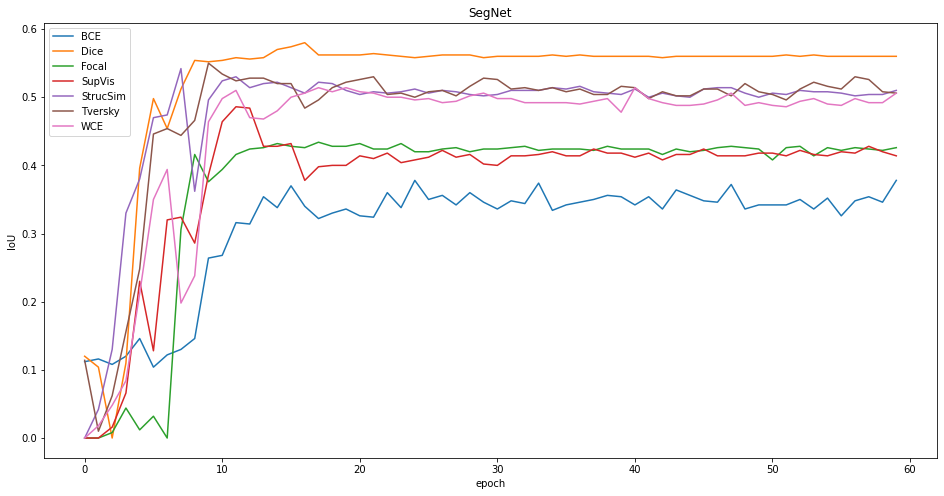

In [ ]:
plt.figure(figsize=(16, 8))

plt.plot(loss_seg_bce['val_score'], label='BCE')
plt.plot(loss_seg_dice['val_score'], label='Dice')
plt.plot(loss_seg_focal['val_score'], label='Focal')
plt.plot(loss_seg_supvis['val_score'], label='SupVis')
plt.plot(loss_seg_strucsim['val_score'], label='StrucSim')
plt.plot(loss_seg_tversky['val_score'], label='Tversky')
plt.plot(loss_seg_wce['val_score'], label='WCE')

plt.title('SegNet')
plt.xlabel('epoch')
plt.ylabel('IoU')
plt.legend()
plt.show()

Видим, что

*   После 15 эпохи качество предсказаний всех моделей уже значительно не менялось, то есть для обучения было достаточно 15-20 эпох.
*   `SegNet` с лоссом `Dice` обучилась быстрее и лучше всего.



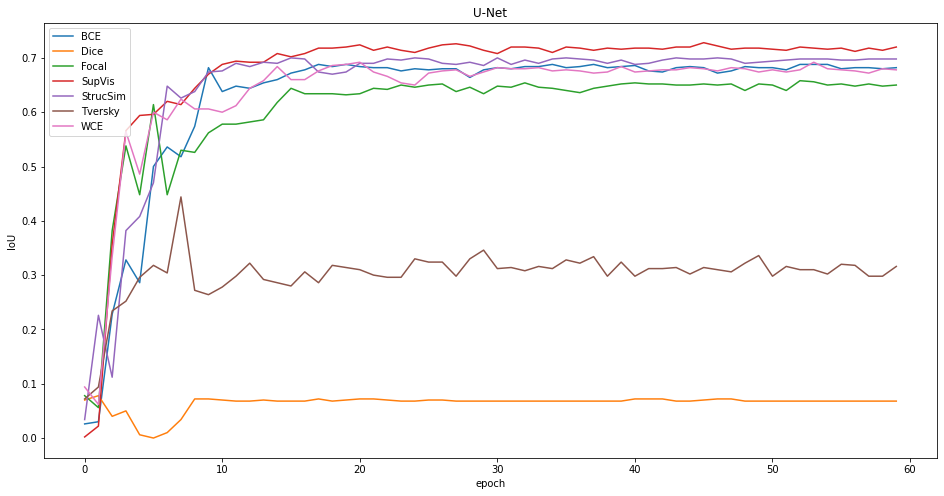

In [ ]:
plt.figure(figsize=(16, 8))

plt.plot(loss_unet_bce['val_score'], label='BCE')
plt.plot(loss_unet_dice['val_score'], label='Dice')
plt.plot(loss_unet_focal['val_score'], label='Focal')
plt.plot(loss_unet_supvis['val_score'], label='SupVis')
plt.plot(loss_unet_strucsim['val_score'], label='StrucSim')
plt.plot(loss_unet_tversky['val_score'], label='Tversky')
plt.plot(loss_unet_wce['val_score'], label='WCE')

plt.title('U-Net')
plt.xlabel('epoch')
plt.ylabel('IoU')
plt.legend()
plt.show()

Видно, что

*   Также как и у `SegNet`, для обучения `U-Net` было достаточно порядка 15 эпох.
*   В среднем качество предсказаний у `U-Net` лучше, чем у `SegNet`. Это было также показано и на барплотах в пунктах выше.
*   `Tversky` лосс и `Dice` в частности плохо отработали с `U-Net`, хотя эти лоссы для `SegNet`'а показали лучшие результаты.
*   Быстрее и лучше всего `U-Net` обучилась с `SupVis` лоссом.



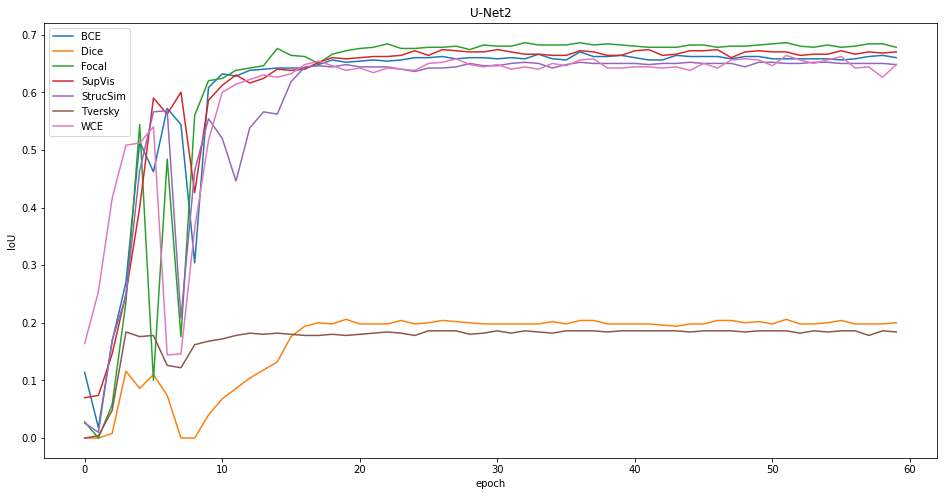

In [ ]:
plt.figure(figsize=(16, 8))

plt.plot(loss_unet2_bce['val_score'], label='BCE')
plt.plot(loss_unet2_dice['val_score'], label='Dice')
plt.plot(loss_unet2_focal['val_score'], label='Focal')
plt.plot(loss_unet2_supvis['val_score'], label='SupVis')
plt.plot(loss_unet2_strucsim['val_score'], label='StrucSim')
plt.plot(loss_unet2_tversky['val_score'], label='Tversky')
plt.plot(loss_unet2_wce['val_score'], label='WCE')

plt.title('U-Net2')
plt.xlabel('epoch')
plt.ylabel('IoU')
plt.legend()
plt.show()



*   Для `U-Net2` лоссом, с которым модель достигла лучшего качества, является `Focal`. В остальном для `U-Net2` справедливы те же утверждения, что и для `U-Net`. 
*   Видно, что на начальных этапах обучения значения метрики заметно колебались. Скорее всего это связано с не самым большим размером батчей.



Теперь посмотрим на то, как изменялись различные лоссы в процессе обучения

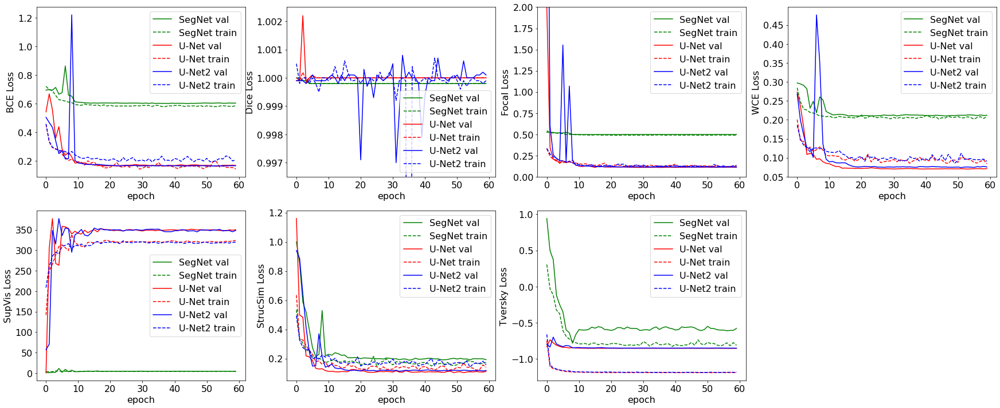

In [ ]:
fig, axs = plt.subplots(2, 4,figsize=(30, 12))

plt.rcParams['font.size'] = '16'
axs[0, 0].plot(loss_seg_bce['val_loss'], label='SegNet val', linestyle = '-', color='green')
axs[0, 0].plot(loss_seg_bce['train_loss'], label='SegNet train', linestyle = '--', color='green')
axs[0, 0].plot(loss_unet_bce['val_loss'], label='U-Net val', linestyle = '-', color='red')
axs[0, 0].plot(loss_unet_bce['train_loss'], label='U-Net train', linestyle = '--', color='red')
axs[0, 0].plot(loss_unet2_bce['val_loss'], label='U-Net2 val', linestyle = '-', color='blue')
axs[0, 0].plot(loss_unet2_bce['train_loss'], label='U-Net2 train', linestyle = '--', color='blue')
axs[0, 0].set(xlabel='epoch', ylabel='BCE Loss')
axs[0, 0].legend()

axs[0, 1].plot(loss_seg_dice['val_loss'], label='SegNet val', linestyle = '-', color='green')
axs[0, 1].plot(loss_seg_dice['train_loss'], label='SegNet train', linestyle = '--', color='green')
axs[0, 1].plot(loss_unet_dice['val_loss'], label='U-Net val', linestyle = '-', color='red')
axs[0, 1].plot(loss_unet_dice['train_loss'], label='U-Net train', linestyle = '--', color='red')
axs[0, 1].plot(loss_unet2_dice['val_loss'], label='U-Net2 val', linestyle = '-', color='blue')
axs[0, 1].plot(loss_unet2_dice['train_loss'], label='U-Net2 train', linestyle = '--', color='blue')
axs[0, 1].set(xlabel='epoch', ylabel='Dice Loss')
axs[0, 1].set_ylim((0.9965, 1.0025))
axs[0, 1].legend()

axs[0, 2].plot(loss_seg_focal['val_loss'], label='SegNet val', linestyle = '-', color='green')
axs[0, 2].plot(loss_seg_focal['train_loss'], label='SegNet train', linestyle = '--', color='green')
axs[0, 2].plot(loss_unet_focal['val_loss'], label='U-Net val', linestyle = '-', color='red')
axs[0, 2].plot(loss_unet_focal['train_loss'], label='U-Net train', linestyle = '--', color='red')
axs[0, 2].plot(loss_unet2_focal['val_loss'], label='U-Net2 val', linestyle = '-', color='blue')
axs[0, 2].plot(loss_unet2_focal['train_loss'], label='U-Net2 train', linestyle = '--', color='blue')
axs[0, 2].set(xlabel='epoch', ylabel='Focal Loss')
axs[0, 2].set_ylim((0, 2))
axs[0, 2].legend()

axs[1, 0].plot(loss_seg_supvis['val_loss'], label='SegNet val', linestyle = '-', color='green')
axs[1, 0].plot(loss_seg_supvis['train_loss'], label='SegNet train', linestyle = '--', color='green')
axs[1, 0].plot(loss_unet_supvis['val_loss'], label='U-Net val', linestyle = '-', color='red')
axs[1, 0].plot(loss_unet_supvis['train_loss'], label='U-Net train', linestyle = '--', color='red')
axs[1, 0].plot(loss_unet2_supvis['val_loss'], label='U-Net2 val', linestyle = '-', color='blue')
axs[1, 0].plot(loss_unet2_supvis['train_loss'], label='U-Net2 train', linestyle = '--', color='blue')
axs[1, 0].set(xlabel='epoch', ylabel='SupVis Loss')
axs[1, 0].legend()

axs[1, 1].plot(loss_seg_strucsim['val_loss'], label='SegNet val', linestyle = '-', color='green')
axs[1, 1].plot(loss_seg_strucsim['train_loss'], label='SegNet train', linestyle = '--', color='green')
axs[1, 1].plot(loss_unet_strucsim['val_loss'], label='U-Net val', linestyle = '-', color='red')
axs[1, 1].plot(loss_unet_strucsim['train_loss'], label='U-Net train', linestyle = '--', color='red')
axs[1, 1].plot(loss_unet2_strucsim['val_loss'], label='U-Net2 val', linestyle = '-', color='blue')
axs[1, 1].plot(loss_unet2_strucsim['train_loss'], label='U-Net2 train', linestyle = '--', color='blue')
axs[1, 1].set(xlabel='epoch', ylabel='StrucSim Loss')
axs[1, 1].legend()

axs[1, 2].plot(loss_seg_tversky['val_loss'], label='SegNet val', linestyle = '-', color='green')
axs[1, 2].plot(loss_seg_tversky['train_loss'], label='SegNet train', linestyle = '--', color='green')
axs[1, 2].plot(loss_unet_tversky['val_loss'], label='U-Net val', linestyle = '-', color='red')
axs[1, 2].plot(loss_unet_tversky['train_loss'], label='U-Net train', linestyle = '--', color='red')
axs[1, 2].plot(loss_unet2_tversky['val_loss'], label='U-Net2 val', linestyle = '-', color='blue')
axs[1, 2].plot(loss_unet2_tversky['train_loss'], label='U-Net2 train', linestyle = '--', color='blue')
axs[1, 2].set(xlabel='epoch', ylabel='Tversky Loss')
axs[1, 2].legend()

axs[0, 3].plot(loss_seg_wce['val_loss'], label='SegNet val', linestyle = '-', color='green')
axs[0, 3].plot(loss_seg_wce['train_loss'], label='SegNet train', linestyle = '--', color='green')
axs[0, 3].plot(loss_unet_wce['val_loss'], label='U-Net val', linestyle = '-', color='red')
axs[0, 3].plot(loss_unet_wce['train_loss'], label='U-Net train', linestyle = '--', color='red')
axs[0, 3].plot(loss_unet2_wce['val_loss'], label='U-Net2 val', linestyle = '-', color='blue')
axs[0, 3].plot(loss_unet2_wce['train_loss'], label='U-Net2 train', linestyle = '--', color='blue')
axs[0, 3].set(xlabel='epoch', ylabel='WCE Loss')
axs[0, 3].legend()

axs[1, 3].axis('off')

plt.show()

Из графиков выше видно, что


*   В процессе обучения функции потерь заметно колебались. Скорее всего это связано с малым размером батчей. В данном исследовании использовал небольшой их размер из-за ограничений на GPU.
*   Примерно после 20-ой эпохи значения функций потерь значительно не изменялись.
*   Динамика лоссов у `U-Net` и `U-Net2` очень похожа, что в очередной раз подчеркивает схожесть их архитектур.
*   Амплитуда 'выбросов' лоссов у `U-Net2` самая большая, у `SegNet` самая маленькая. Полагаю, что это следствие того, что нейронные сети с большим числом обучаемых параметров более склоны к переобучению.
*    Заметного переобучения у наших моделей нет. Кривые лоссов для валидационных и тестовых данных достаточно близки, а также нет каких-то эпох, после которых разница функций потерь на тесте и валидации бы начинала расти.



Ранее мы смотрели на изменение метрики в процессе обучения для фиксированных нейронных сетей при различных лоссах. Теперь давайте посмотрим, на то, как менялась IoU метрика при фиксированных лоссах и разных нейронных сетях

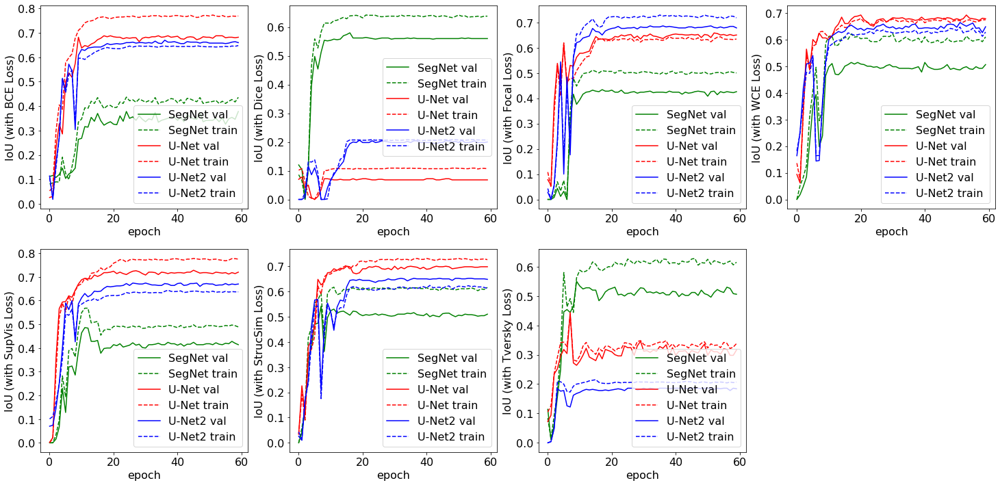

In [ ]:
fig, axs = plt.subplots(2, 4, figsize=(25, 12))

plt.rcParams['font.size'] = '16'
axs[0, 0].plot(loss_seg_bce['val_score'], label='SegNet val', linestyle = '-', color='green')
axs[0, 0].plot(loss_seg_bce['train_score'], label='SegNet train', linestyle = '--', color='green')
axs[0, 0].plot(loss_unet_bce['val_score'], label='U-Net val', linestyle = '-', color='red')
axs[0, 0].plot(loss_unet_bce['train_score'], label='U-Net train', linestyle = '--', color='red')
axs[0, 0].plot(loss_unet2_bce['val_score'], label='U-Net2 val', linestyle = '-', color='blue')
axs[0, 0].plot(loss_unet2_bce['train_score'], label='U-Net2 train', linestyle = '--', color='blue')
axs[0, 0].set(xlabel='epoch', ylabel='IoU (with BCE Loss)')
axs[0, 0].legend()

axs[0, 1].plot(loss_seg_dice['val_score'], label='SegNet val', linestyle = '-', color='green')
axs[0, 1].plot(loss_seg_dice['train_score'], label='SegNet train', linestyle = '--', color='green')
axs[0, 1].plot(loss_unet_dice['val_score'], label='U-Net val', linestyle = '-', color='red')
axs[0, 1].plot(loss_unet_dice['train_score'], label='U-Net train', linestyle = '--', color='red')
axs[0, 1].plot(loss_unet2_dice['val_score'], label='U-Net2 val', linestyle = '-', color='blue')
axs[0, 1].plot(loss_unet2_dice['train_score'], label='U-Net2 train', linestyle = '--', color='blue')
axs[0, 1].set(xlabel='epoch', ylabel='IoU (with Dice Loss)')
axs[0, 1].legend(loc=7)

axs[0, 2].plot(loss_seg_focal['val_score'], label='SegNet val', linestyle = '-', color='green')
axs[0, 2].plot(loss_seg_focal['train_score'], label='SegNet train', linestyle = '--', color='green')
axs[0, 2].plot(loss_unet_focal['val_score'], label='U-Net val', linestyle = '-', color='red')
axs[0, 2].plot(loss_unet_focal['train_score'], label='U-Net train', linestyle = '--', color='red')
axs[0, 2].plot(loss_unet2_focal['val_score'], label='U-Net2 val', linestyle = '-', color='blue')
axs[0, 2].plot(loss_unet2_focal['train_score'], label='U-Net2 train', linestyle = '--', color='blue')
axs[0, 2].set(xlabel='epoch', ylabel='IoU (with Focal Loss)')
axs[0, 2].legend()

axs[1, 0].plot(loss_seg_supvis['val_score'], label='SegNet val', linestyle = '-', color='green')
axs[1, 0].plot(loss_seg_supvis['train_score'], label='SegNet train', linestyle = '--', color='green')
axs[1, 0].plot(loss_unet_supvis['val_score'], label='U-Net val', linestyle = '-', color='red')
axs[1, 0].plot(loss_unet_supvis['train_score'], label='U-Net train', linestyle = '--', color='red')
axs[1, 0].plot(loss_unet2_supvis['val_score'], label='U-Net2 val', linestyle = '-', color='blue')
axs[1, 0].plot(loss_unet2_supvis['train_score'], label='U-Net2 train', linestyle = '--', color='blue')
axs[1, 0].set(xlabel='epoch', ylabel='IoU (with SupVis Loss)')
axs[1, 0].legend()

axs[1, 1].plot(loss_seg_strucsim['val_score'], label='SegNet val', linestyle = '-', color='green')
axs[1, 1].plot(loss_seg_strucsim['train_score'], label='SegNet train', linestyle = '--', color='green')
axs[1, 1].plot(loss_unet_strucsim['val_score'], label='U-Net val', linestyle = '-', color='red')
axs[1, 1].plot(loss_unet_strucsim['train_score'], label='U-Net train', linestyle = '--', color='red')
axs[1, 1].plot(loss_unet2_strucsim['val_score'], label='U-Net2 val', linestyle = '-', color='blue')
axs[1, 1].plot(loss_unet2_strucsim['train_score'], label='U-Net2 train', linestyle = '--', color='blue')
axs[1, 1].set(xlabel='epoch', ylabel='IoU (with StrucSim Loss)')
axs[1, 1].legend()

axs[1, 2].plot(loss_seg_tversky['val_score'], label='SegNet val', linestyle = '-', color='green')
axs[1, 2].plot(loss_seg_tversky['train_score'], label='SegNet train', linestyle = '--', color='green')
axs[1, 2].plot(loss_unet_tversky['val_score'], label='U-Net val', linestyle = '-', color='red')
axs[1, 2].plot(loss_unet_tversky['train_score'], label='U-Net train', linestyle = '--', color='red')
axs[1, 2].plot(loss_unet2_tversky['val_score'], label='U-Net2 val', linestyle = '-', color='blue')
axs[1, 2].plot(loss_unet2_tversky['train_score'], label='U-Net2 train', linestyle = '--', color='blue')
axs[1, 2].set(xlabel='epoch', ylabel='IoU (with Tversky Loss)')
axs[1, 2].legend(loc=4)

axs[0, 3].plot(loss_seg_wce['val_score'], label='SegNet val', linestyle = '-', color='green')
axs[0, 3].plot(loss_seg_wce['train_score'], label='SegNet train', linestyle = '--', color='green')
axs[0, 3].plot(loss_unet_wce['val_score'], label='U-Net val', linestyle = '-', color='red')
axs[0, 3].plot(loss_unet_wce['train_score'], label='U-Net train', linestyle = '--', color='red')
axs[0, 3].plot(loss_unet2_wce['val_score'], label='U-Net2 val', linestyle = '-', color='blue')
axs[0, 3].plot(loss_unet2_wce['train_score'], label='U-Net2 train', linestyle = '--', color='blue')
axs[0, 3].set(xlabel='epoch', ylabel='IoU (with WCE Loss)')
axs[0, 3].legend()

axs[1, 3].axis('off')

plt.show()

Видим, что


*   Скорость обучения всех трёх нейронных сетей примерно похожа (15-20 эпох).
*   `WCE` лосс неплохо отработал со всеми сетями.
*   `Tversky` и `Dice` показали лучший результат с `SegNet`'ом, с остальными лоссами лучше справились `U-Net`'ы.


<a id='improve'></a>
## Что можно было бы улучшить? 🤔
*   В данном исследовании не подбирались гиперпараметры для функций потерь, оптимизаторов и шедулеров. Для всех трёх архитектур нейронных сетей при обучении использовались одинаковые внешние (гипер-) параметры оптимизаторов, лоссов и т.д. Понятно, что на практике для более точного решения задачи это стоило бы сделать. Это могло бы заметно улучшить качество работы моделей.

*   Кроме того, качество решения задачи можно было улучшить, поработав с самими данными. Например, выполнив их аугментацию. С учетом, что имеющийся датасет не такой большой, я думаю, что это могло бы заметно повысить качество предсказаний.

*   Для более объективного сравнения каждой из пар (нейронная сеть + лосс) стоило бы обучать их не по одному разу, а полученные результаты усреднить, поскольку в обучении присутствует некоторая случайонсть (например, при инициализации внутренних параметров сети).



---
---

На этом наше небольшое путешествие в мир сегментационных лоссов заканчивается! Спасибо за внимание 👋

<img src="https://coub-anubis-a.akamaized.net/coub_storage/coub/simple/cw_timeline_pic/332eabc8cee/abe070e4bd7ab61f9a89e/1558271125_image.jpg" width="400" height="300">